In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
%matplotlib inline

In [2]:
df=pd.read_csv('cars.csv')

# BASIC INFORMATIONS

In [3]:
df.head(10)

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,...,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,Tata,Nano Genx,Xma,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,Renault,Kwid,Rxe 0.8,799.0,3.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,Renault,Kwid,Std 0.8,799.0,3.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,Renault,Kwid,Rxl 0.8,799.0,3.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,Renault,Kwid,Rxt 0.8,799.0,3.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
col = list(df.columns)
print(col)
print(df.shape)

['Sl. No.', 'Make', 'Model', 'Variant', 'Displacement', 'Cylinders', 'Valves_Per_Cylinder', 'Drivetrain', 'Cylinder_Configuration', 'Engine_Location', 'Fuel_System', 'Fuel_Tank_Capacity_litre', 'Fuel_Type', 'Height_mm', 'Length_mm', 'Width_mm', 'Body_Type', 'Doors', 'City_Mileage_km_litre', 'Highway_Mileage_km_litre', 'ARAI_Certified_Mileage', 'ARAI_Certified_Mileage_for_CNG', 'Kerb_Weight', 'Gears', 'Ground_Clearance', 'Front_Brakes', 'Rear_Brakes', 'Front_Suspension', 'Rear_Suspension', 'Front_Track', 'Rear_Track', 'Front_Tyre_&_Rim', 'Rear_Tyre_&_Rim', 'Power_Steering', 'Power_Windows', 'Power_Seats', 'Keyless_Entry', 'Power', 'Torque', 'Odometer', 'Speedometer', 'Tachometer', 'Tripmeter', 'Seating_Capacity', 'Seats_Material', 'Type', 'Wheelbase', 'Wheels_Size', 'Start_/_Stop_Button', '12v_Power_Outlet', 'Audiosystem', 'Aux-in_Compatibility', 'Average_Fuel_Consumption', 'Basic_Warranty', 'Bluetooth', 'Boot-lid_Opener', 'Boot_Space_litre', 'CD_/_MP3_/_DVD_Player', 'Central_Locking', 

In [5]:
df.shape

(787, 139)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Columns: 139 entries, Sl. No. to Electric_Range
dtypes: float64(12), int64(4), object(123)
memory usage: 854.8+ KB


# UNIVARIATE ANALYSIS

In [7]:
ftc = df['Fuel_Tank_Capacity_litre']
mean = ftc.mean()
print("Mean:")
print(mean)

median = ftc.median()
print("\nMedian:")
print(median)

mode = ftc.mode()
print("\nMode:")
print(mode)

max_val = ftc.max()
print("\nMaximum value:")
print(max_val)

min_val = ftc.min()
print("\nMinimum value:")
print(min_val)


data_range = ftc.max() - ftc.min()
print("\nData range:")
print(data_range)

variance = ftc.var()
print("\nVairance:")
print(variance)

std_deviation = ftc.std()
print("\nstd dev:")
print(std_deviation)

iqr = ftc.quantile(0.75) - ftc.quantile(0.25)
print("\ninterquartilerange:")
print(iqr)

nulvals = df.isnull().sum() #good to have
print('\nNulValues:')
print(nulvals)

Mean:
46.84361979166667

Median:
45.0

Mode:
0    45.0
Name: Fuel_Tank_Capacity_litre, dtype: float64

Maximum value:
93.0

Minimum value:
15.0

Data range:
78.0

Vairance:
141.55205832722166

std dev:
11.897565226852999

interquartilerange:
18.0

NulValues:
Sl. No.               0
Make                  0
Model                 0
Variant               0
Displacement          9
                   ... 
USB_Ports           779
Heads-Up_Display    768
Welcome_Lights      762
Battery             776
Electric_Range      774
Length: 139, dtype: int64


In [8]:
def imp_infos(df):
    mean = df.mean()
    print("\nMean:")
    print(mean)

    median = df.median()
    print("\nMedian:")
    print(median)

    mode = df.mode()
    print("\nMode:")
    print(mode)

    max_val = df.max()
    print("\nMaximum value:")
    print(max_val)

    min_val = df.min()
    print("\nMinimum value:")
    print(min_val)

    data_range = df.max() - df.min()
    print("\nData range:")
    print(data_range)

    variance = df.var()
    print("\nVairance:")
    print(variance)

    std_deviation = df.std()
    print("\nstd dev:")
    print(std_deviation)

    iqr = df.quantile(0.75) - df.quantile(0.25)
    print("\ninterquartilerange:")
    print(iqr)
    
    nulvals = df.isnull().sum() #good to have
    print('\nNulValues:')
    print(nulvals)
    
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df, kde=True)
    plt.title("Histogram")
    plt.xlabel("Values")
    plt.ylabel("Frequency")
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df)
    plt.title("Box Plot")
    plt.xlabel("Data")
    plt.ylabel("Values")
    plt.show()
    


Mean:
1515.8650385604112

Median:
1396.5

Mode:
0    1197.0
Name: Displacement, dtype: float64

Maximum value:
6592.0

Minimum value:
72.0

Data range:
6520.0

Vairance:
316257.6921866783

std dev:
562.3679331066791

interquartilerange:
394.0

NulValues:
9


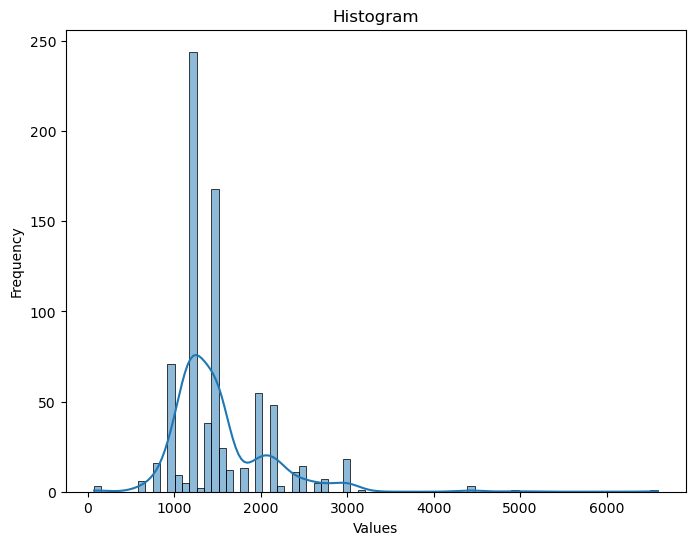

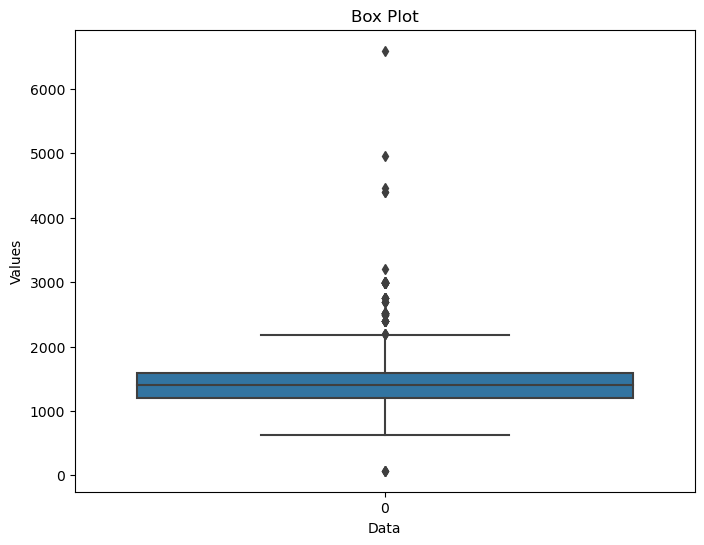

In [9]:
imp_infos(df['Displacement'])


Mean:
3.824631860776439

Median:
4.0

Mode:
0    4.0
Name: Cylinders, dtype: float64

Maximum value:
12.0

Minimum value:
2.0

Data range:
10.0

Vairance:
0.5201431283669062

std dev:
0.7212094899312587

interquartilerange:
1.0

NulValues:
40


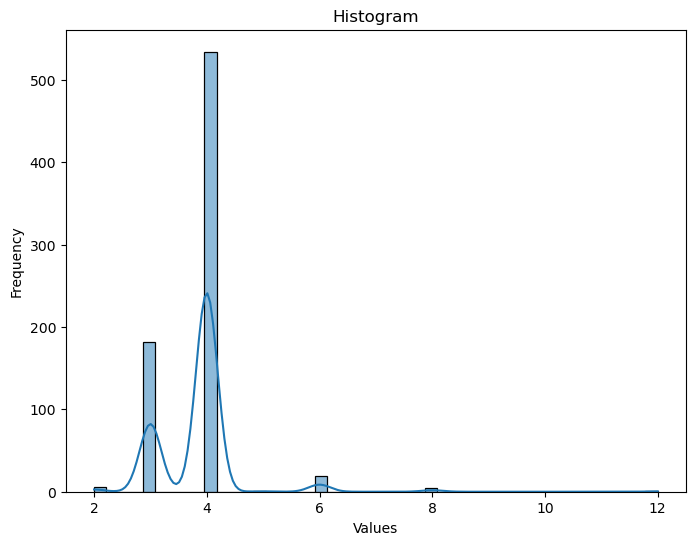

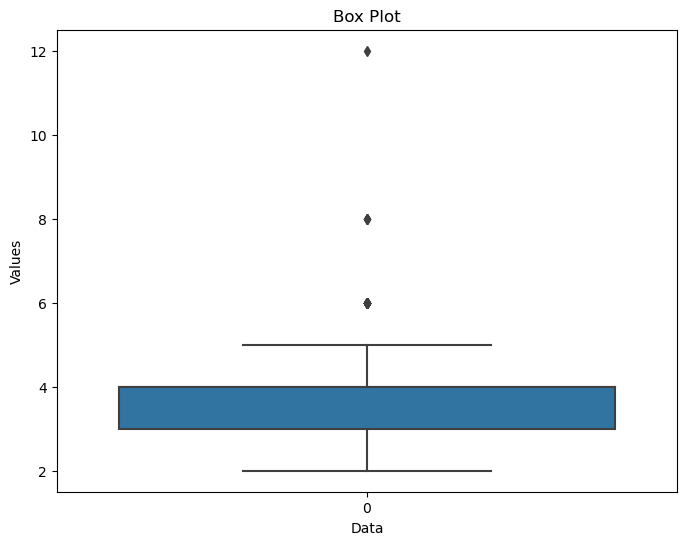

In [10]:
imp_infos(df['Cylinders'])


Mean:
3.8898071625344355

Median:
4.0

Mode:
0    4.0
Name: Valves_Per_Cylinder, dtype: float64

Maximum value:
4.0

Minimum value:
2.0

Data range:
2.0

Vairance:
0.20577182483138345

std dev:
0.45362079409059664

interquartilerange:
0.0

NulValues:
61


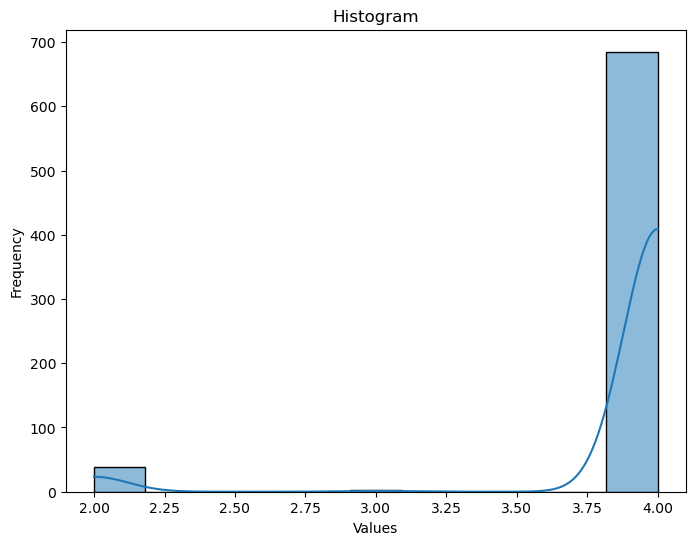

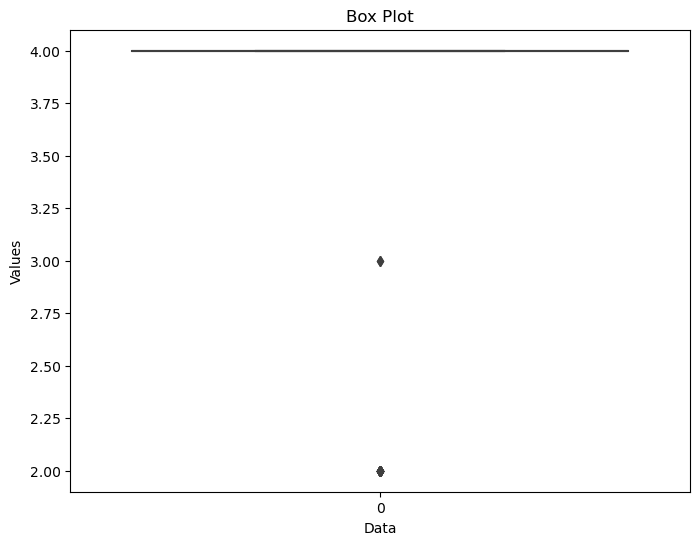

In [11]:
imp_infos(df['Valves_Per_Cylinder'])


Mean:
46.84361979166667

Median:
45.0

Mode:
0    45.0
Name: Fuel_Tank_Capacity_litre, dtype: float64

Maximum value:
93.0

Minimum value:
15.0

Data range:
78.0

Vairance:
141.55205832722166

std dev:
11.897565226852999

interquartilerange:
18.0

NulValues:
19


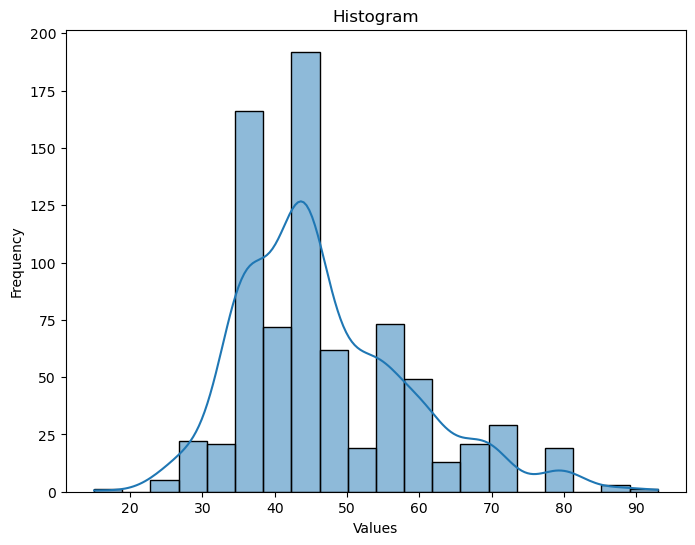

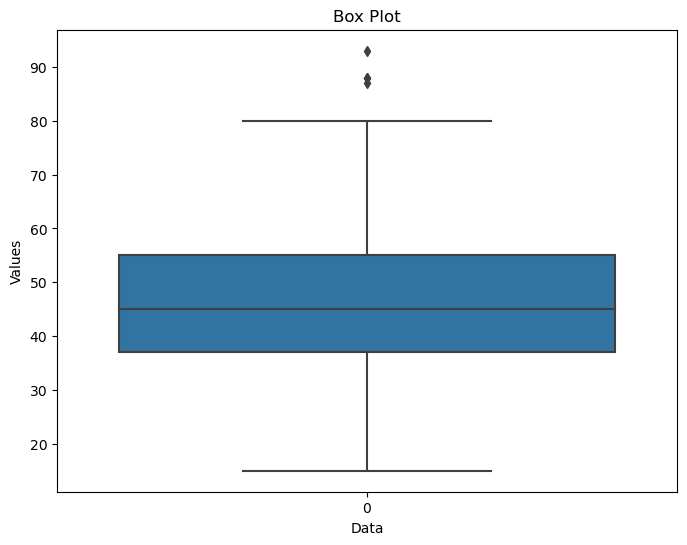

In [12]:
imp_infos(df['Fuel_Tank_Capacity_litre'])


Mean:
1598.4714104193138

Median:
1560.0

Mode:
0    1520
Name: Height_mm, dtype: int64

Maximum value:
2670

Minimum value:
1304

Data range:
1366

Vairance:
17418.127362257568

std dev:
131.97775328538356

interquartilerange:
145.0

NulValues:
0


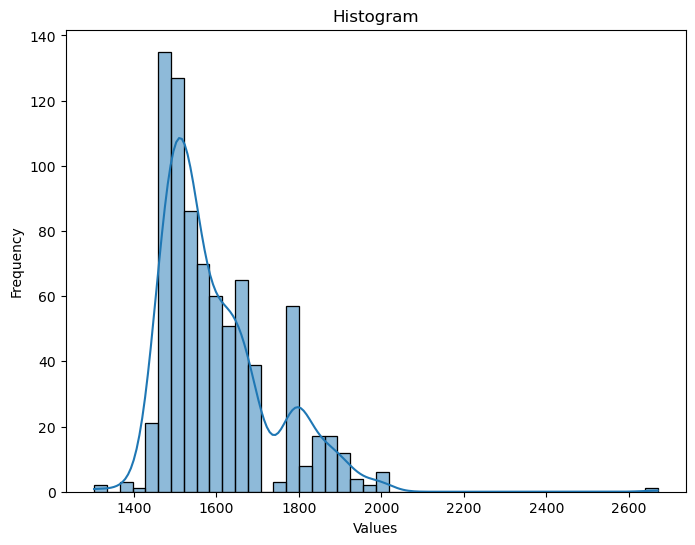

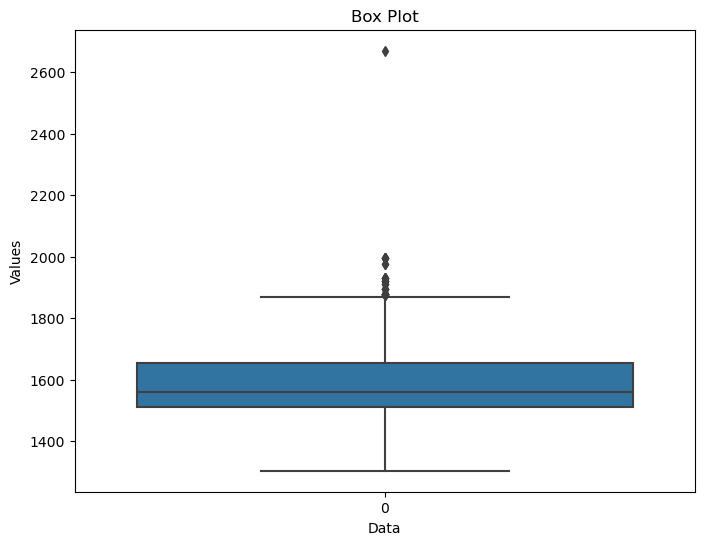

In [13]:
imp_infos(df['Height_mm'])


Mean:
4150.581956797967

Median:
3995.0

Mode:
0    3995
Name: Length_mm, dtype: int64

Maximum value:
5458

Minimum value:
3164

Data range:
2294

Vairance:
160521.0044068532

std dev:
400.6507262028277

interquartilerange:
550.0

NulValues:
0


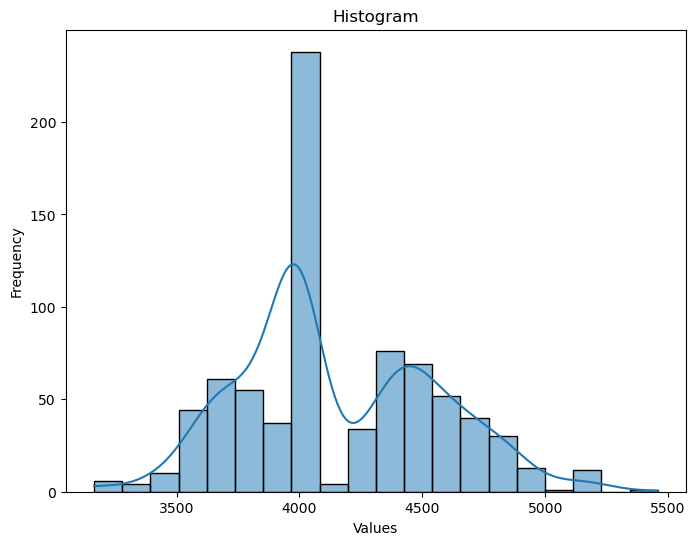

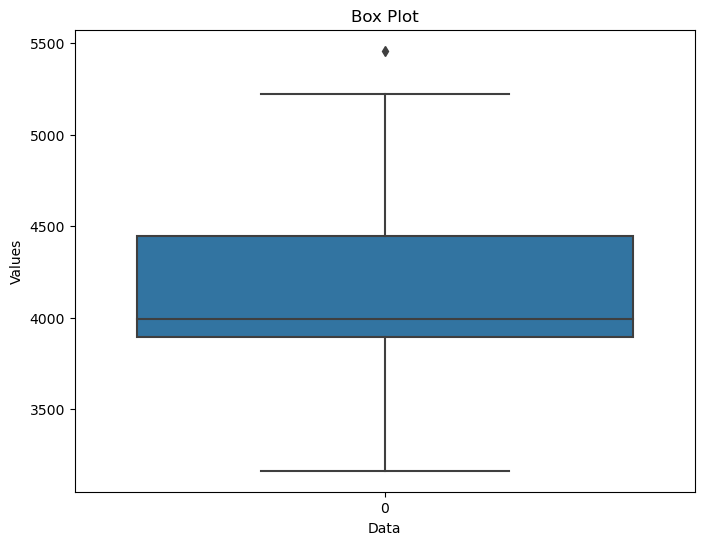

In [14]:
imp_infos(df['Length_mm'])


Mean:
1748.161372299873

Median:
1735.0

Mode:
0    1735
Name: Width_mm, dtype: int64

Maximum value:
2218

Minimum value:
1410

Data range:
808

Vairance:
12289.60369684225

std dev:
110.85848500156517

interquartilerange:
119.0

NulValues:
0


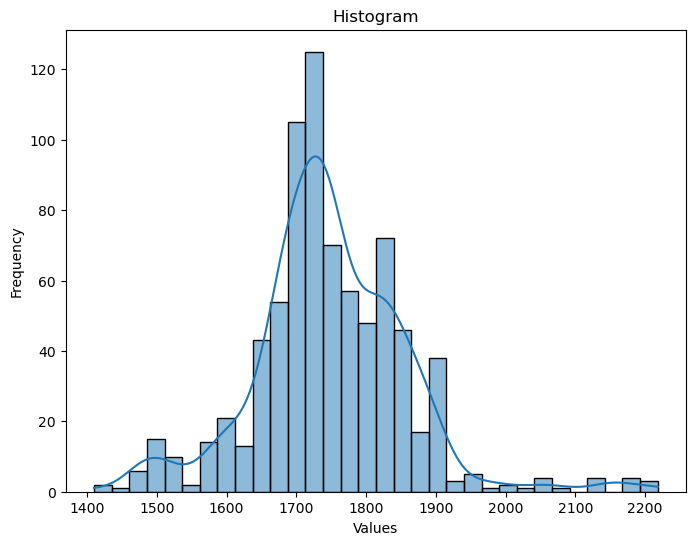

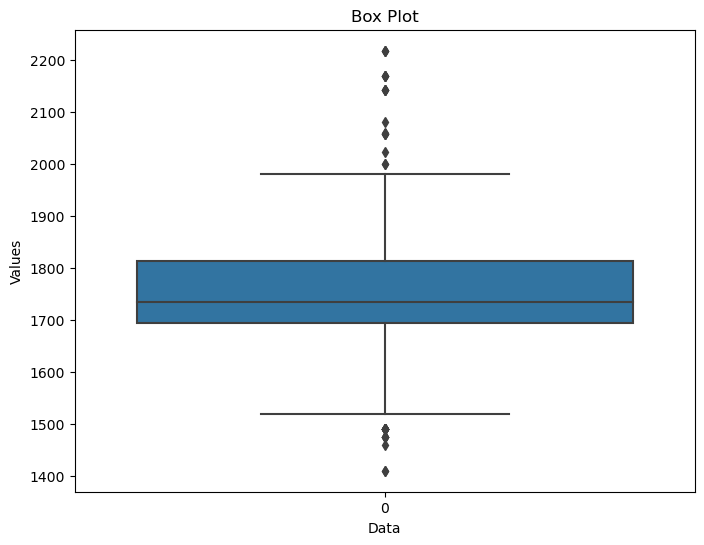

In [15]:
imp_infos(df['Width_mm'])


Mean:
17.403384279475972

Median:
16.3

Mode:
0    16.0
Name: City_Mileage_km_litre, dtype: float64

Maximum value:
80.0

Minimum value:
4.45

Data range:
75.55

Vairance:
40.452366420933956

std dev:
6.360217482204044

interquartilerange:
7.59

NulValues:
329


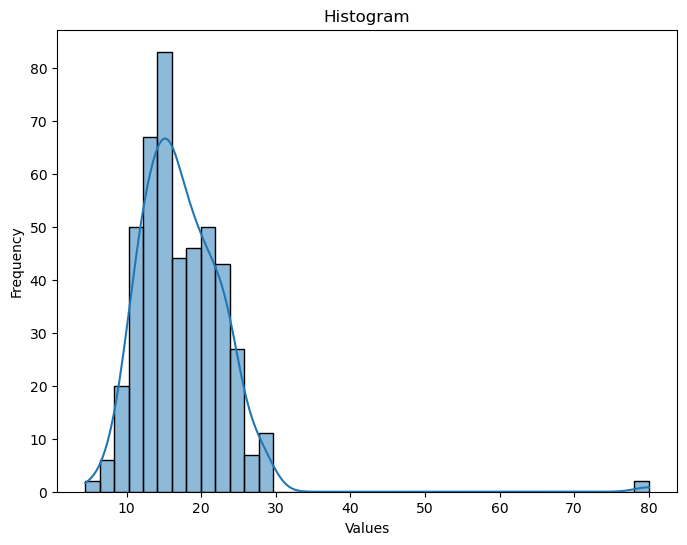

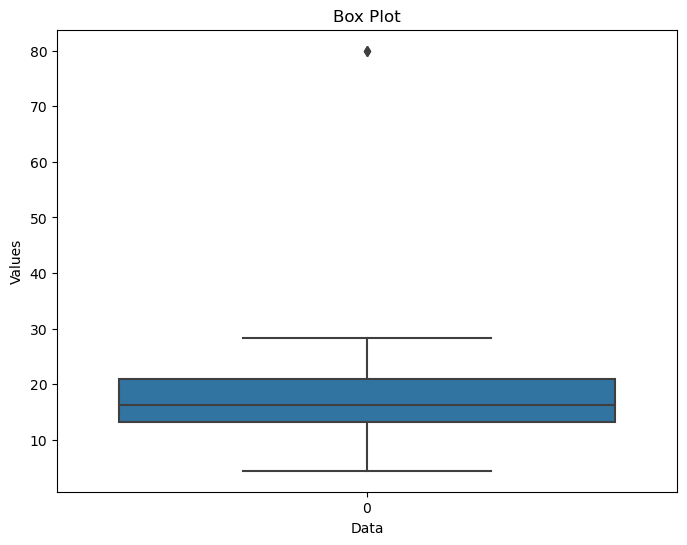

In [16]:
imp_infos(df['City_Mileage_km_litre'])


Mean:
358.4390243902439

Median:
347.5

Mode:
0    350.0
Name: Boot_Space_litre, dtype: float64

Maximum value:
981.0

Minimum value:
94.0

Data range:
887.0

Vairance:
18808.839024390276

std dev:
137.14532082572222

interquartilerange:
204.0

NulValues:
131


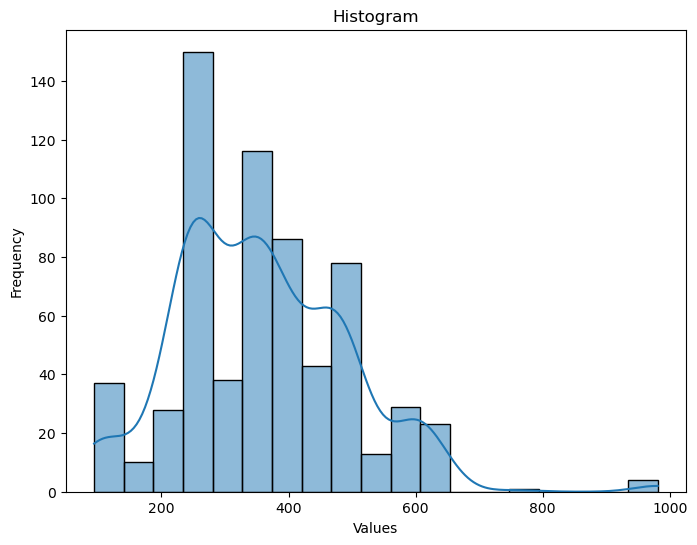

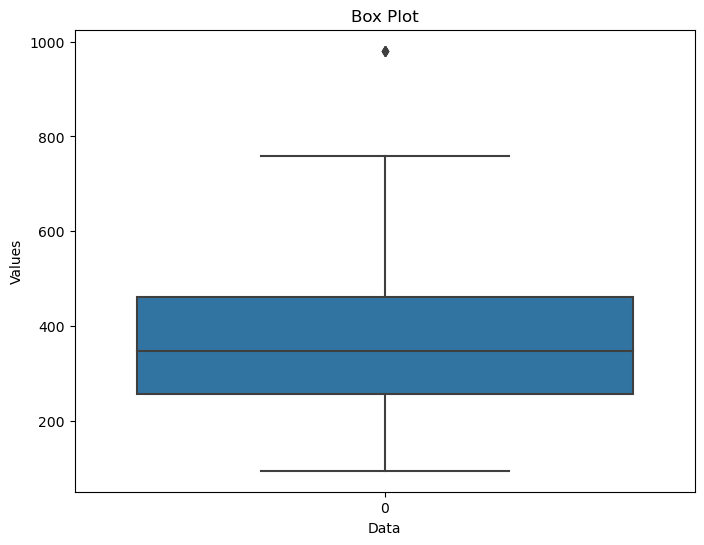

In [17]:
imp_infos(df['Boot_Space_litre'])


Mean:
4.681528662420382

Median:
5.0

Mode:
0    5.0
Name: Doors, dtype: float64

Maximum value:
5.0

Minimum value:
2.0

Data range:
3.0

Vairance:
0.27089561939425777

std dev:
0.5204763389379558

interquartilerange:
1.0

NulValues:
2


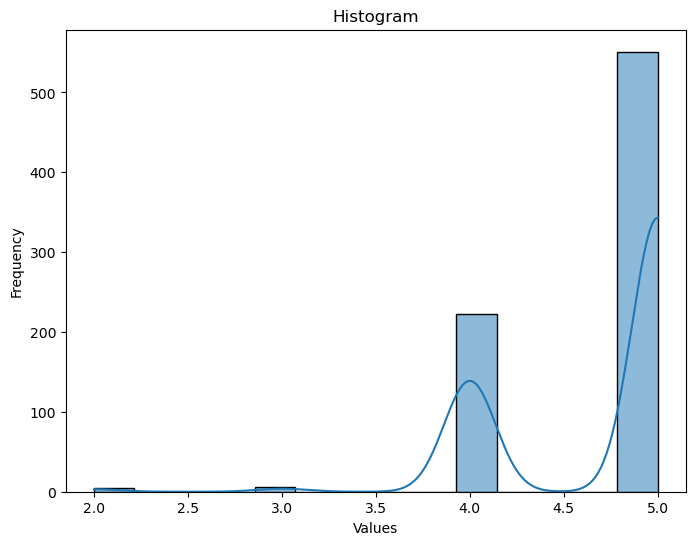

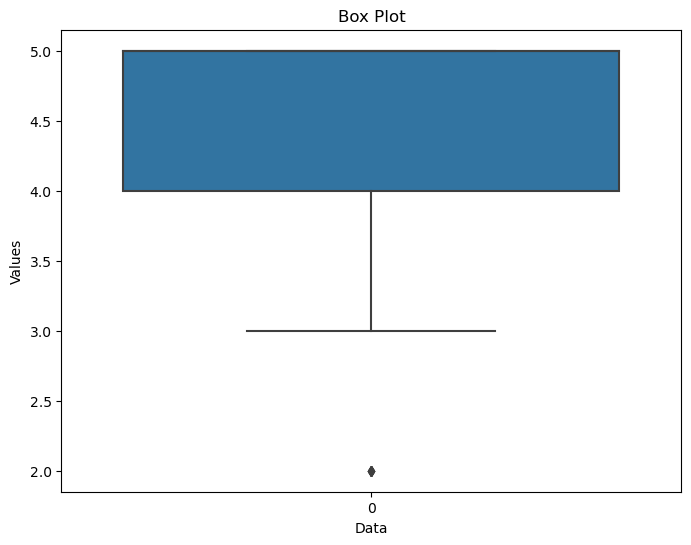

In [18]:
imp_infos(df['Doors'])


Mean:
5.394132653061225

Median:
5.0

Mode:
0    5.0
Name: Seating_Capacity, dtype: float64

Maximum value:
16.0

Minimum value:
2.0

Data range:
14.0

Vairance:
1.0334776630958915

std dev:
1.0166010343767566

interquartilerange:
0.0

NulValues:
3


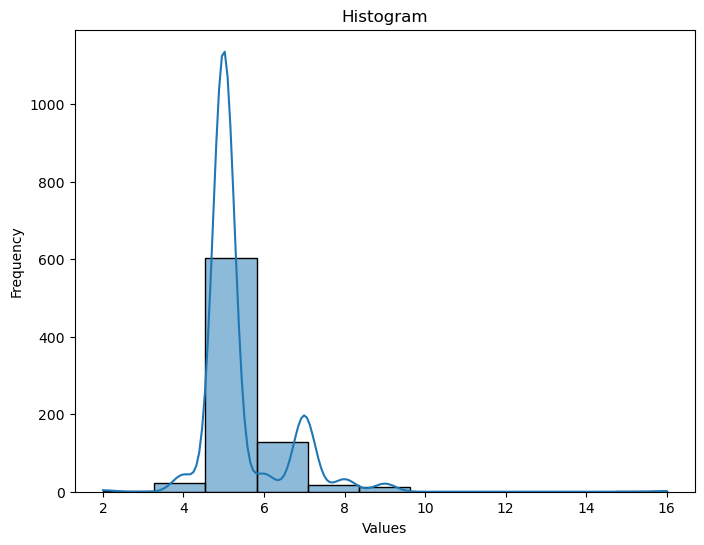

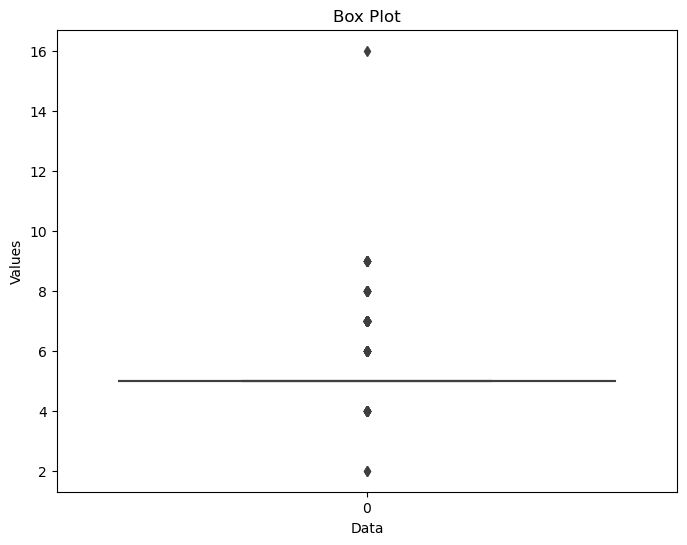

In [19]:
imp_infos(df['Seating_Capacity'])

In [20]:
description = df.describe()
description_table = pd.DataFrame(description)
print(description_table)

          Sl. No.  Displacement   Cylinders  Valves_Per_Cylinder  \
count  787.000000    778.000000  747.000000           726.000000   
mean   394.000000   1515.865039    3.824632             3.889807   
std    227.331623    562.367933    0.721209             0.453621   
min      1.000000     72.000000    2.000000             2.000000   
25%    197.500000   1197.000000    3.000000             4.000000   
50%    394.000000   1396.500000    4.000000             4.000000   
75%    590.500000   1591.000000    4.000000             4.000000   
max    787.000000   6592.000000   12.000000             4.000000   

       Fuel_Tank_Capacity_litre    Height_mm    Length_mm     Width_mm  \
count                768.000000   787.000000   787.000000   787.000000   
mean                  46.843620  1598.471410  4150.581957  1748.161372   
std                   11.897565   131.977753   400.650726   110.858485   
min                   15.000000  1304.000000  3164.000000  1410.000000   
25%              

Column: Sl. No.
Measures of Central Tendency:
Mean: 394.0
Median: 394.0
Mode: 1

Measures of Dispersion:
Standard Deviation: 227.1871475237981
Variance: 51614.0
Range: 786
Minimum: 1
Maximum: 787


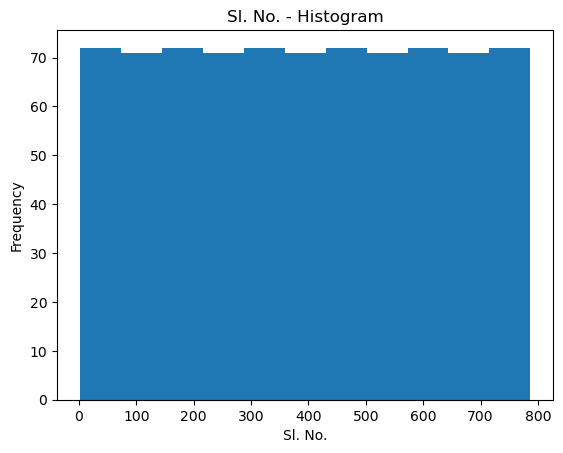

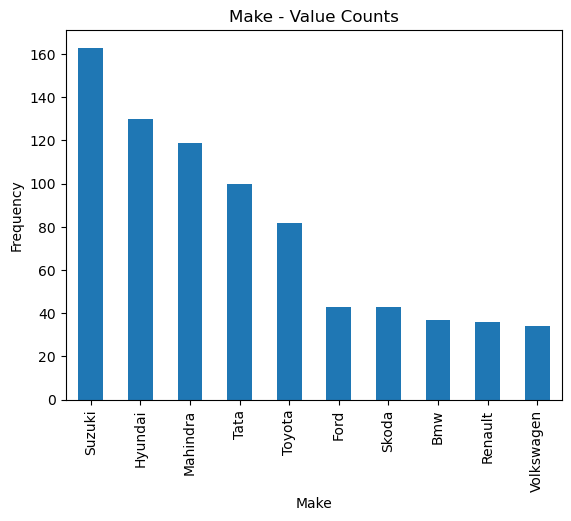

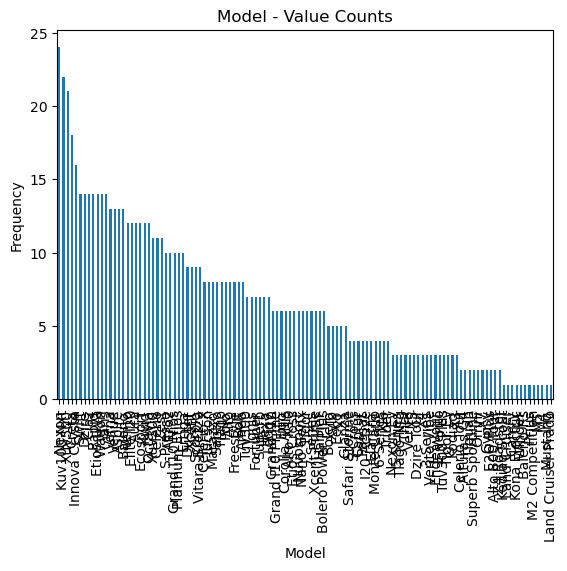

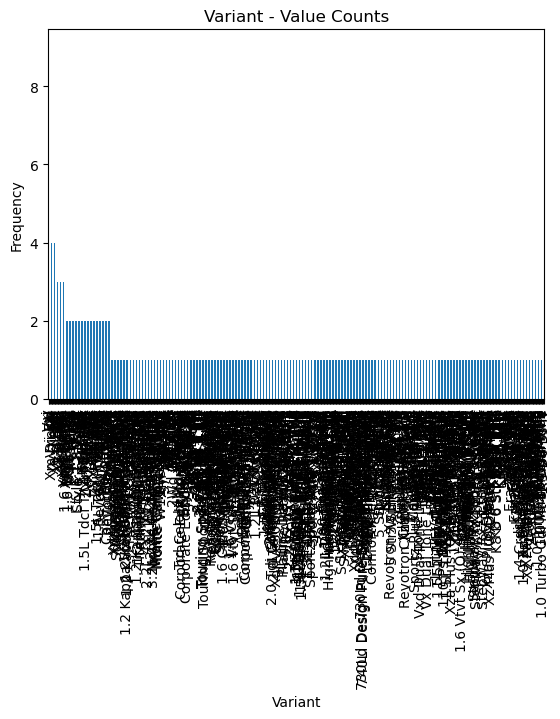

Column: Displacement
Measures of Central Tendency:
Mean: 1515.8650385604112
Median: nan
Mode: 1197.0

Measures of Dispersion:
Standard Deviation: 562.0063979146307
Variance: 315851.1912969782
Range: nan
Minimum: 72.0
Maximum: 6592.0


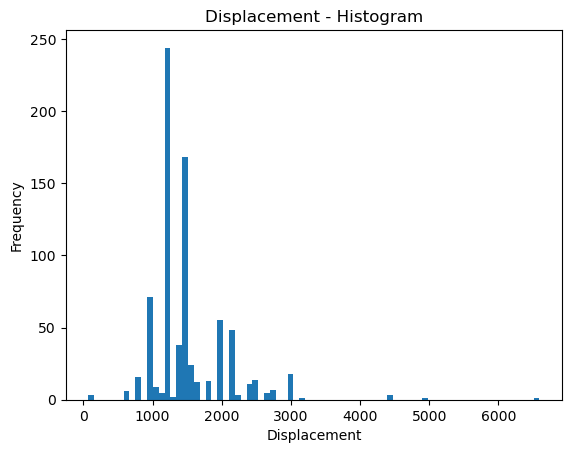

Column: Cylinders
Measures of Central Tendency:
Mean: 3.824631860776439
Median: nan
Mode: 4.0

Measures of Dispersion:
Standard Deviation: 0.7207265909886461
Variance: 0.5194468189581152
Range: nan
Minimum: 2.0
Maximum: 12.0


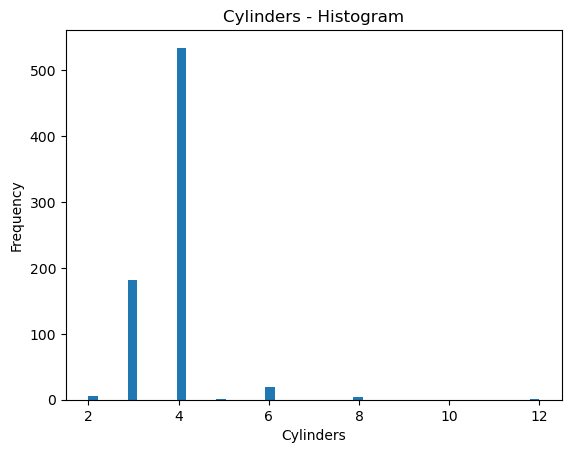

Column: Valves_Per_Cylinder
Measures of Central Tendency:
Mean: 3.8898071625344355
Median: nan
Mode: 4.0

Measures of Dispersion:
Standard Deviation: 0.45330827542167756
Variance: 0.2054883925657755
Range: nan
Minimum: 2.0
Maximum: 4.0


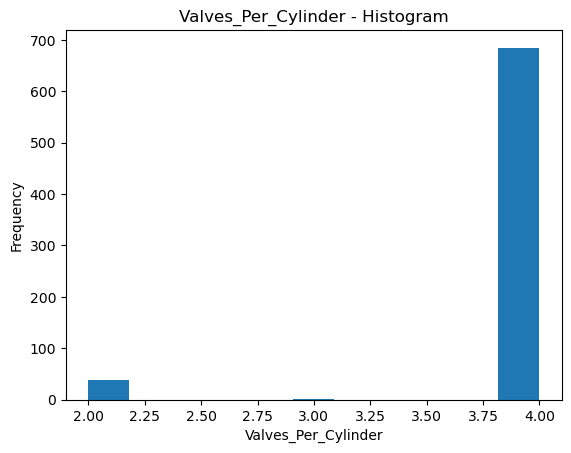

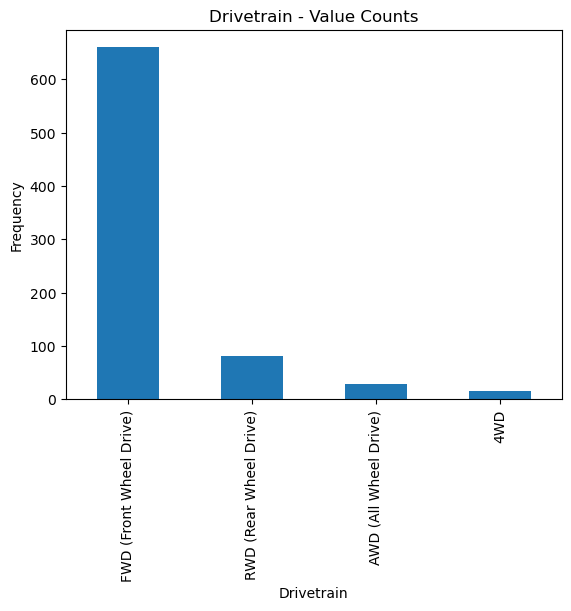

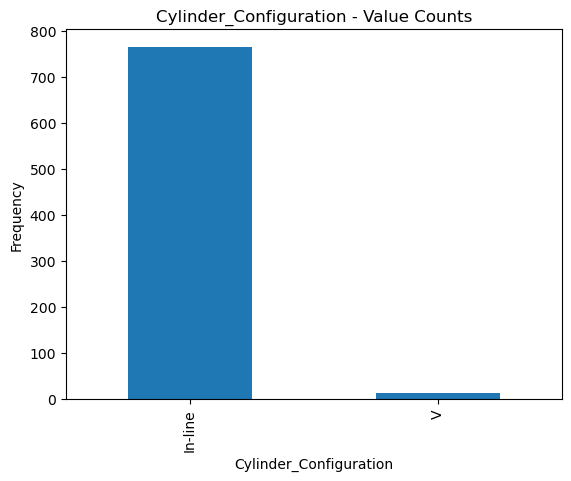

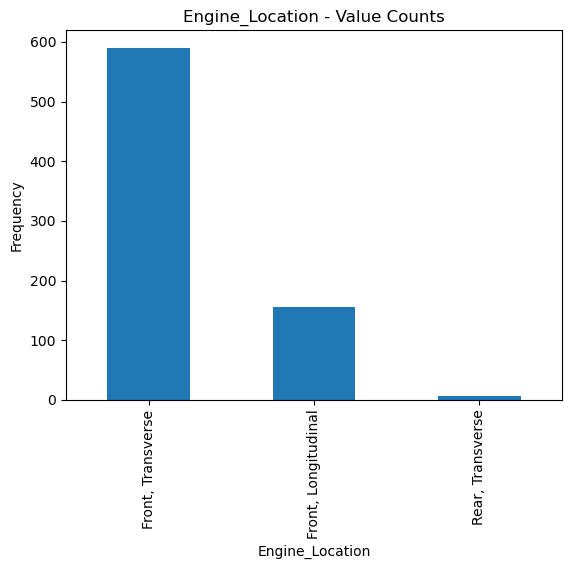

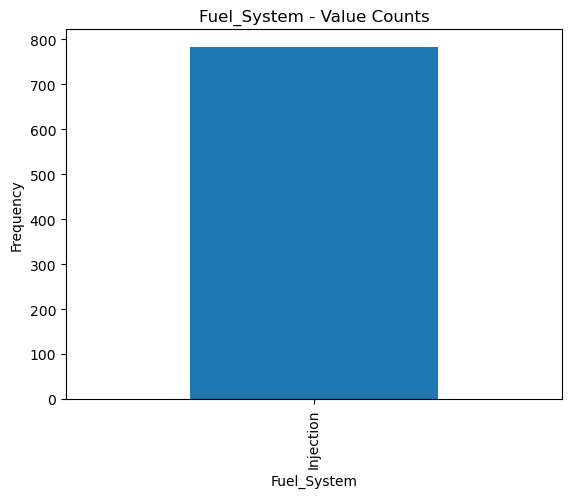

Column: Fuel_Tank_Capacity_litre
Measures of Central Tendency:
Mean: 46.84361979166667
Median: nan
Mode: 45.0

Measures of Dispersion:
Standard Deviation: 11.889816893092792
Variance: 141.36774575127475
Range: nan
Minimum: 15.0
Maximum: 93.0


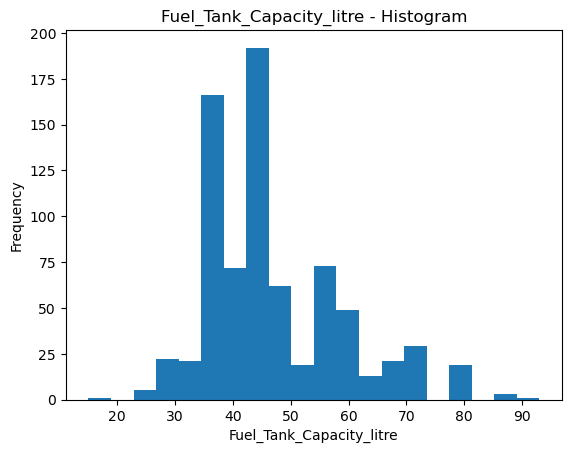

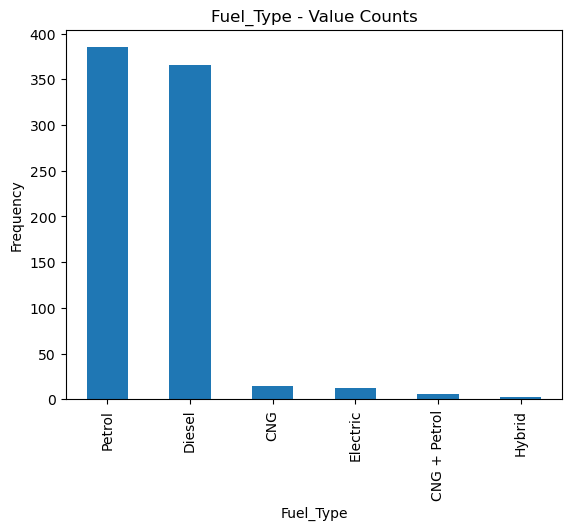

Column: Height_mm
Measures of Central Tendency:
Mean: 1598.4714104193138
Median: 1560.0
Mode: 1520

Measures of Dispersion:
Standard Deviation: 131.89387799678116
Variance: 17395.995053029794
Range: 1366
Minimum: 1304
Maximum: 2670


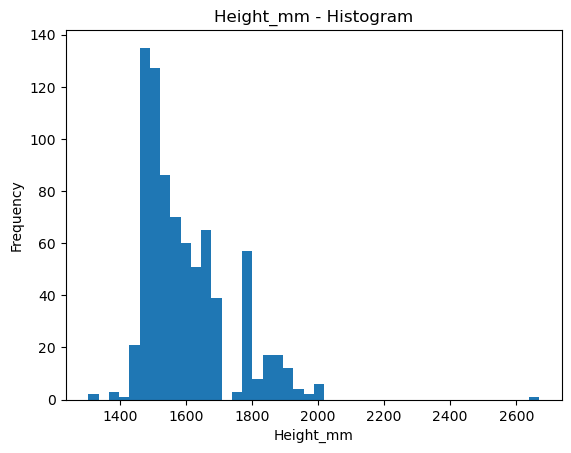

Column: Length_mm
Measures of Central Tendency:
Mean: 4150.581956797967
Median: 3995.0
Mode: 3995

Measures of Dispersion:
Standard Deviation: 400.396102264683
Variance: 160317.03870875048
Range: 2294
Minimum: 3164
Maximum: 5458


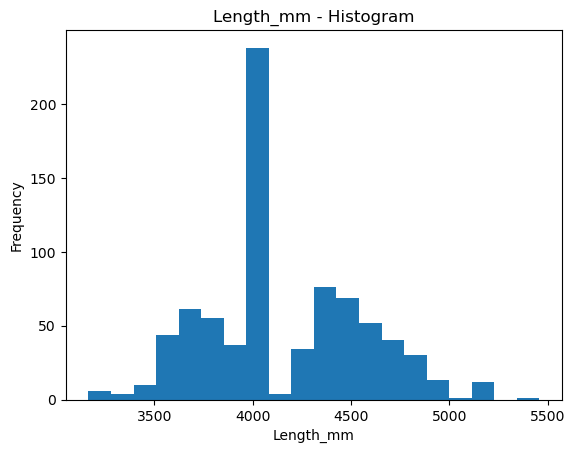

Column: Width_mm
Measures of Central Tendency:
Mean: 1748.161372299873
Median: 1735.0
Mode: 1735

Measures of Dispersion:
Standard Deviation: 110.7880315562529
Variance: 12273.987936109288
Range: 808
Minimum: 1410
Maximum: 2218


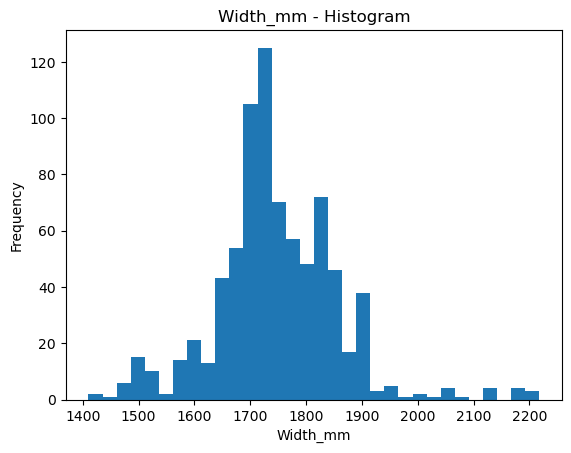

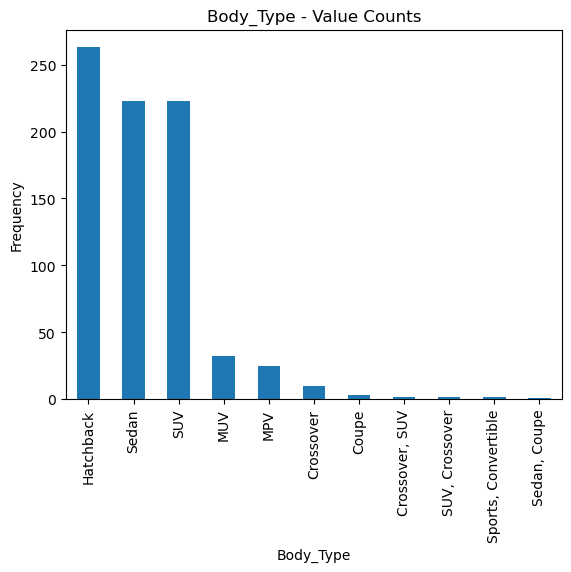

Column: Doors
Measures of Central Tendency:
Mean: 4.681528662420382
Median: nan
Mode: 5.0

Measures of Dispersion:
Standard Deviation: 0.5201447197013981
Variance: 0.270550529433246
Range: nan
Minimum: 2.0
Maximum: 5.0


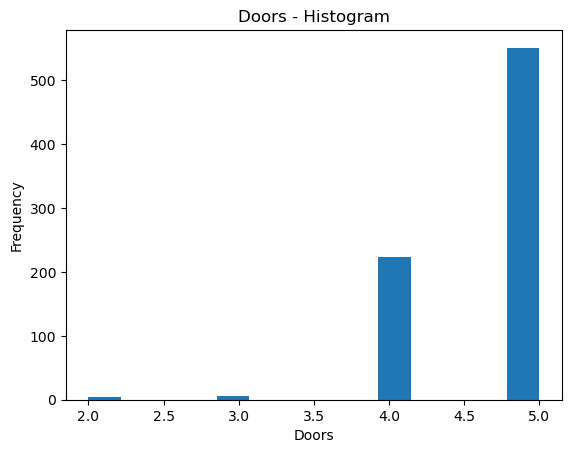

Column: City_Mileage_km_litre
Measures of Central Tendency:
Mean: 17.403384279475972
Median: nan
Mode: 16.0

Measures of Dispersion:
Standard Deviation: 6.353270219090594
Variance: 40.364042476783446
Range: nan
Minimum: 4.45
Maximum: 80.0


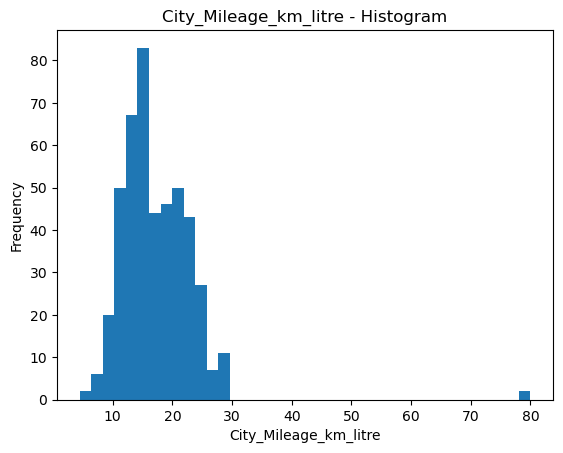

Column: Highway_Mileage_km_litre
Measures of Central Tendency:
Mean: 18.65478260869568
Median: nan
Mode: 22.0

Measures of Dispersion:
Standard Deviation: 3.845507329986751
Variance: 14.78792662498183
Range: nan
Minimum: 7.94
Maximum: 25.32


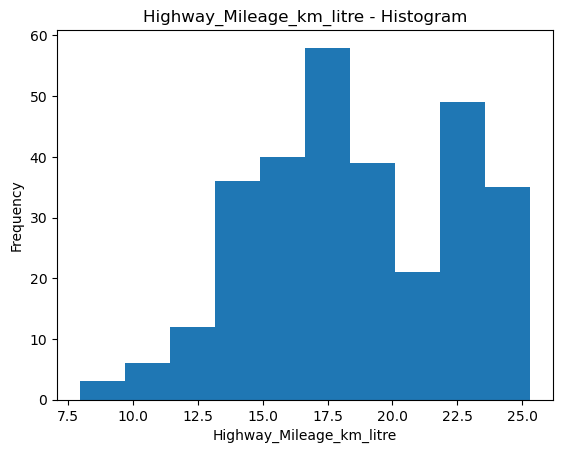

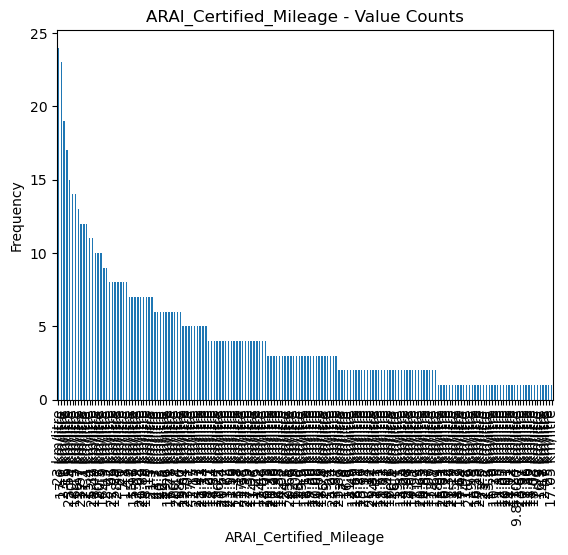

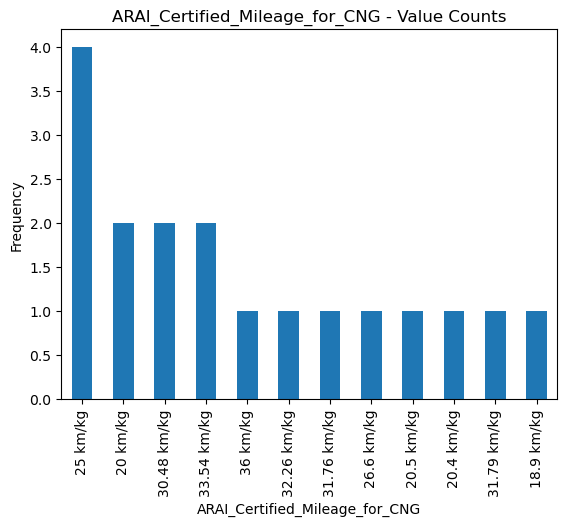

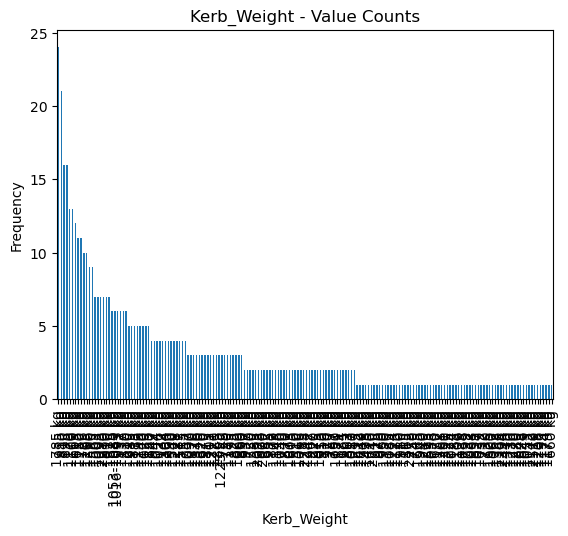

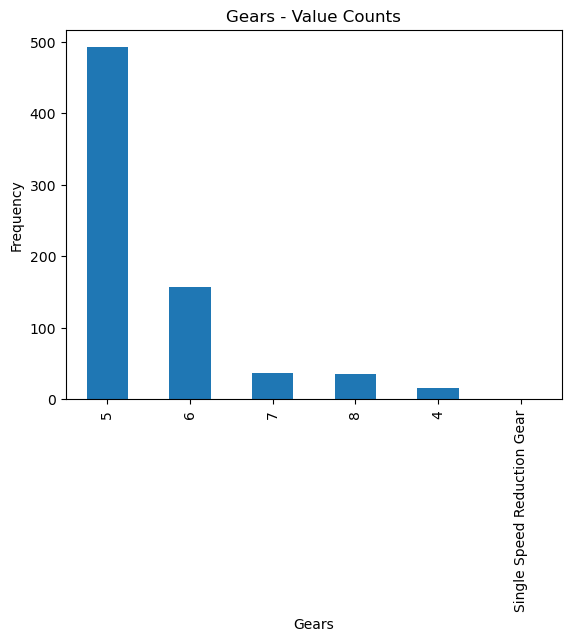

...

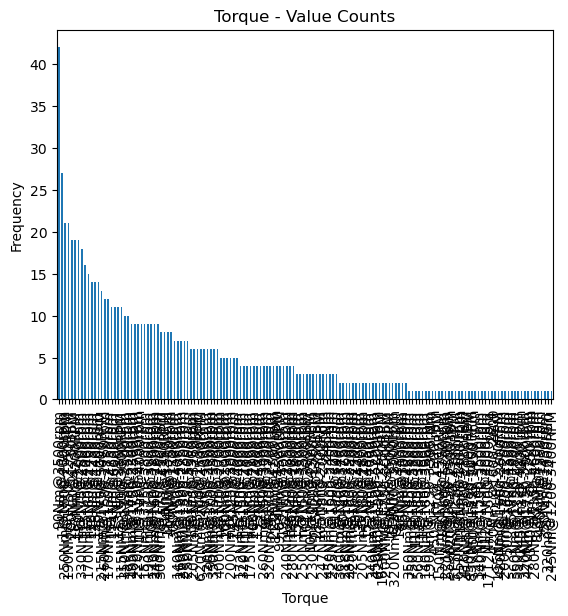

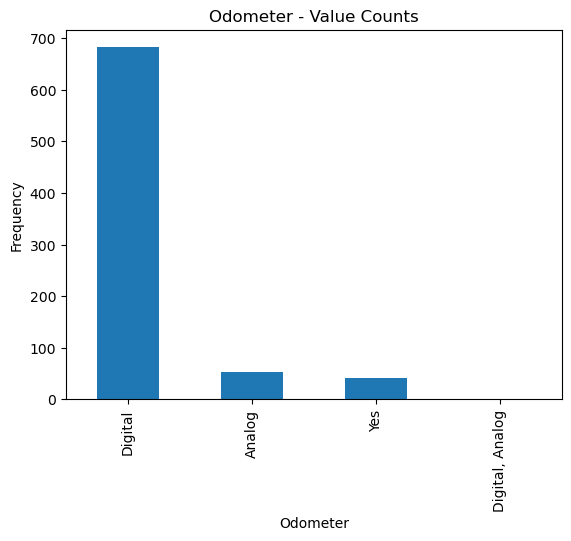

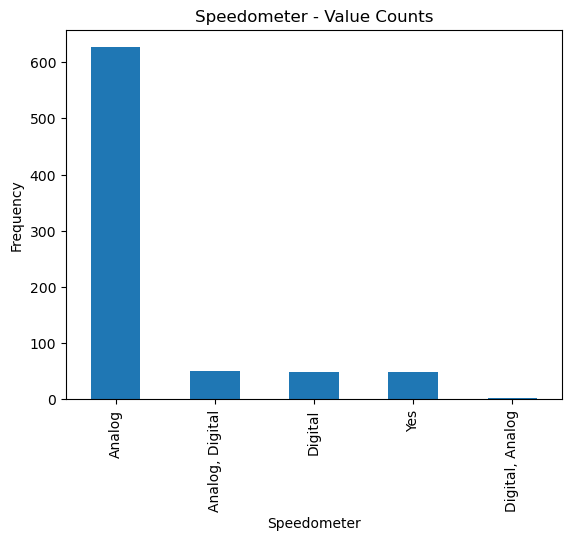

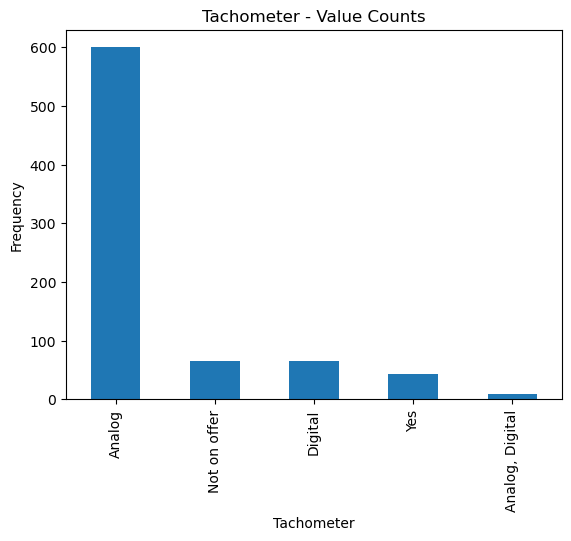

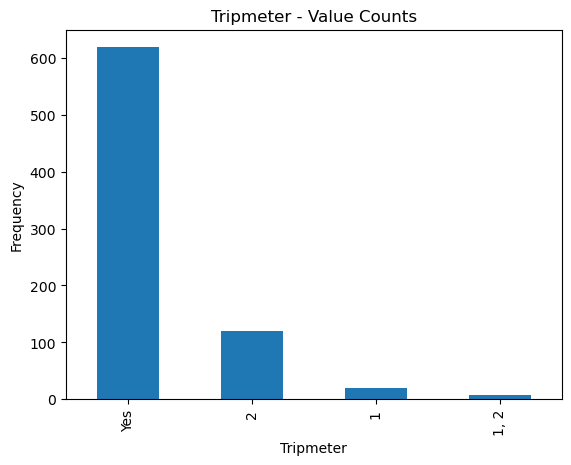

Column: Seating_Capacity
Measures of Central Tendency:
Mean: 5.394132653061225
Median: nan
Mode: 5.0

Measures of Dispersion:
Standard Deviation: 1.0159524850065196
Variance: 1.0321594517909223
Range: nan
Minimum: 2.0
Maximum: 16.0


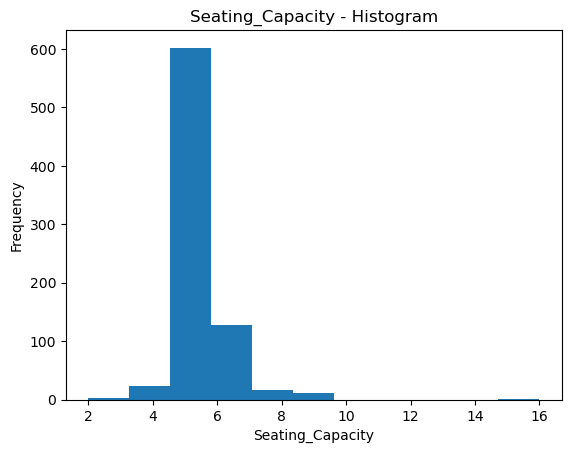

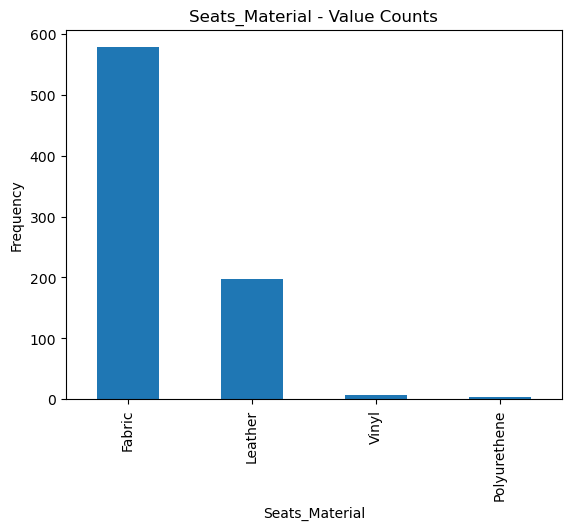

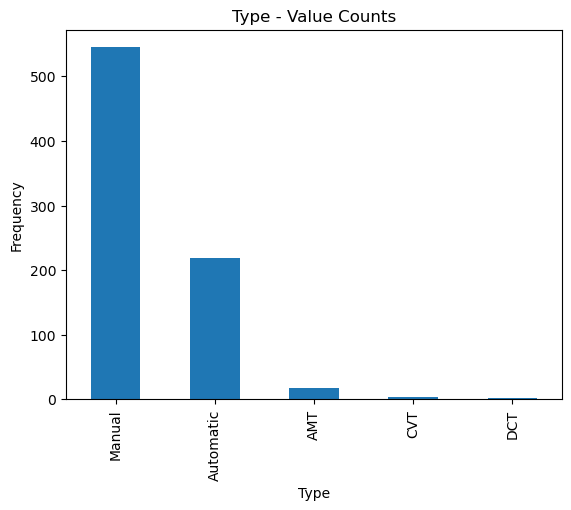

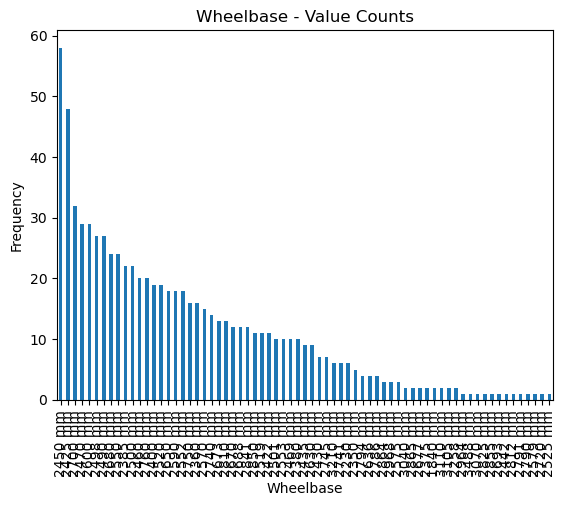

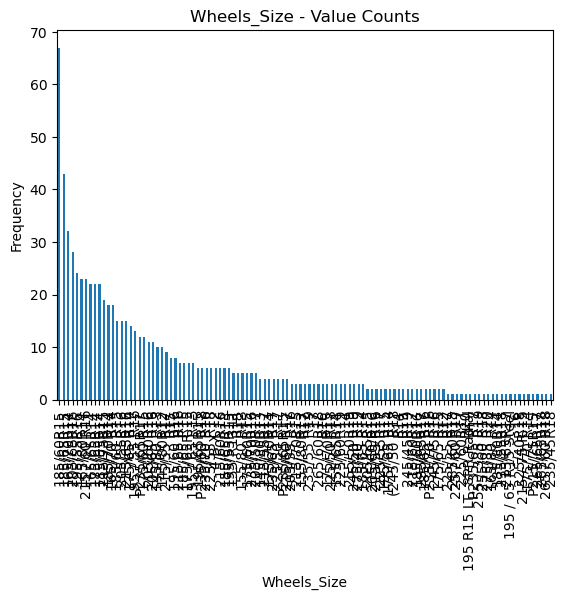

...

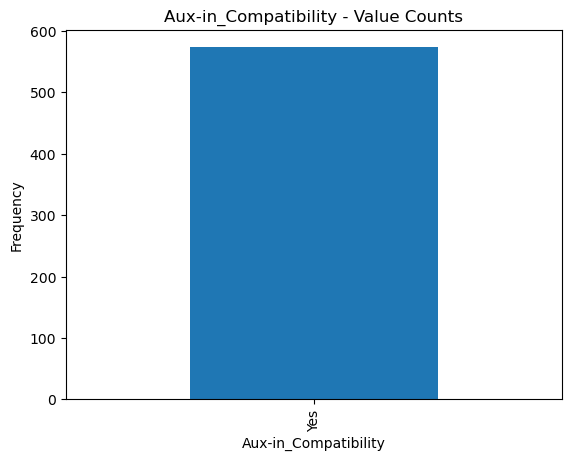

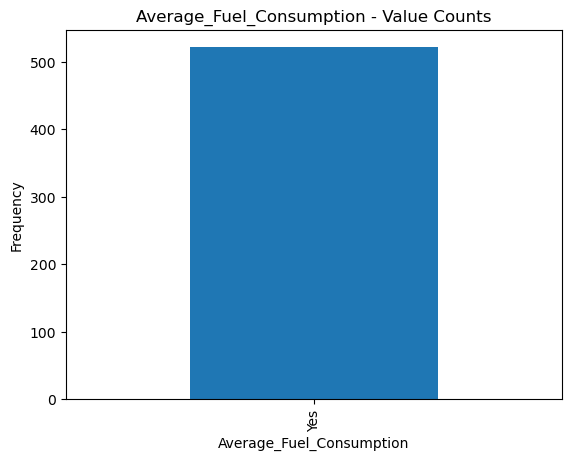

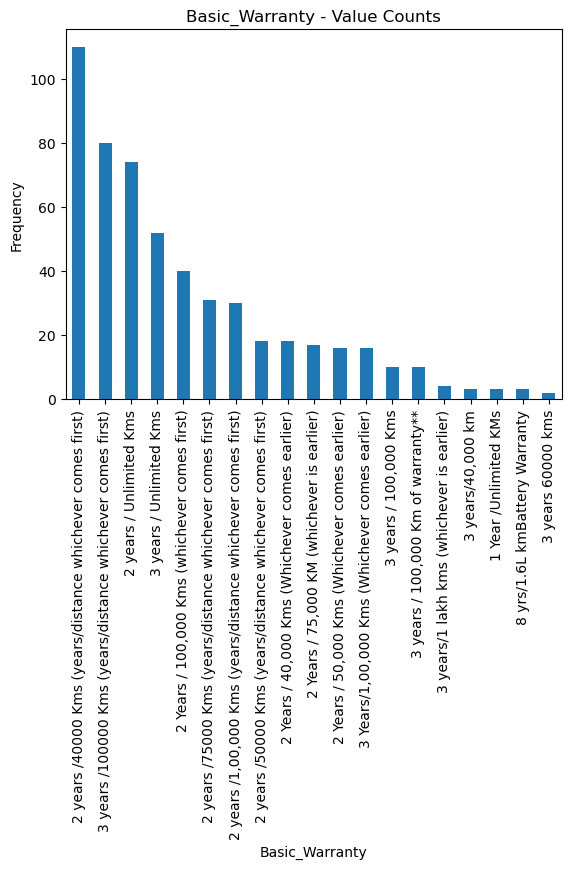

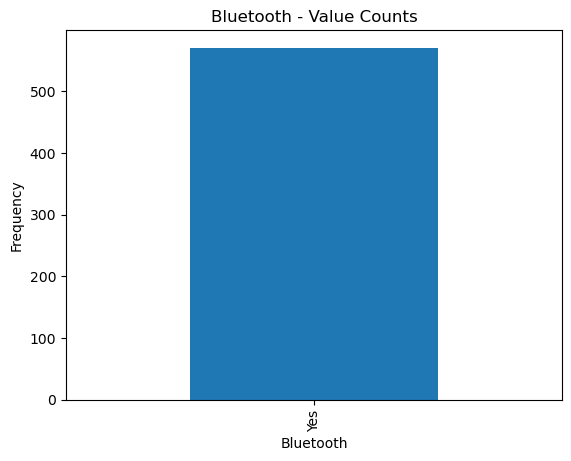

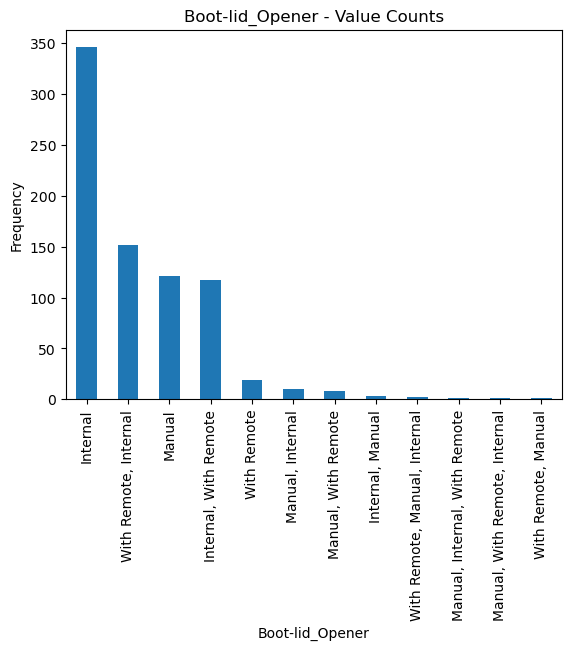

Column: Boot_Space_litre
Measures of Central Tendency:
Mean: 358.4390243902439
Median: nan
Mode: 350.0

Measures of Dispersion:
Standard Deviation: 137.04074946410051
Variance: 18780.167013682367
Range: nan
Minimum: 94.0
Maximum: 981.0


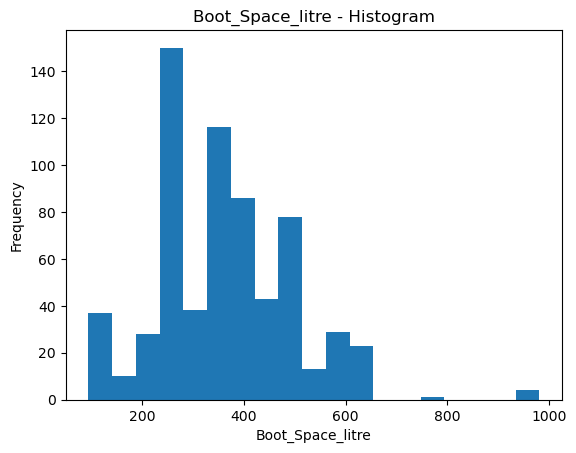

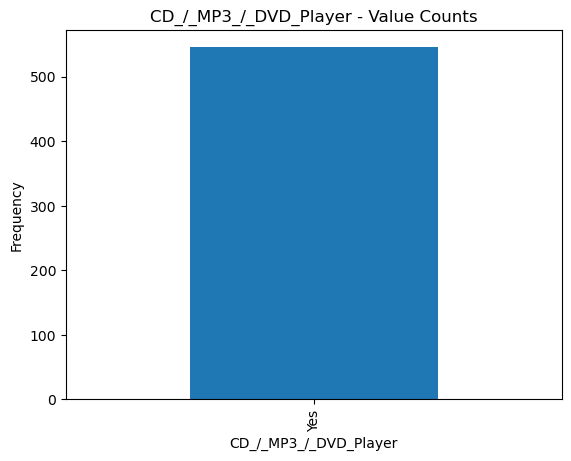

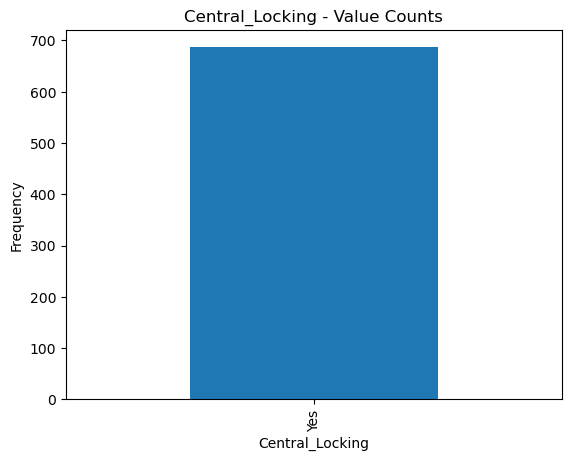

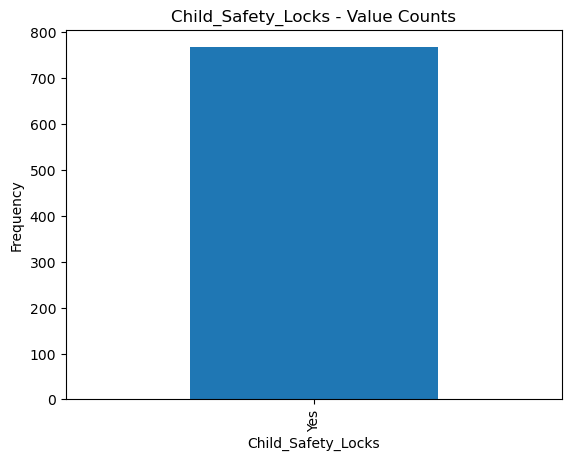

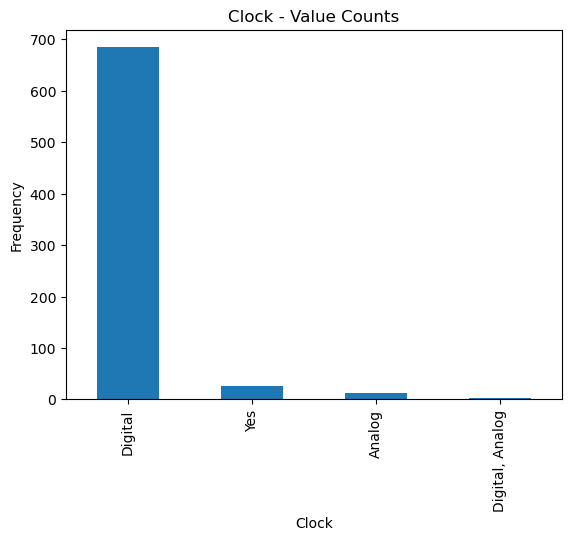

...

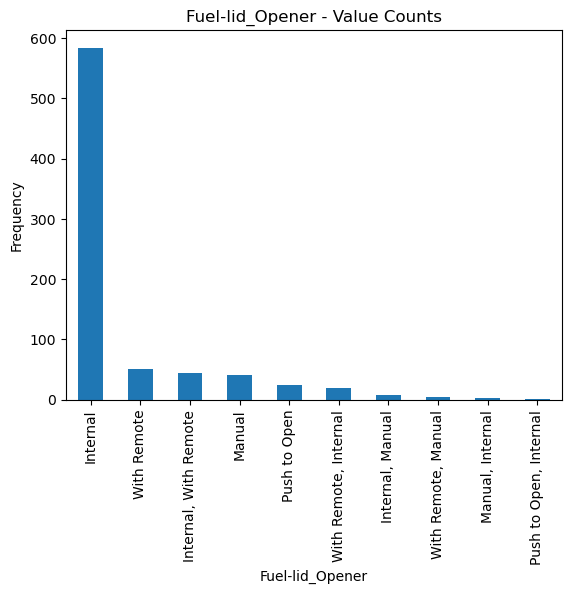

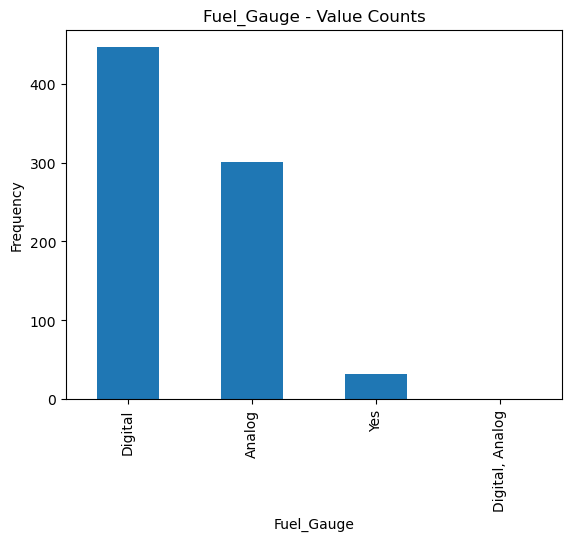

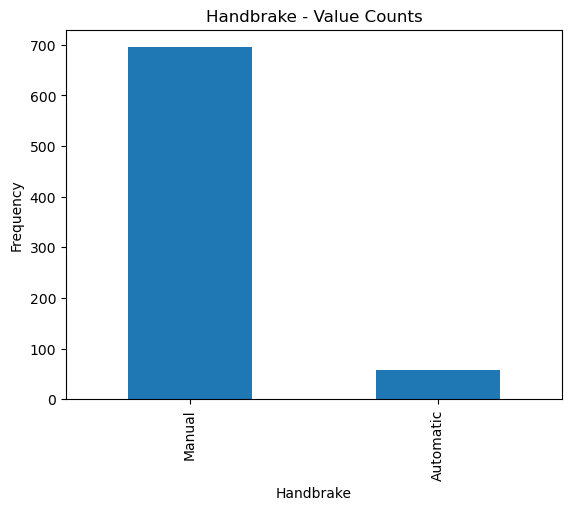

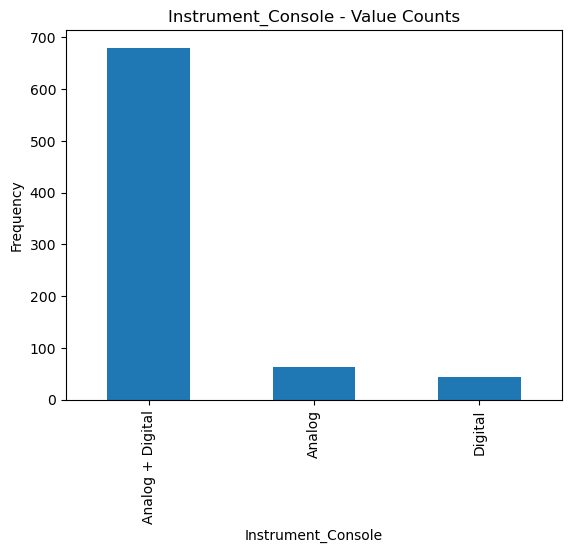

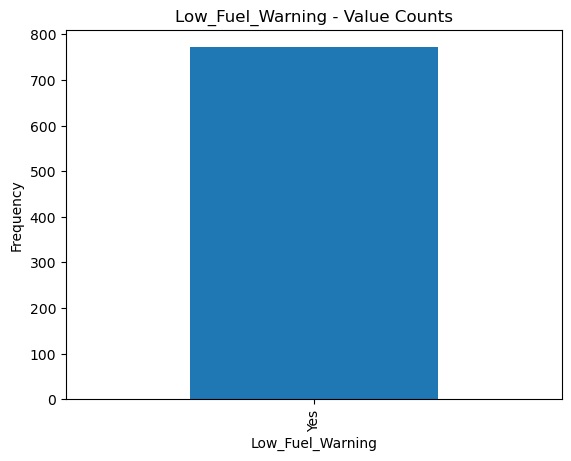

Column: Minimum_Turning_Radius
Measures of Central Tendency:
Mean: 5.32423469387754
Median: nan
Mode: 5.2

Measures of Dispersion:
Standard Deviation: 1.0368107132562185
Variance: 1.0749764551228684
Range: nan
Minimum: 4.0
Maximum: 11.7


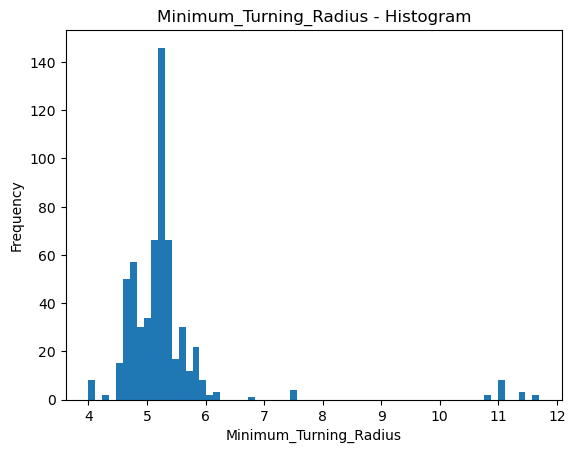

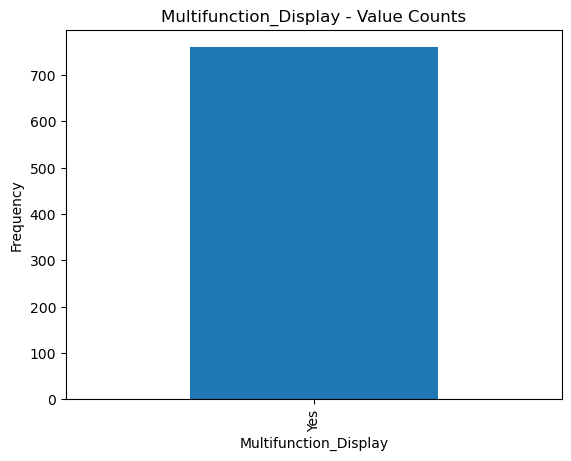

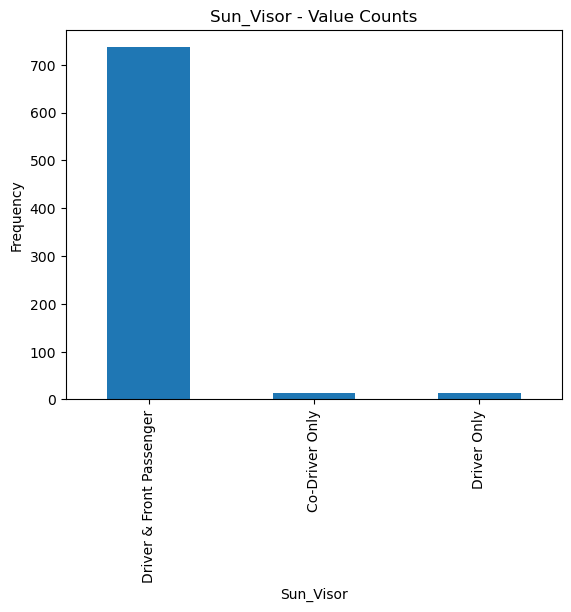

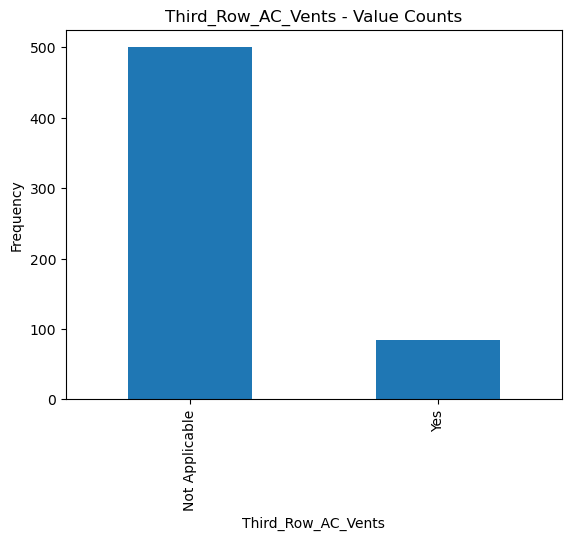

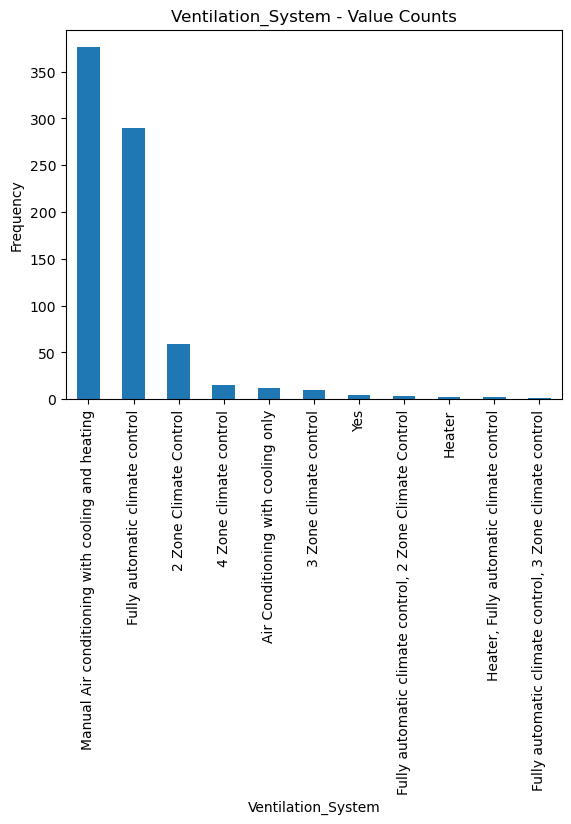

...

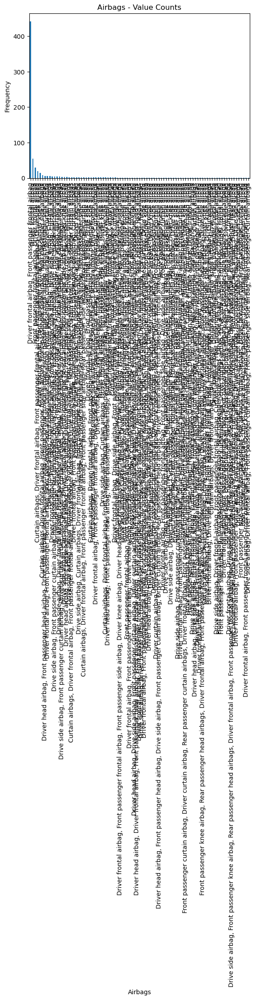

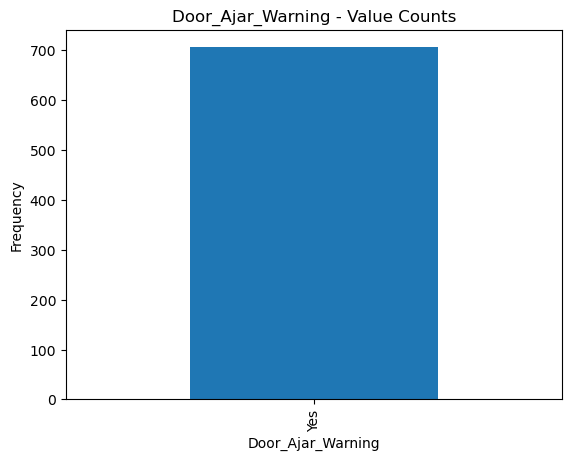

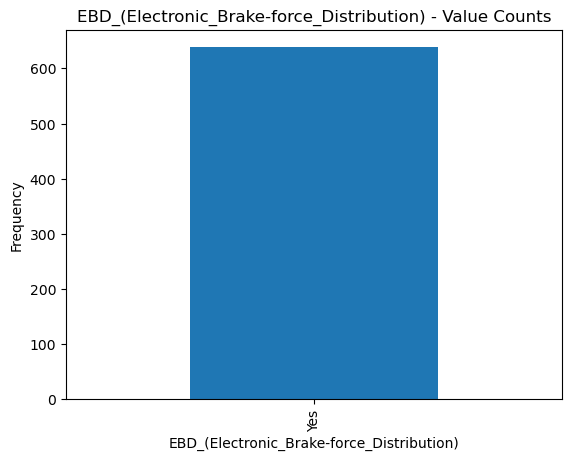

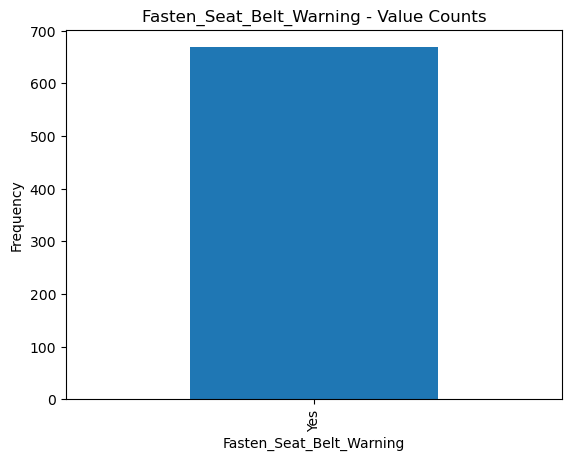

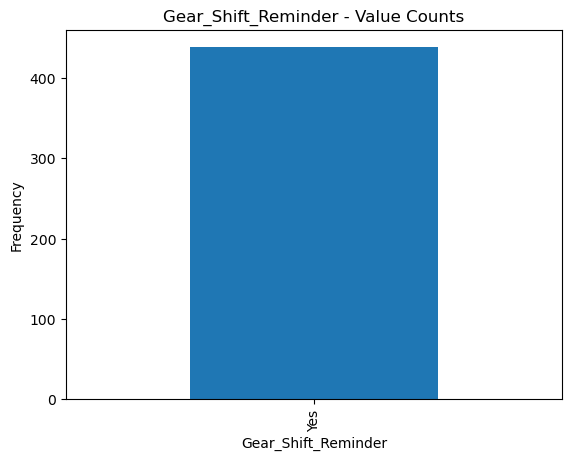

Column: Number_of_Airbags
Measures of Central Tendency:
Mean: 3.0142045454545454
Median: nan
Mode: 2.0

Measures of Dispersion:
Standard Deviation: 2.09092260062336
Variance: 4.371957321797554
Range: nan
Minimum: 1.0
Maximum: 10.0


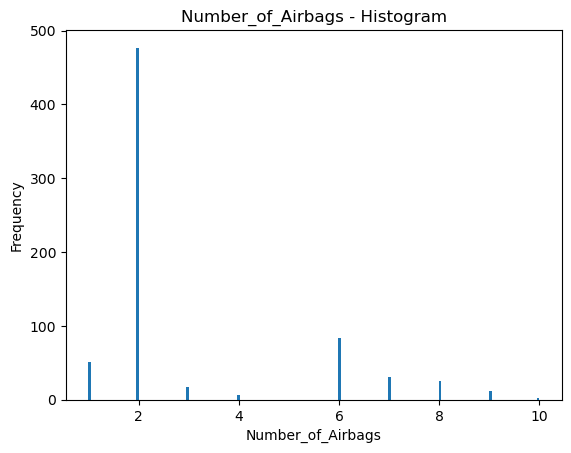

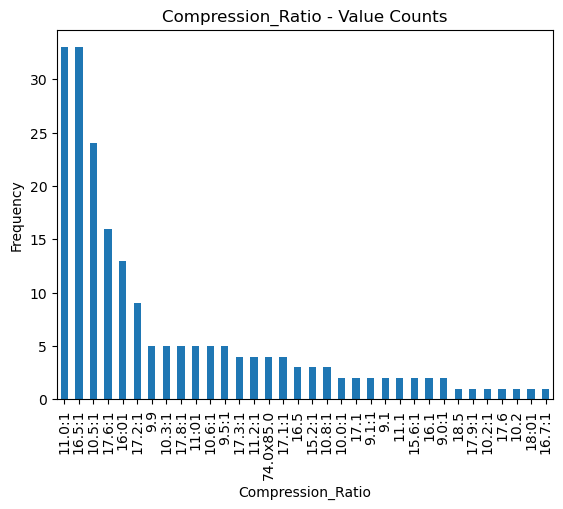

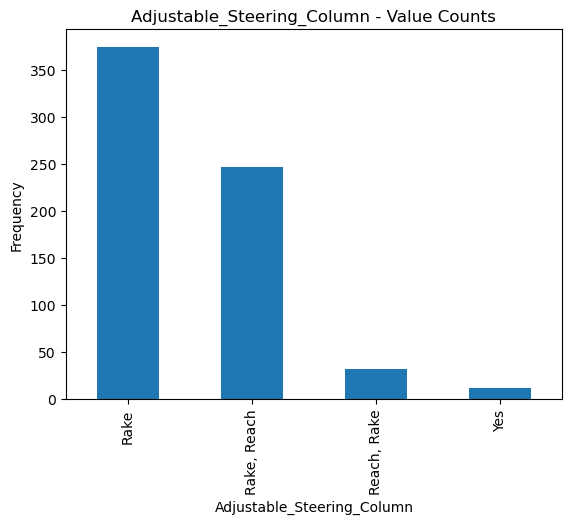

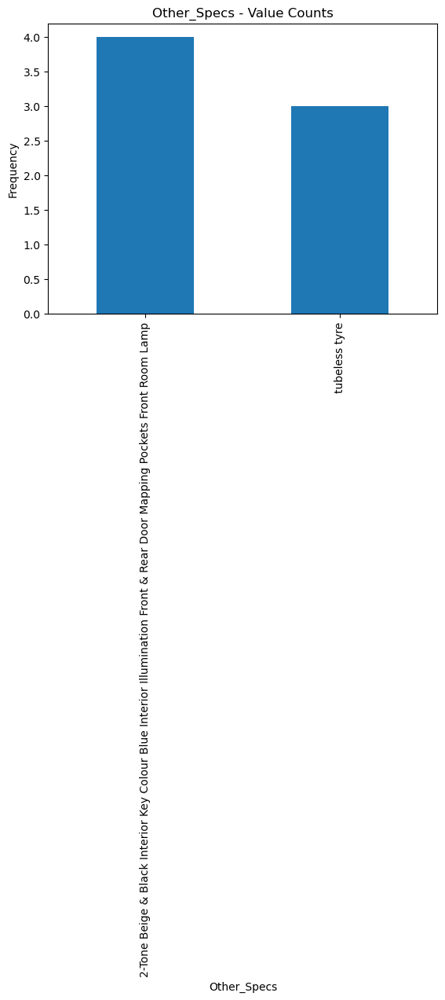

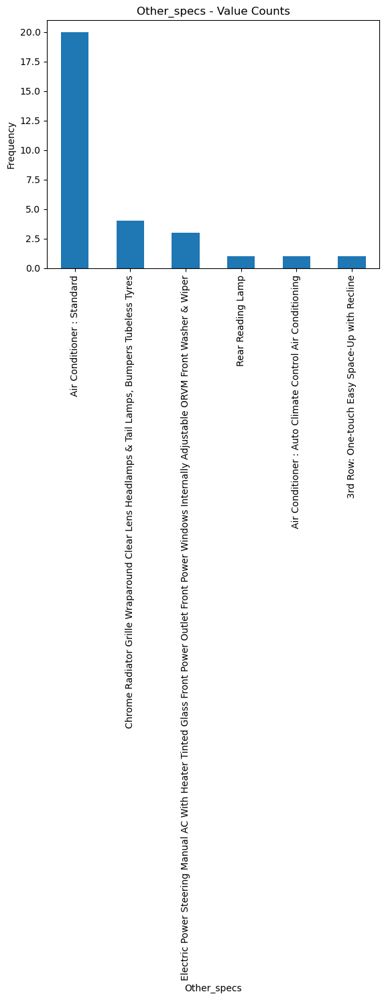

...

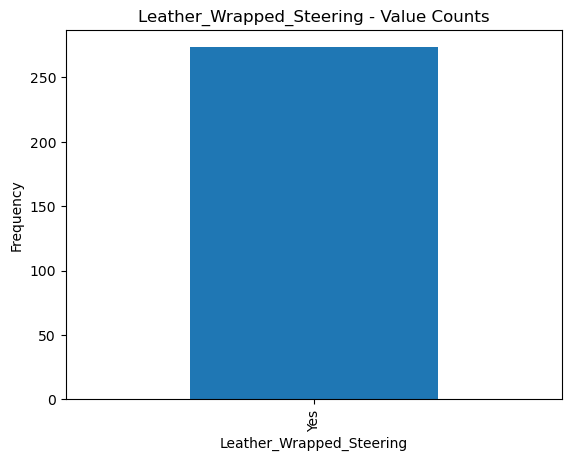

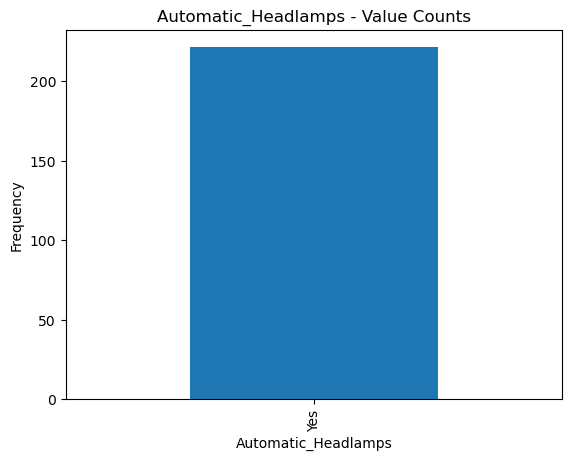

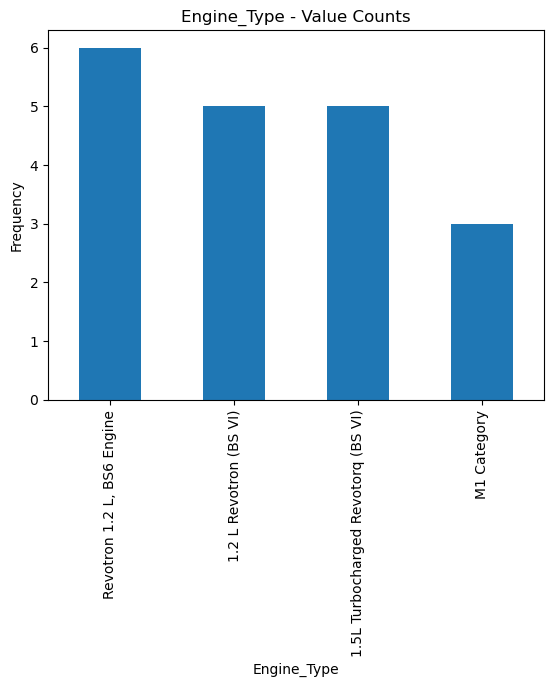

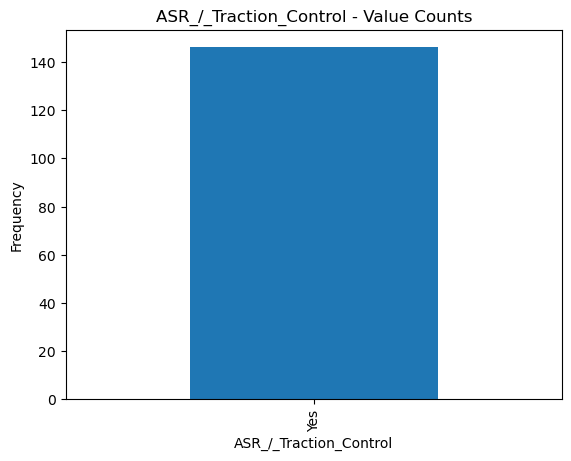

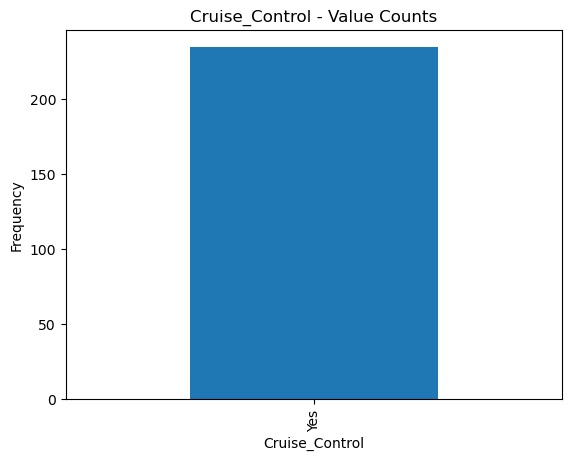

Column: USB_Ports
Measures of Central Tendency:
Mean: 1.875
Median: nan
Mode: 1.0

Measures of Dispersion:
Standard Deviation: 0.9270248108869579
Variance: 0.859375
Range: nan
Minimum: 1.0
Maximum: 3.0


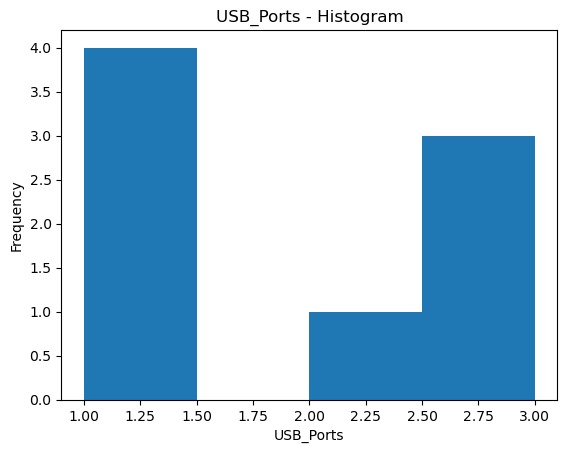

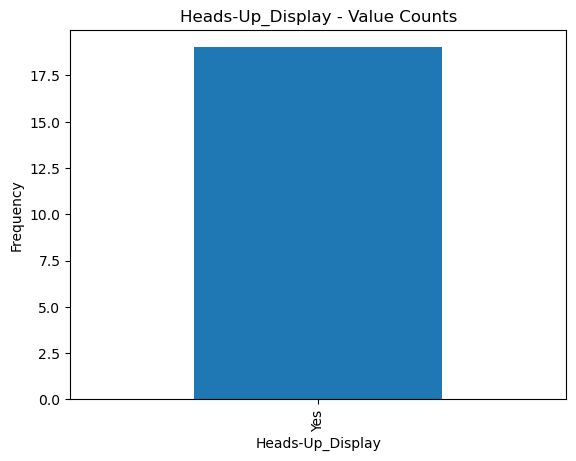

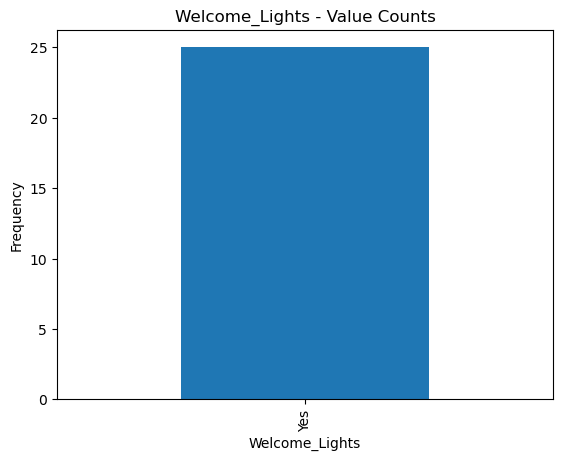

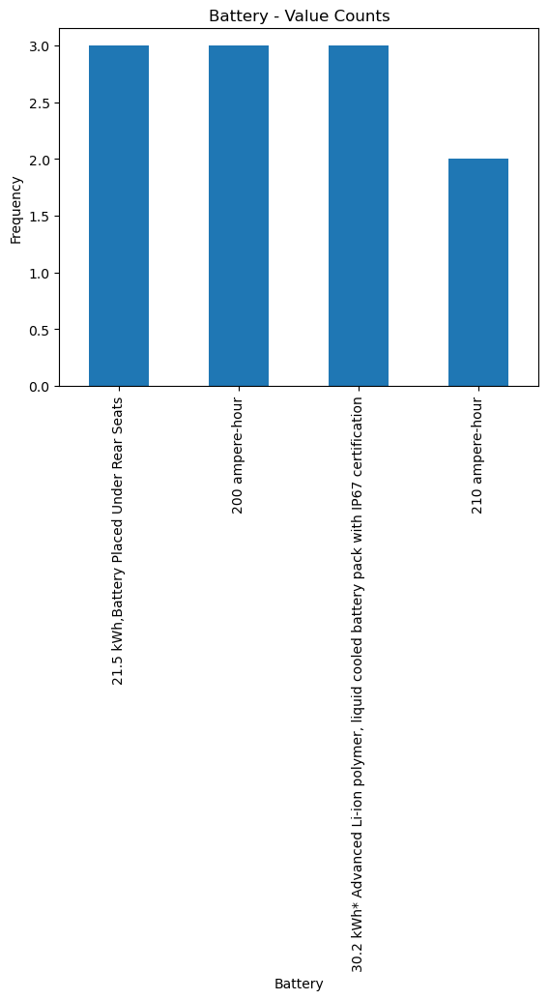

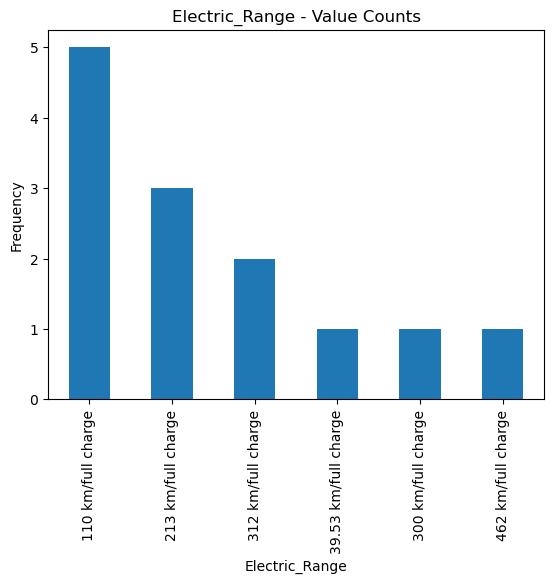

In [21]:
for column in df.columns:
    column_data = df[column]
    
    if column_data.dtype == 'object':
        value_counts = column_data.value_counts()
        
        plt.figure()
        value_counts.plot(kind='bar')
        plt.title(f"{column} - Value Counts")
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.show()
        
    else:
        central_tendency = {
            'Mean': np.mean(column_data),
            'Median': np.median(column_data),
            'Mode': column_data.mode()[0]
        }
        
        dispersion = {
            'Standard Deviation': np.std(column_data),
            'Variance': np.var(column_data),
            'Range': np.ptp(column_data),
            'Minimum': np.min(column_data),
            'Maximum': np.max(column_data)
        }
        
        print(f"Column: {column}")
        print("Measures of Central Tendency:")
        for measure, value in central_tendency.items():
            print(f"{measure}: {value}")
            
        print("\nMeasures of Dispersion:")
        for measure, value in dispersion.items():
            print(f"{measure}: {value}")
        
        plt.figure()
        plt.hist(column_data, bins='auto')
        plt.title(f"{column} - Histogram")
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.show()

# BI - VARIATE ANALYSIS

### ORIGINAL HEATMAP WITHOUT ANY DATA CLEANING

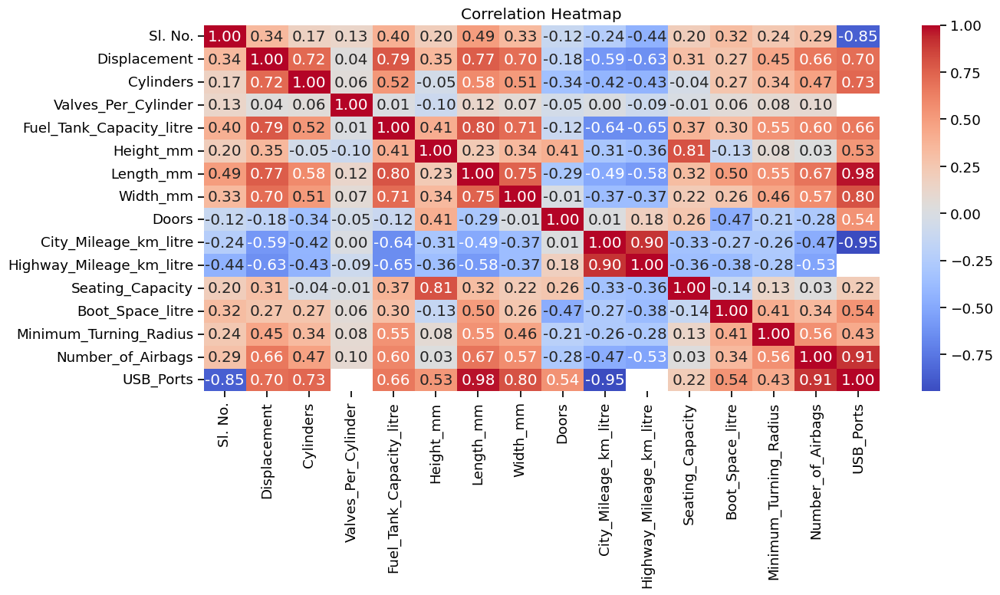

In [22]:
corr = df.corr()

plt.figure(figsize=(14, 8))
sns.set_context("notebook", font_scale=1.2)
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)

plt.title("Correlation Heatmap")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()

In [23]:
def gimme_box_box(df):
    num_columns = df.select_dtypes(include=['float64', 'int64']).columns

    for column in num_columns:
        plt.rcParams['figure.figsize'] = (23, 10)
        ax = sns.boxplot(x="Make", y=column, data=df)
        plt.show()

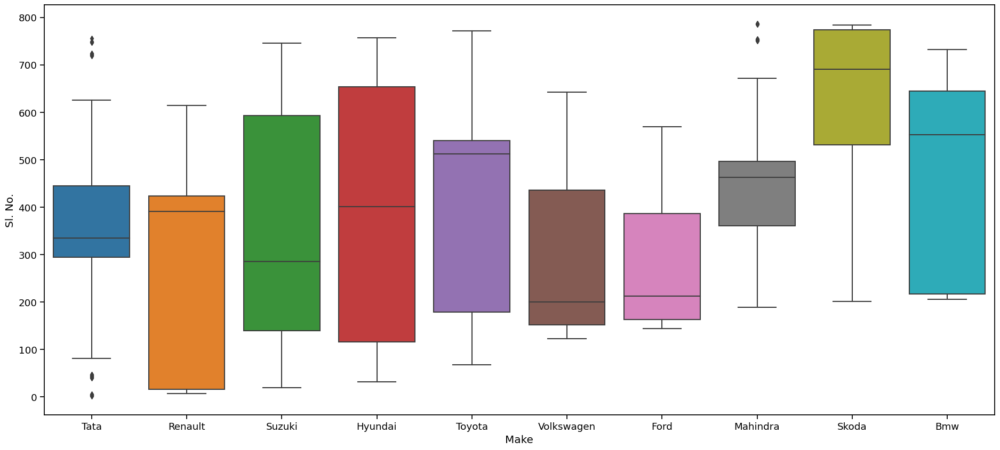

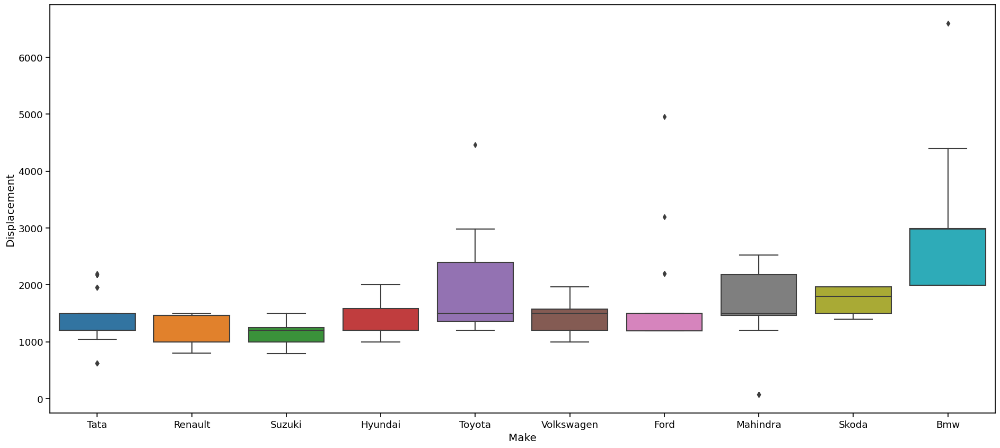

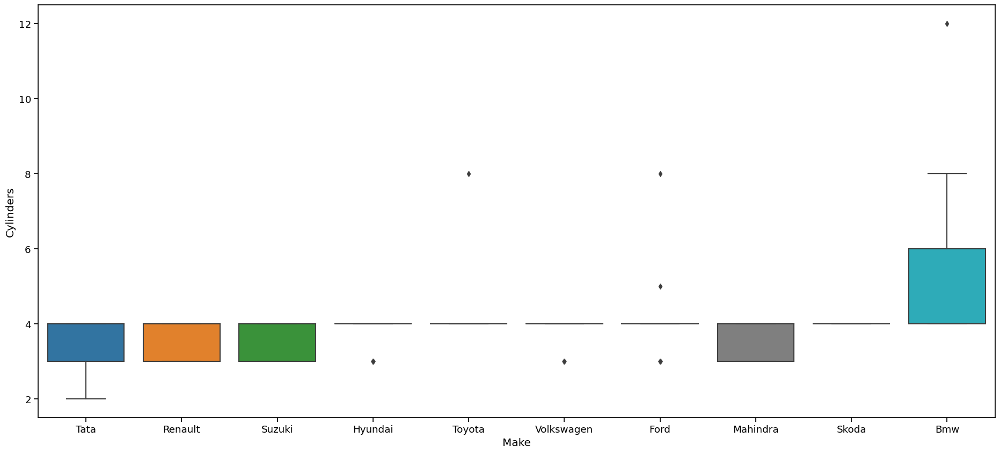

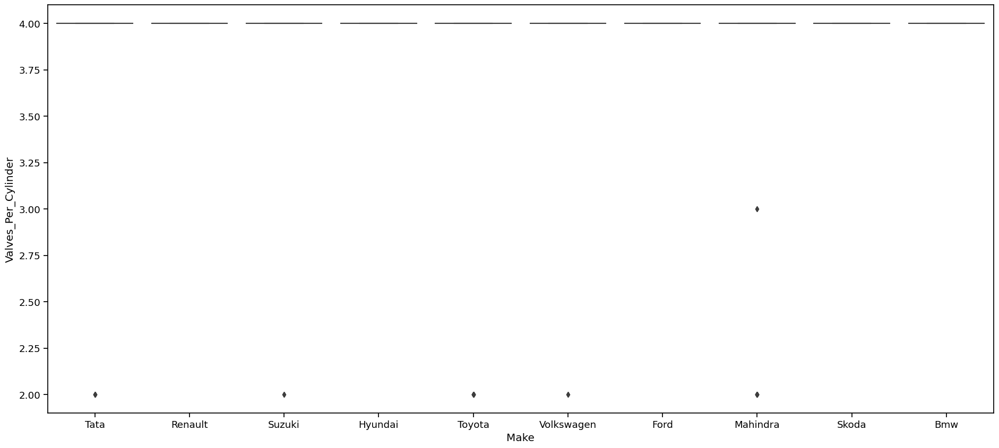

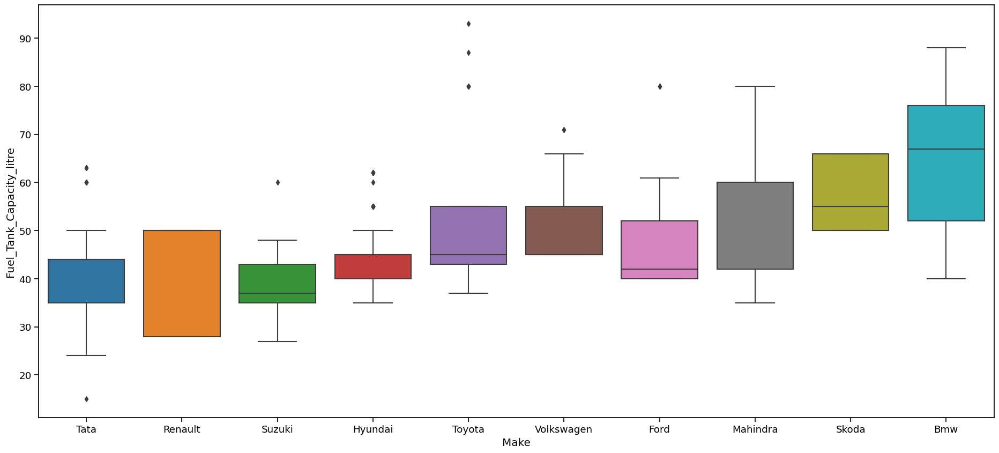

...

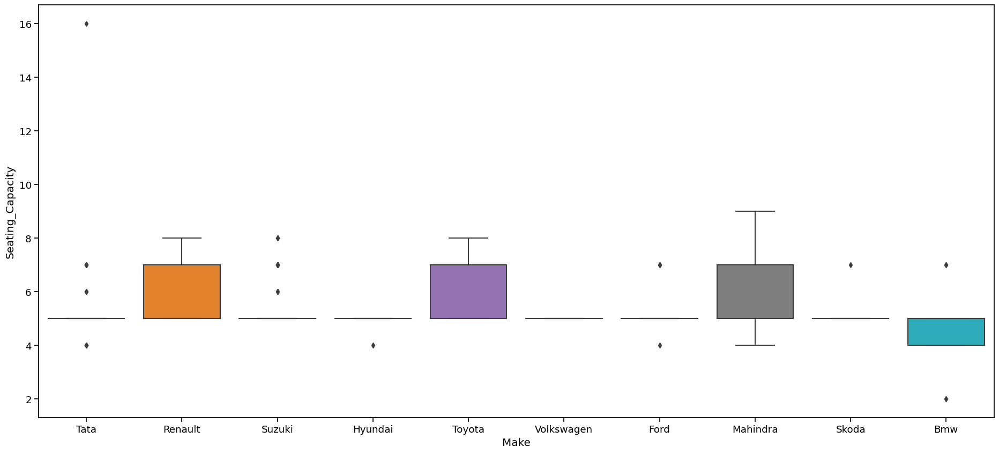

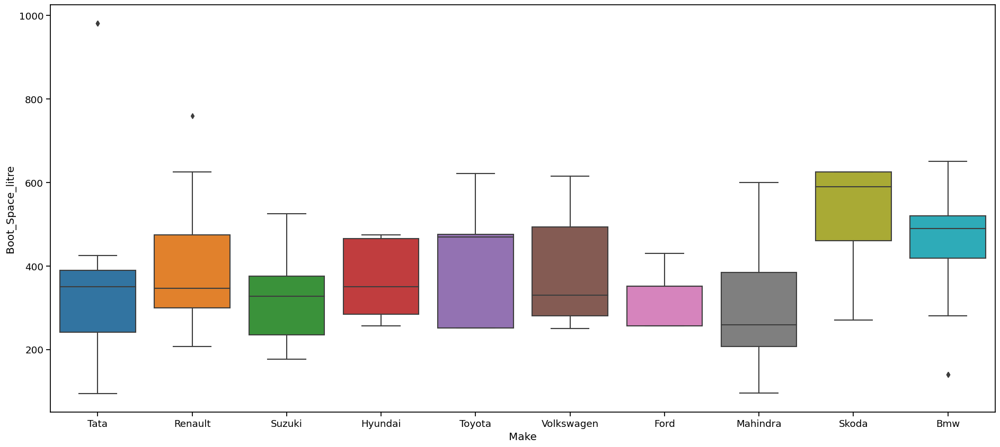

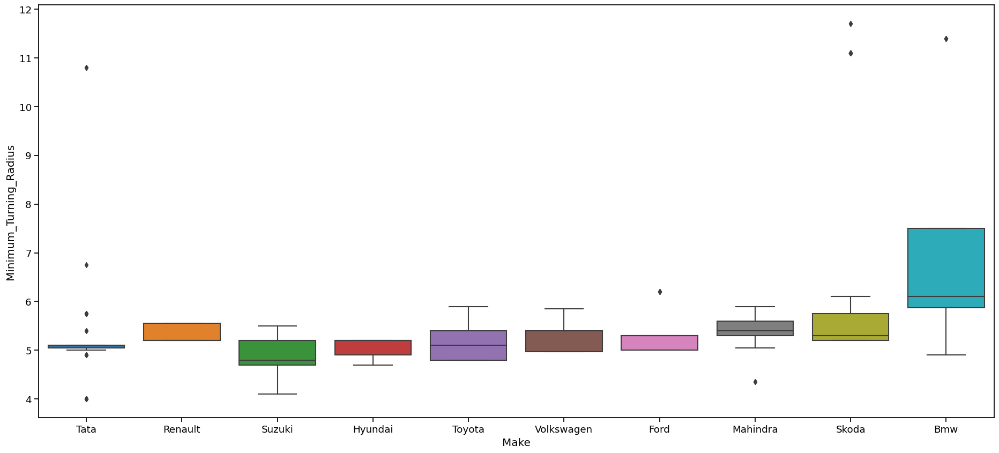

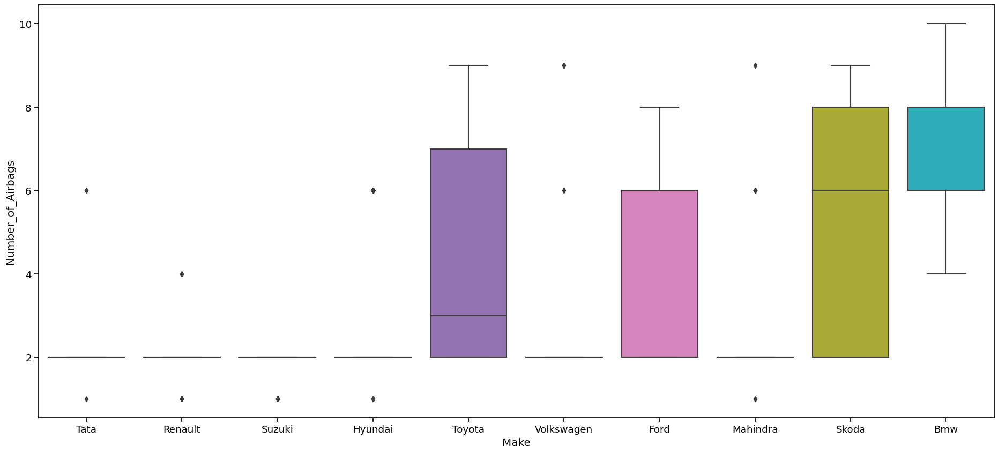

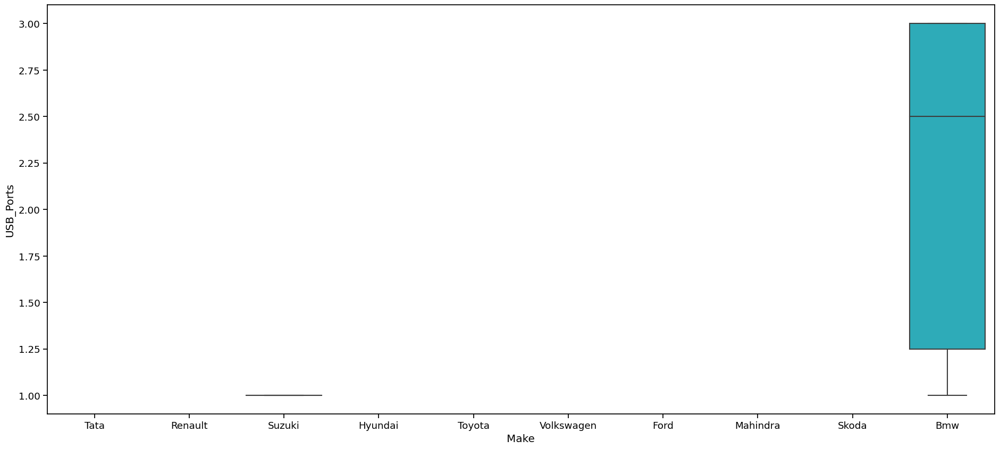

In [24]:
gimme_box_box(df)

DATA CLEANING I CAN PERFORM:
    - ARAI_Certified_Mileage (remove km/litre) - done
    - Kerb_Weight (remove kg) - done
    - Ground_Clearance (remove mm) - done
    - Power (only keep 38) - done
    - same for torque - done
    - Wheelbase (remove mm) - done

In [25]:
df['ARAI_Certified_Mileage (km/l)'] = df['ARAI_Certified_Mileage'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
19.498200270636012

Median:
19.67

Mode:
0    23.0
Name: ARAI_Certified_Mileage (km/l), dtype: float64

Maximum value:
28.4

Minimum value:
7.6

Data range:
20.799999999999997

Vairance:
15.07401803029802

std dev:
3.882527273606461

interquartilerange:
5.539999999999999

NulValues:
48


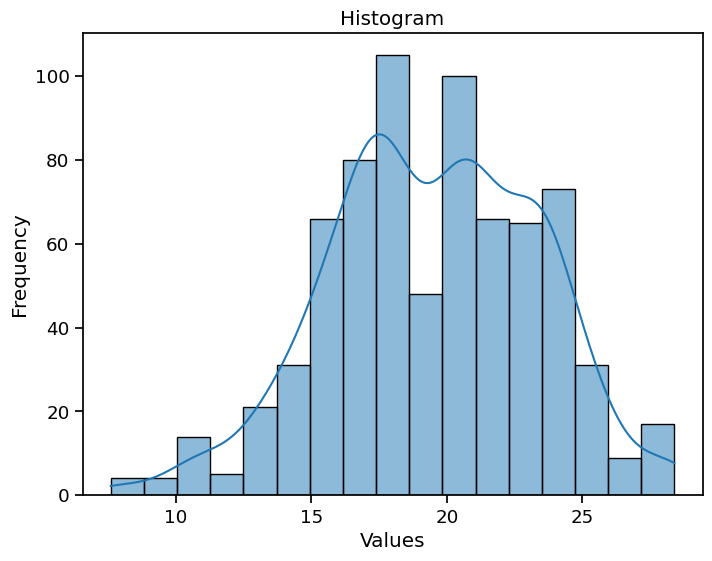

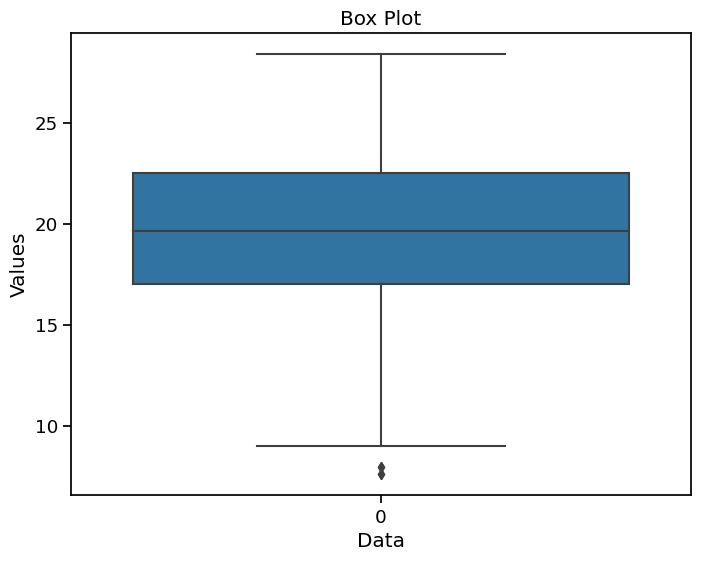

In [26]:
imp_infos(df['ARAI_Certified_Mileage (km/l)'])

In [27]:
df['Kerb_Weight (kg)'] = df['Kerb_Weight'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
1203.0936936936937

Median:
1105.0

Mode:
0    1785.0
Name: Kerb_Weight (kg), dtype: float64

Maximum value:
2740.0

Minimum value:
660.0

Data range:
2080.0

Vairance:
138770.799869906

std dev:
372.51952951477057

interquartilerange:
405.0

NulValues:
232


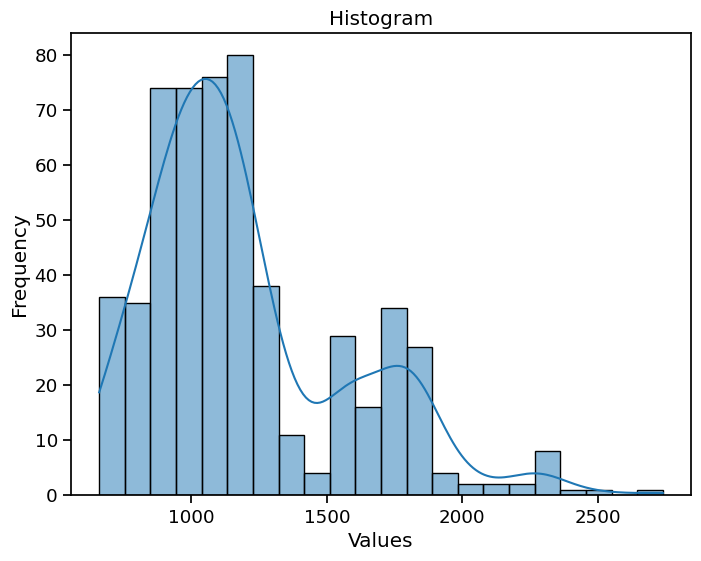

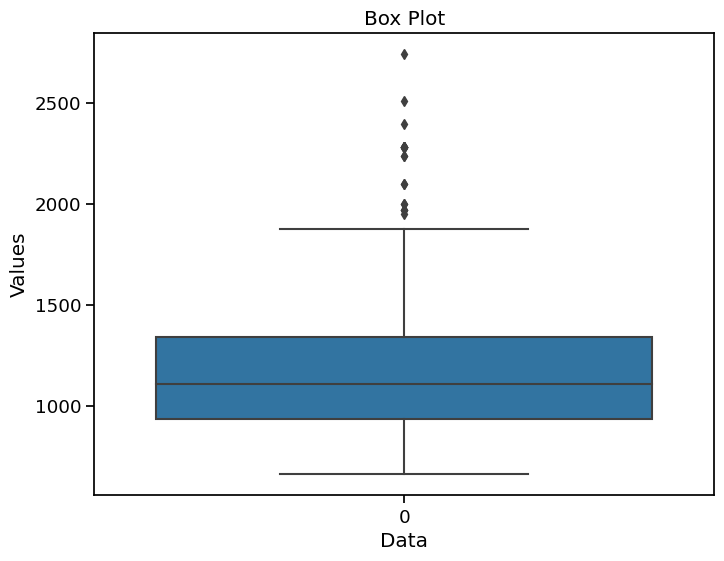

In [28]:
imp_infos(df['Kerb_Weight (kg)'])

In [29]:
df['Ground_Clearance (mm)'] = df['Ground_Clearance'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
177.33178294573642

Median:
170.0

Mode:
0    165.0
Name: Ground_Clearance (mm), dtype: float64

Maximum value:
498.0

Minimum value:
121.0

Data range:
377.0

Vairance:
771.2717367230022

std dev:
27.771779502275365

interquartilerange:
25.0

NulValues:
142


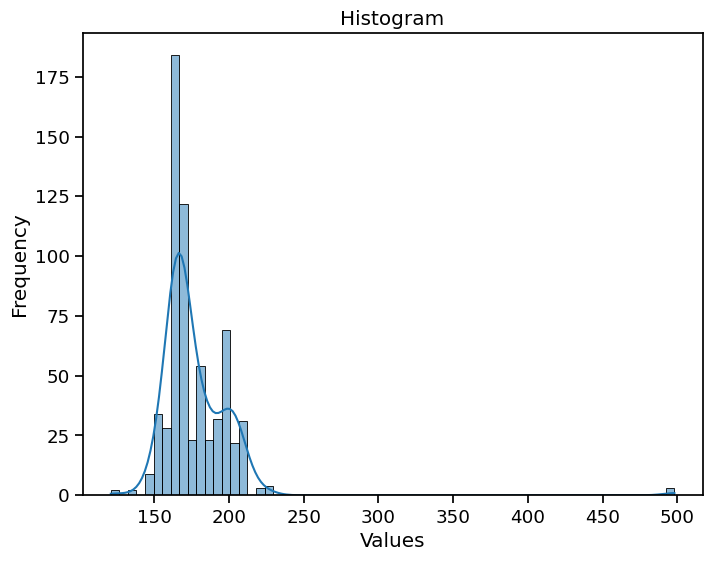

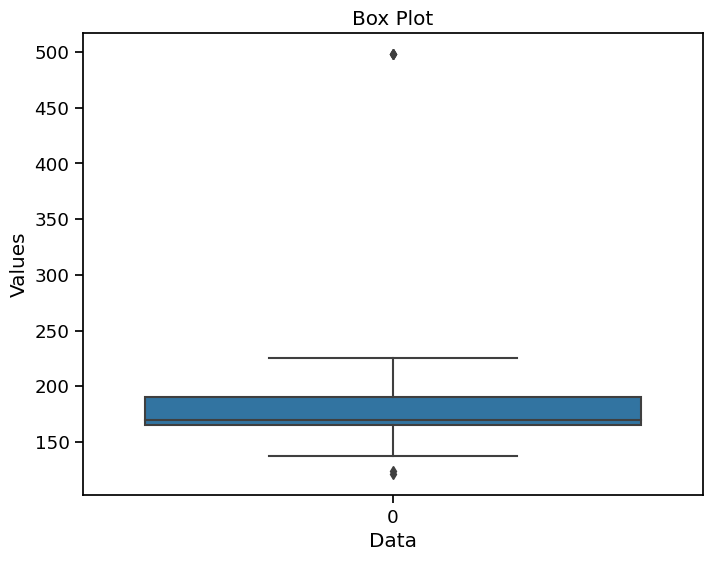

In [30]:
imp_infos(df['Ground_Clearance (mm)']) # since is has a lot of missing values and small corelations with other values I decided to drop it

In [31]:
df['Wheelbase (mm)'] = df['Wheelbase'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
2568.548387096774

Median:
2520.0

Mode:
0    2450.0
Name: Wheelbase (mm), dtype: float64

Maximum value:
3488.0

Minimum value:
1840.0

Data range:
1648.0

Vairance:
27369.821622072082

std dev:
165.43827133427163

interquartilerange:
230.0

NulValues:
12


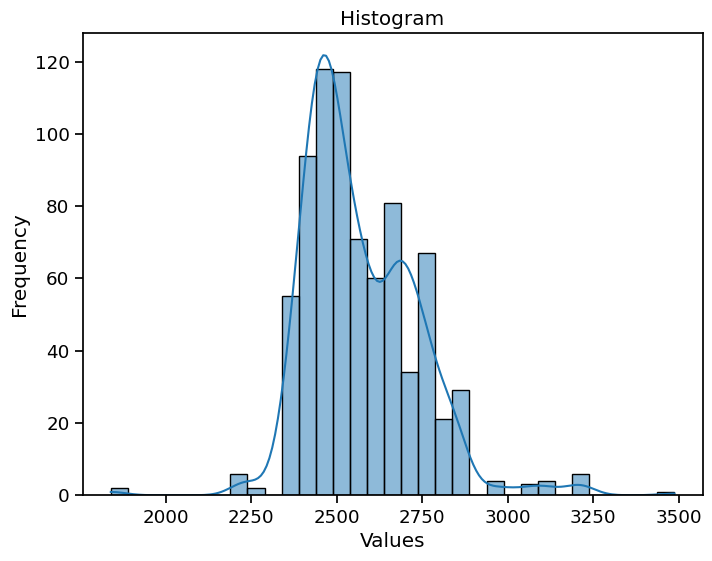

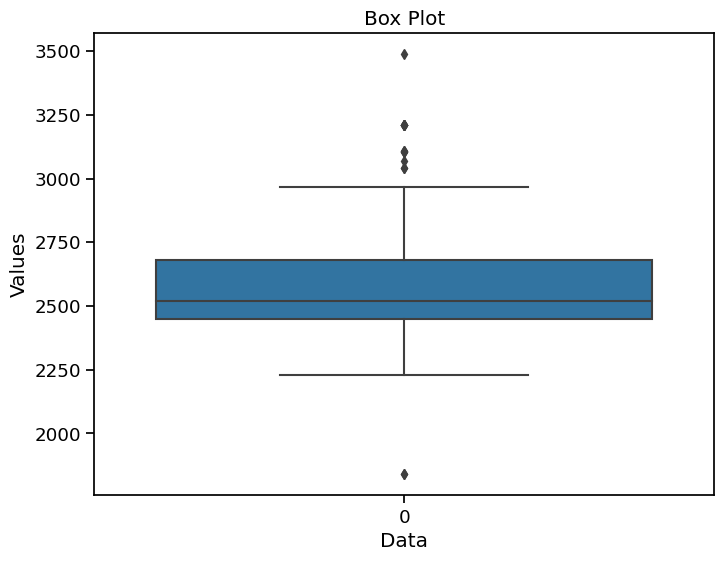

In [32]:
imp_infos(df['Wheelbase (mm)'])

In [33]:
df['Power']=df['Power'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
108.49504447268107

Median:
94.0

Mode:
0    83.0
Name: Power, dtype: float64

Maximum value:
625.0

Minimum value:
25.8

Data range:
599.2

Vairance:
3086.6781051825014

std dev:
55.557880675764636

interquartilerange:
41.0

NulValues:
0


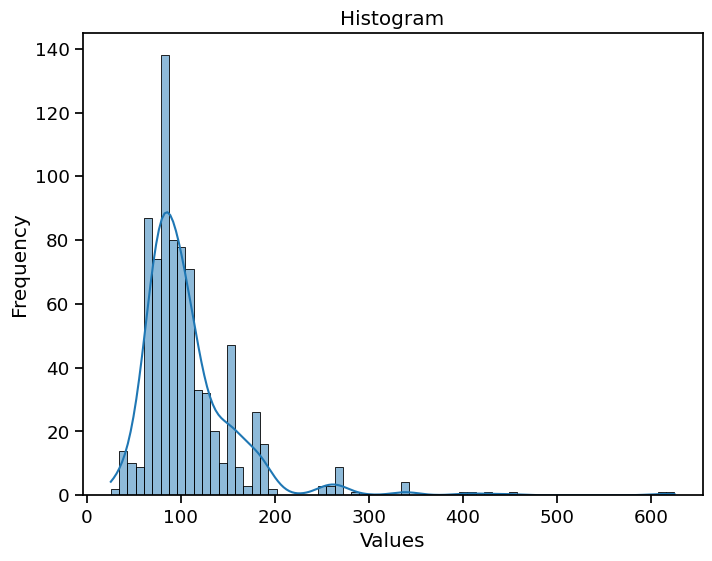

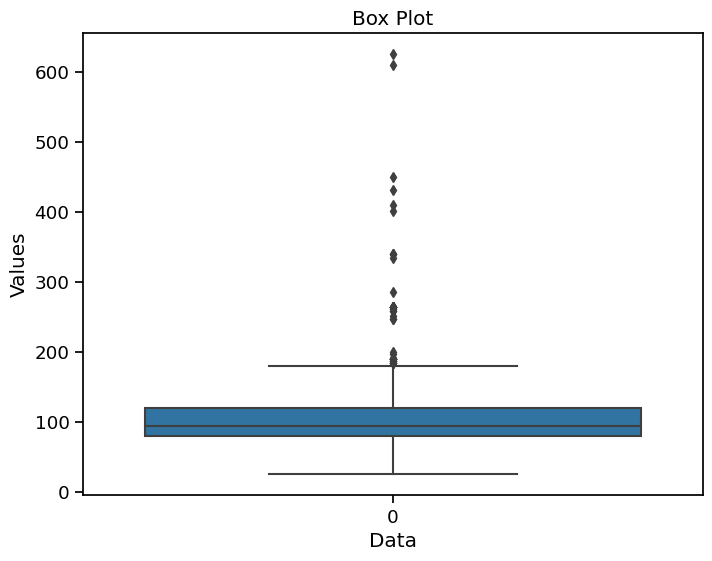

In [34]:
imp_infos(df['Power'])

In [35]:
df['Torque'] = df['Torque'].str.extract(r'(\d+\.?\d*)', expand=False).astype(float)


Mean:
203.22096815286628

Median:
190.0

Mode:
0    190.0
Name: Torque, dtype: float64

Maximum value:
1712.0

Minimum value:
8.3

Data range:
1703.7

Vairance:
16355.945085796146

std dev:
127.89036353766512

interquartilerange:
136.0

NulValues:
2


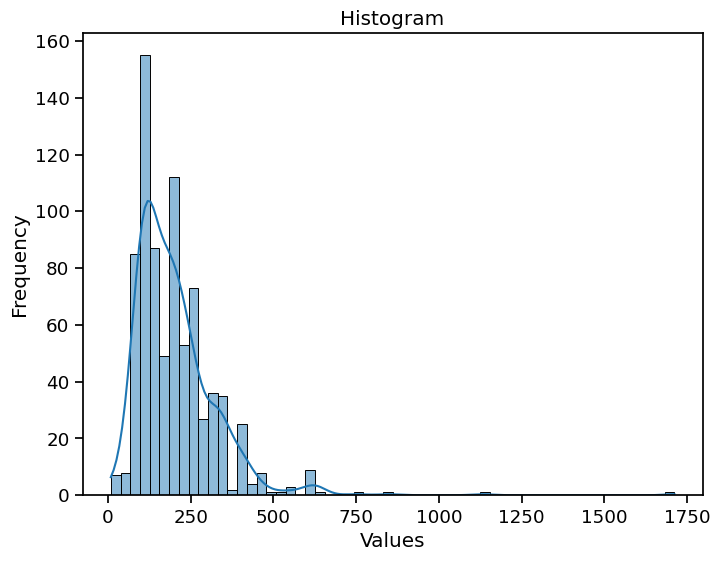

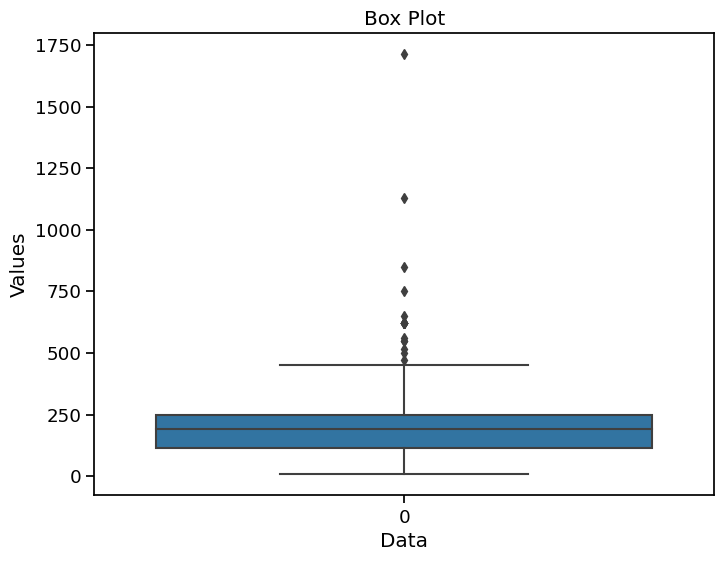

In [36]:
imp_infos(df['Torque'])

let's see if they work with the function

In [37]:
to = df['Torque']

mean = to.mean()
print("Mean:")
print(mean)

median = to.median()
print("\nMedian:")
print(median)

mode = to.mode()
print("\nMode:")
print(mode)

max_val = to.max()
print("\nMaximum value:")
print(max_val)

min_val = to.min()
print("\nMinimum value:")
print(min_val)


data_range = to.max() - to.min()
print("\nData range:")
print(data_range)

variance = to.var()
print("\nVairance:")
print(variance)

std_deviation = to.std()
print("\nstd dev:")
print(std_deviation)

iqr = to.quantile(0.75) - to.quantile(0.25)
print("\ninterquartilerange:")
print(iqr)

nulvals = to.isnull().sum() #good to have
print('\nNulValues:')
print(nulvals)

Mean:
203.22096815286628

Median:
190.0

Mode:
0    190.0
Name: Torque, dtype: float64

Maximum value:
1712.0

Minimum value:
8.3

Data range:
1703.7

Vairance:
16355.945085796146

std dev:
127.89036353766512

interquartilerange:
136.0

NulValues:
2


In [38]:
df = df.drop('USB_Ports', axis=1) # useless

In [39]:
#df = df.drop('Ground_Clearance (mm)', axis=1) # useless NOOO

In [39]:
df = df.drop('Valves_Per_Cylinder', axis=1)

In [40]:
df.loc[df['Gears'] == 'Single Speed Reduction Gear'] # need to remove this weird data

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,...,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range,ARAI_Certified_Mileage (km/l),Kerb_Weight (kg),Ground_Clearance (mm),Wheelbase (mm)
756,757,Hyundai,Kona Electric,Premium,NaN,NaN,FWD (Front Wheel Drive),NaN,"Front, Longitudinal",NaN,...,NaN,Yes,NaN,Yes,NaN,462 km/full charge,NaN,NaN,160.0,2600.0


In [41]:
df = df.drop(756)

In [42]:
df['Gears'] = df['Gears'].astype(float)

In [43]:
col = list(df.columns)
print(col)
print(df.shape)

['Sl. No.', 'Make', 'Model', 'Variant', 'Displacement', 'Cylinders', 'Drivetrain', 'Cylinder_Configuration', 'Engine_Location', 'Fuel_System', 'Fuel_Tank_Capacity_litre', 'Fuel_Type', 'Height_mm', 'Length_mm', 'Width_mm', 'Body_Type', 'Doors', 'City_Mileage_km_litre', 'Highway_Mileage_km_litre', 'ARAI_Certified_Mileage', 'ARAI_Certified_Mileage_for_CNG', 'Kerb_Weight', 'Gears', 'Ground_Clearance', 'Front_Brakes', 'Rear_Brakes', 'Front_Suspension', 'Rear_Suspension', 'Front_Track', 'Rear_Track', 'Front_Tyre_&_Rim', 'Rear_Tyre_&_Rim', 'Power_Steering', 'Power_Windows', 'Power_Seats', 'Keyless_Entry', 'Power', 'Torque', 'Odometer', 'Speedometer', 'Tachometer', 'Tripmeter', 'Seating_Capacity', 'Seats_Material', 'Type', 'Wheelbase', 'Wheels_Size', 'Start_/_Stop_Button', '12v_Power_Outlet', 'Audiosystem', 'Aux-in_Compatibility', 'Average_Fuel_Consumption', 'Basic_Warranty', 'Bluetooth', 'Boot-lid_Opener', 'Boot_Space_litre', 'CD_/_MP3_/_DVD_Player', 'Central_Locking', 'Child_Safety_Locks', '

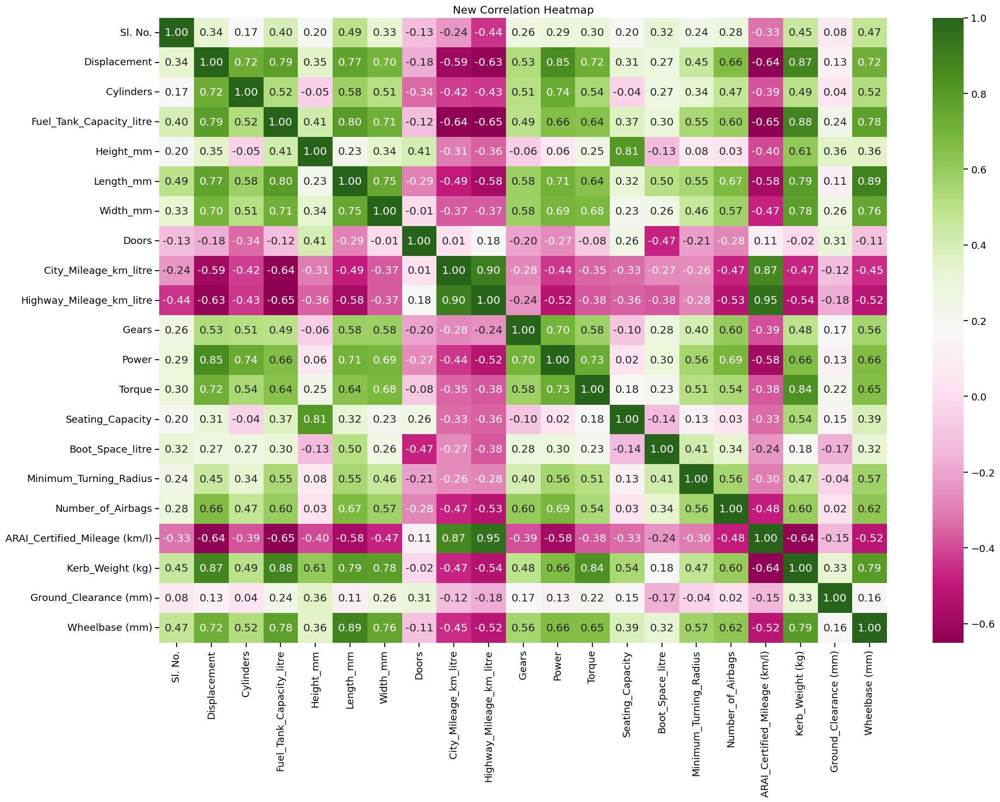

In [44]:
corr = df.corr()
plt.figure(figsize=(20, 15))
sns.set_context("notebook", font_scale=1.2)
sns.heatmap(corr, annot=True, fmt='.2f', cmap='PiYG', cbar=True)
plt.title("New Correlation Heatmap")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# things to do tomorrow (20/06):

find outliers, mb create a function(done)
do some data cleaning

interesting correlations according to HEATMAP:
    - displacement/cylinders*
    - displacement/fuel tank capacity*
    - d/length, *
    - d/width, 
    - d/nm of air bags
    - displacement strong negative corelation w highway mileage
    - cylinders/fuel tank capacity
    - c/length
    - ftc/length n width/ nb air bags
    - city mileage km/ highway mileage *
    - seating capacity heigth
    - boot space length
    - minimum turning radius/ fuel tank capacity/length/ airbags
    - valves per cylinders is irelevant data (need to be removed) - done
    - usb port not relevant to the topic (has been droped)
    - explore data relationship about ARAI and city/highway mileage
    - kerb weight n displacement, fuel tank capacity, lenght and width, torque wheelbase
    - wheelbase and length, displacement, width, power torque kerb weight 
    (* = there has been a graph related that has been done already previously)

## Finding outliers DISPLACEMENT

In [45]:
#  WHERE displacement < (mean - (threshold * standard_deviation))
#   OR displacement > (mean + (threshold * standard_deviation))

In [45]:
z_scores = np.abs((df['Displacement'] - df['Displacement'].mean()) / df['Displacement'].std())
threshold = 10
outliers = df[z_scores > threshold]
Q1 = df['Displacement'].quantile(0.25)
Q3 = df['Displacement'].quantile(0.75)
IQR = Q3 - Q1
lowbound = Q1 - 1.5 * IQR
upbound = Q3 + 1.5 * IQR
print('lower band is: ',lowbound)
print('upper band is ', upbound, '\nand the data frame below is displaying the outliers here')
outliers_disp = df[(df['Displacement'] < lowbound) | (df['Displacement'] > upbound)]
outliers_disp

lower band is:  606.0
upper band is  2182.0 
and the data frame below is displaying the outliers here


,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,...,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range,ARAI_Certified_Mileage (km/l),Kerb_Weight (kg),Ground_Clearance (mm),Wheelbase (mm)
208,209,Bmw,X5,Xdrive30D Sport,2993.0,6.0,AWD (All Wheel Drive),In-line,"Front, Longitudinal",Injection,...,Yes,Yes,Yes,Yes,NaN,NaN,13.38,NaN,NaN,2575.0
209,210,Bmw,X5,Xdrive30D Xline,2993.0,6.0,AWD (All Wheel Drive),In-line,"Front, Longitudinal",Injection,...,Yes,Yes,Yes,Yes,NaN,NaN,13.38,NaN,NaN,2575.0
210,211,Bmw,X5,Xdrive40I M Sport,2998.0,6.0,AWD (All Wheel Drive),In-line,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,NaN,NaN,NaN,11.24,NaN,NaN,2575.0
211,212,Ford,Mustang,Fastback V8,4951.0,8.0,RWD (Rear Wheel Drive),V,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,NaN,NaN,NaN,13.00,NaN,137.0,2720.0
212,213,Bmw,M2 Competition,Coupe,2979.0,6.0,RWD (Rear Wheel Drive),In-line,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,NaN,NaN,NaN,9.80,1625.0,NaN,2693.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
728,729,Bmw,6-Series,630D Gt M Sport,2993.0,6.0,AWD (All Wheel Drive),V,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,NaN,NaN,NaN,16.46,1865.0,152.0,3210.0
729,730,Bmw,6-Series,630I Gt Luxury Line,4395.0,8.0,RWD (Rear Wheel Drive),In-line,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,NaN,NaN,NaN,7.94,NaN,124.0,2855.0
731,732,Bmw,M5,Competition,4395.0,8.0,AWD (All Wheel Drive),V,"Front, Longitudinal",Injection,...,Yes,Yes,NaN,Yes,NaN,NaN,9.80,1950.0,NaN,2964.0
755,756,Tata,Winger,15S,2200.0,4.0,FWD (Front Wheel Drive),V,"Front, Longitudinal",Injection,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2275.0,180.0,3488.0


# creating a function to run over all num values to find outliers

In [46]:
def find_outliers(df):
    z_scores = np.abs((df - df.mean()) / df.std())
    threshold = 10
    outliers = df[z_scores > threshold]
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lowbound = Q1 - 1.5 * IQR
    upbound = Q3 + 1.5 * IQR
    print('lower band is: ',lowbound)
    print('upper band is ', upbound, '\nand the data frame below is displaying the outliers here')
    outliers = df[(df < lowbound) | (df > upbound)]
    print(outliers)
    print('total of outliers is: ', len(outliers))

In [47]:
outliers_disp = find_outliers(df['Displacement'])
outliers_disp

lower band is:  606.0
upper band is  2182.0 
and the data frame below is displaying the outliers here
208    2993.0
209    2993.0
210    2998.0
211    4951.0
212    2979.0
        ...  
728    2993.0
729    4395.0
731    4395.0
755    2200.0
757    2487.0
Name: Displacement, Length: 67, dtype: float64
total of outliers is:  67


In [130]:
def pls_gimme_outliers(df):
    num_columns = df.select_dtypes(include=['float64', 'int64']).columns
    z_scores = np.abs((df - df.mean()) / df.std())
    threshold = 10
    
    for column in num_columns:
        outliers = df[z_scores[column] > threshold]
        
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        low_bound = Q1 - 1.5 * IQR
        up_bound = Q3 + 1.5 * IQR
        
        print('Column:', column)
        print('Lower bound:', low_bound)
        print('Upper bound:', up_bound)
        outliers = df[(df[column] < low_bound) | (df[column] > up_bound)]
        print('Total outliers:', len(outliers))
        print('Outliers:')
        print(outliers)
        print('----------------------------------------------------------------------------')

In [131]:
pls_gimme_outliers(df)

C:\Users\SamanthaBusunt\AppData\Local\Temp\ipykernel_20808\2830570058.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  z_scores = np.abs((df - df.mean()) / df.std())


Column: Sl. No.
Lower bound: -391.5
Upper bound: 1178.5
Total outliers: 0
Outliers:
Empty DataFrame
Columns: [Sl. No., Make, Model, Variant, Displacement, Cylinders, Drivetrain, Cylinder_Configuration, Engine_Location, Fuel_System, Fuel_Tank_Capacity_litre, Fuel_Type, Height_mm, Length_mm, Width_mm, Body_Type, Doors, City_Mileage_km_litre, Highway_Mileage_km_litre, ARAI_Certified_Mileage, ARAI_Certified_Mileage_for_CNG, Kerb_Weight, Gears, Ground_Clearance, Front_Brakes, Rear_Brakes, Front_Suspension, Rear_Suspension, Front_Track, Rear_Track, Front_Tyre_&_Rim, Rear_Tyre_&_Rim, Power_Steering, Power_Windows, Power_Seats, Keyless_Entry, Power, Torque, Odometer, Speedometer, Tachometer, Tripmeter, Seating_Capacity, Seats_Material, Type, Wheelbase, Wheels_Size, Start_/_Stop_Button, 12v_Power_Outlet, Audiosystem, Aux-in_Compatibility, Average_Fuel_Consumption, Basic_Warranty, Bluetooth, Boot-lid_Opener, Boot_Space_litre, CD_/_MP3_/_DVD_Player, Central_Locking, Child_Safety_Locks, Clock, Cup

## --- finding empty columns/ missing data'=

In [50]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Sl. No. - 0%
Make - 0%
Model - 0%
Variant - 0%
Displacement - 1%
Cylinders - 5%
Drivetrain - 0%
Cylinder_Configuration - 1%
Engine_Location - 4%
Fuel_System - 0%
Fuel_Tank_Capacity_litre - 2%
Fuel_Type - 0%
Height_mm - 0%
Length_mm - 0%
Width_mm - 0%
Body_Type - 0%
Doors - 0%
City_Mileage_km_litre - 42%
Highway_Mileage_km_litre - 62%
ARAI_Certified_Mileage - 6%
ARAI_Certified_Mileage_for_CNG - 98%
Kerb_Weight - 29%
Gears - 6%
Ground_Clearance - 18%
Front_Brakes - 1%
Rear_Brakes - 1%
Front_Suspension - 1%
Rear_Suspension - 1%
Front_Track - 54%
Rear_Track - 54%
Front_Tyre_&_Rim - 1%
Rear_Tyre_&_Rim - 1%
Power_Steering - 3%
Power_Windows - 9%
Power_Seats - 89%
Keyless_Entry - 24%
Power - 0%
Torque - 0%
Odometer - 1%
Speedometer - 1%
Tachometer - 0%
Tripmeter - 3%
Seating_Capacity - 0%
Seats_Material - 0%
Type - 0%
Wheelbase - 2%
Wheels_Size - 2%
Start_/_Stop_Button - 65%
12v_Power_Outlet - 11%
Audiosystem - 3%
Aux-in_Compatibility - 27%
Average_Fuel_Consumption - 34%
Basic_Warranty - 32%


<AxesSubplot:>

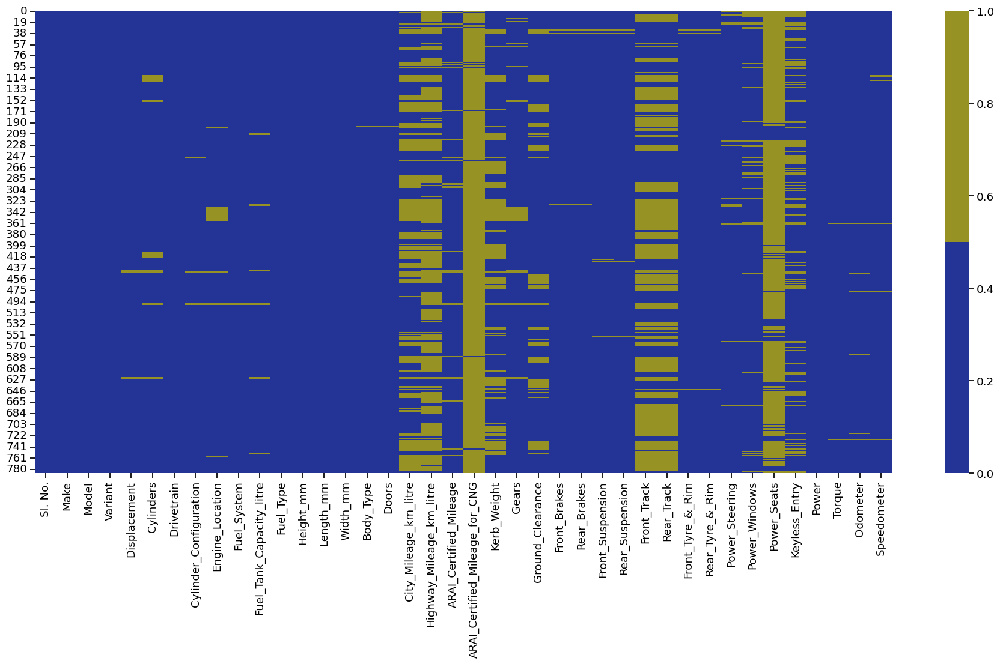

In [51]:
selected_columns = df.columns[:40]
color_palette = ['#233496', '#969223']  # Blue for not missing, yellow for missing
fig, ax = plt.subplots()
sns.heatmap(df[selected_columns].isnull(), cmap=sns.color_palette(color_palette), ax=ax)

<AxesSubplot:>

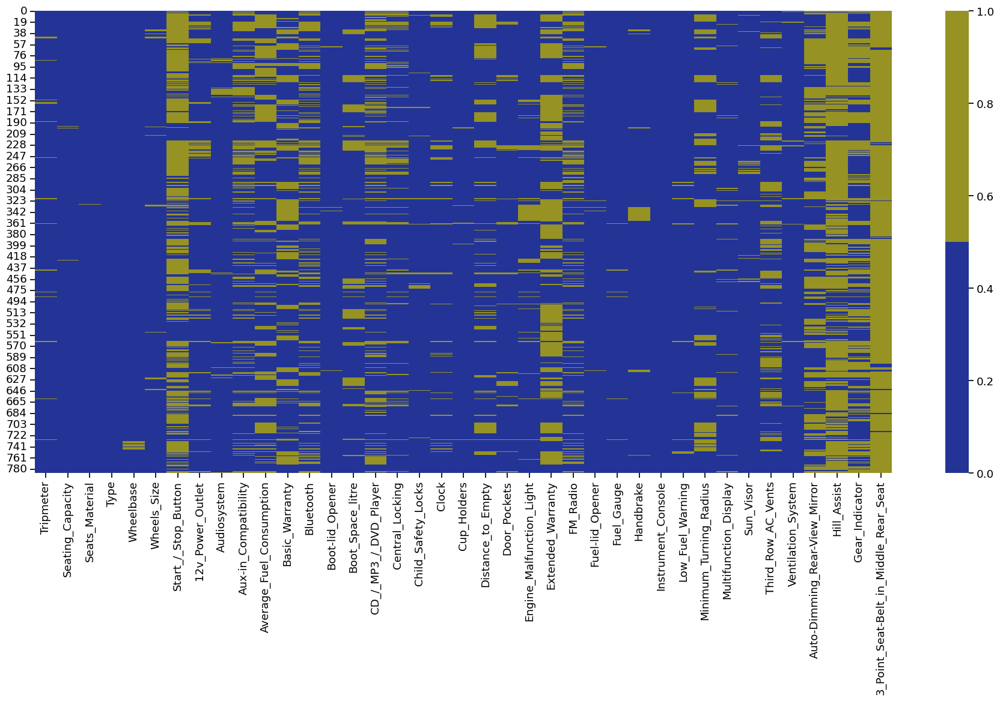

In [52]:
selected_columns = df.columns[41:80]
color_palette = ['#233496', '#969223']  # Blue for not missing, yellow for missing
fig, ax = plt.subplots()
sns.heatmap(df[selected_columns].isnull(), cmap=sns.color_palette(color_palette), ax=ax)

<AxesSubplot:>

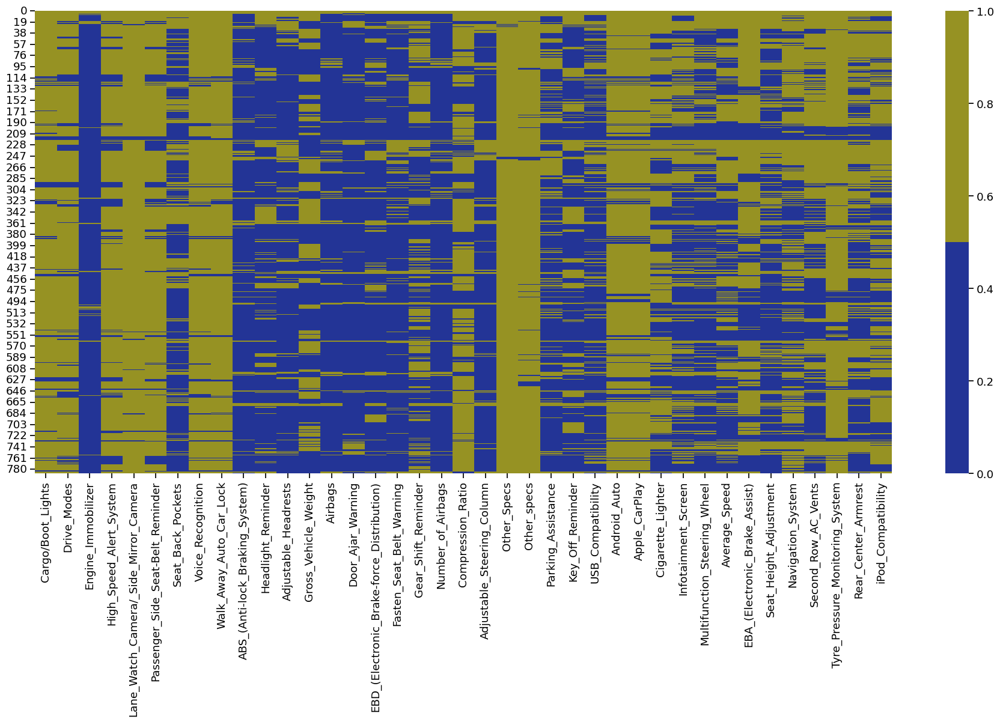

In [53]:
selected_columns = df.columns[81:120]
color_palette = ['#233496', '#969223']  # Blue for not missing, yellow for missing
fig, ax = plt.subplots()
sns.heatmap(df[selected_columns].isnull(), cmap=sns.color_palette(color_palette), ax=ax)

<AxesSubplot:>

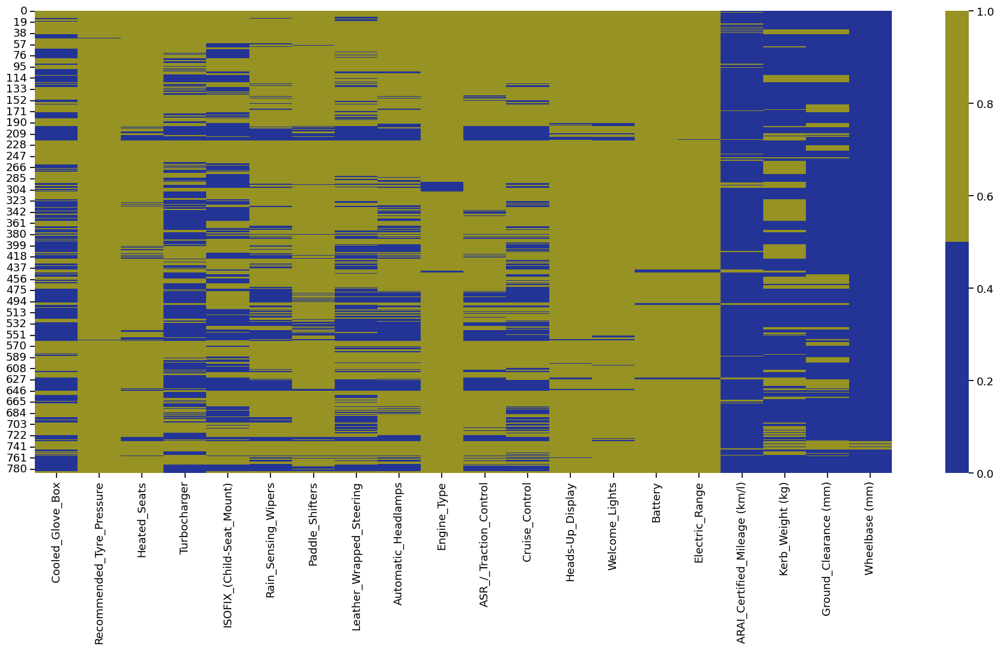

In [54]:
selected_columns = df.columns[121:]
color_palette = ['#233496', '#969223']  # Blue for not missing, yellow for missing
fig, ax = plt.subplots()
sns.heatmap(df[selected_columns].isnull(), cmap=sns.color_palette(color_palette), ax=ax)

## COOL GRAPHS

Text(0.5, 1.0, 'Relationship between Cylindersand Displacement')

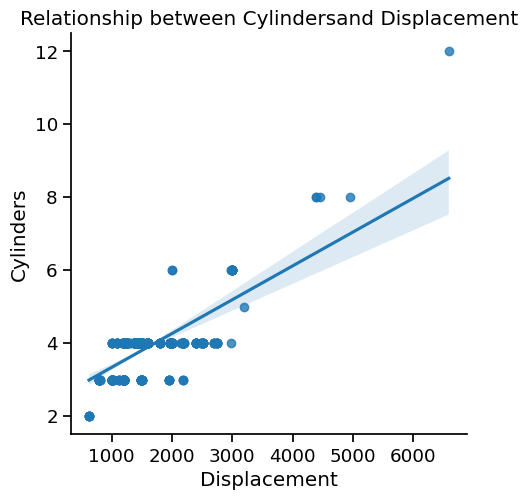

In [55]:
sns.lmplot(x='Displacement', y='Cylinders', data=df)
plt.xlabel('Displacement')
plt.ylabel('Cylinders')
plt.title('Relationship between Cylindersand Displacement')

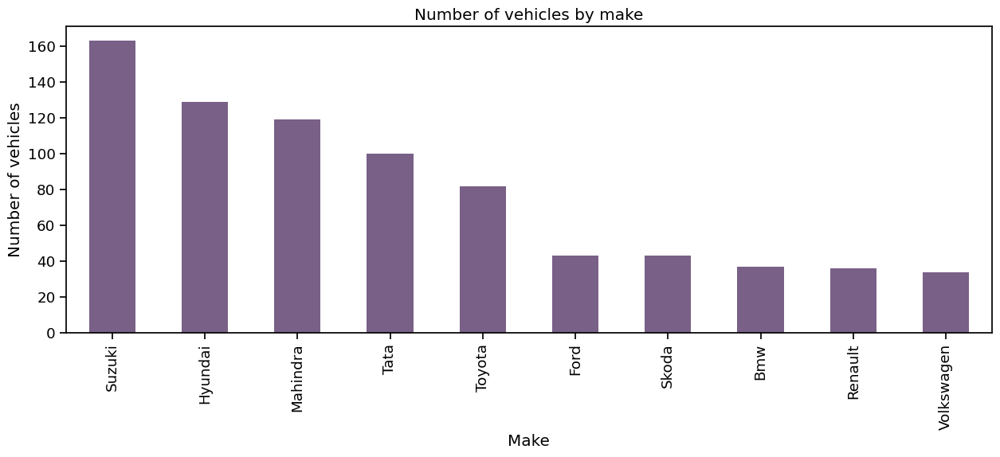

In [56]:
df.Make.value_counts().nlargest(10).plot(kind='bar', figsize=(15,5), color = '#796087')
plt.title("Number of vehicles by make")
plt.ylabel('Number of vehicles')
plt.xlabel('Make');

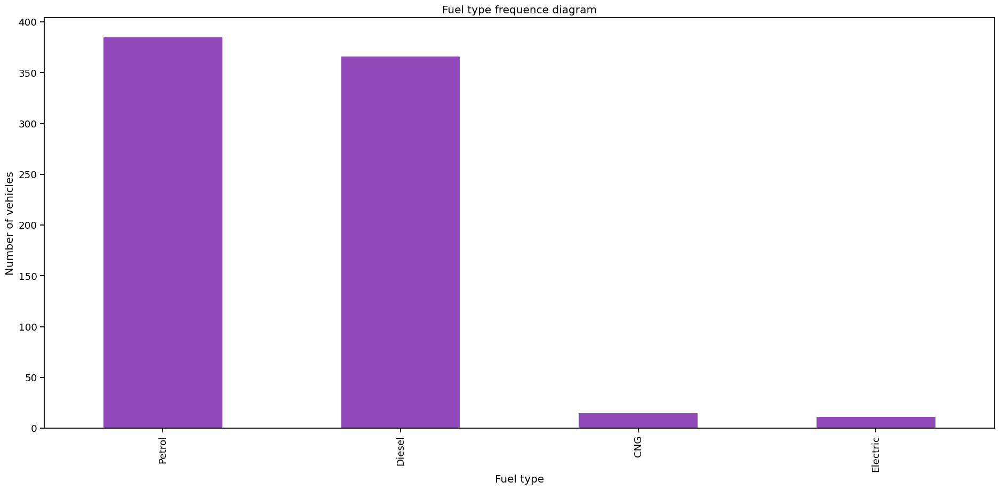

In [57]:
df['Fuel_Type'].value_counts().nlargest(4).plot(kind='bar',color='#9149ba')
plt.title("Fuel type frequence diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Fuel type');

Text(0.5, 1.0, 'City Mileage vs. Highway Mileage')

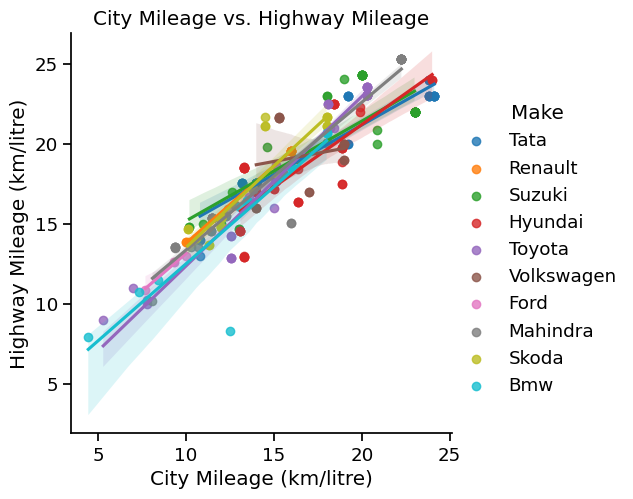

In [58]:
sns.lmplot(x='City_Mileage_km_litre', y='Highway_Mileage_km_litre', data=df, hue='Make')
plt.xlabel('City Mileage (km/litre)')
plt.ylabel('Highway Mileage (km/litre)')
plt.title('City Mileage vs. Highway Mileage')

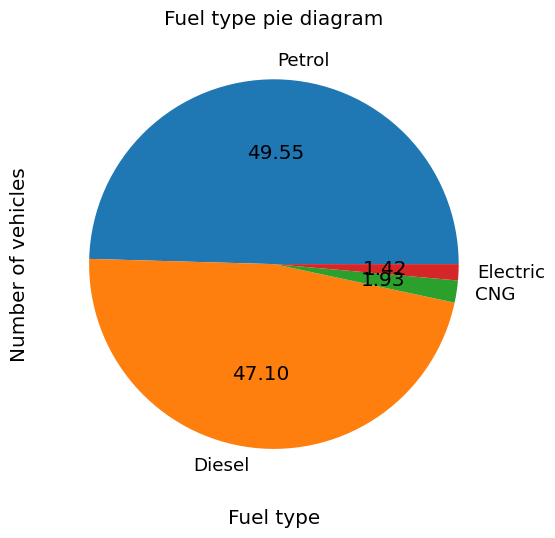

In [59]:
df['Fuel_Type'].value_counts().nlargest(4).plot.pie(figsize=(6, 6), autopct='%.2f')
plt.title("Fuel type pie diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Fuel type');

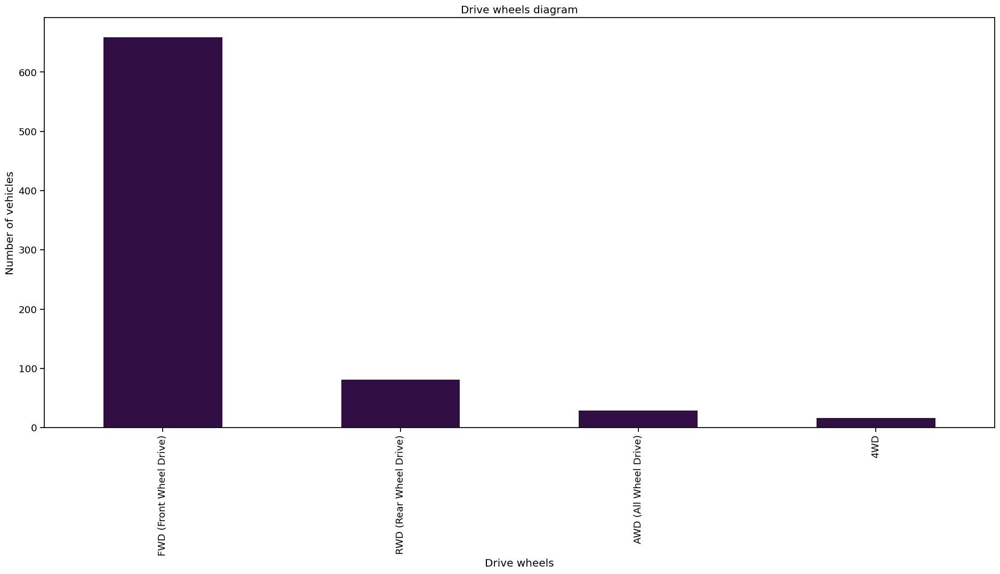

In [60]:
df['Drivetrain'].value_counts().plot(kind='bar',color='#310f45')
plt.title("Drive wheels diagram")
plt.ylabel('Number of vehicles')
plt.xlabel('Drive wheels');

Text(0.5, 1.0, 'Relationship between Cylinder sand Displacement')

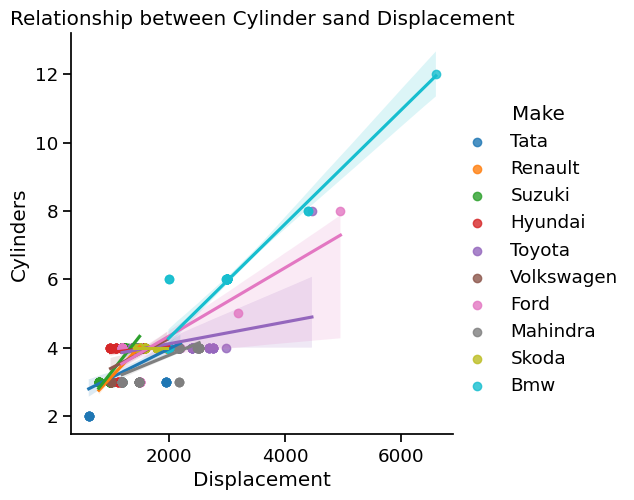

In [61]:
sns.lmplot(x='Displacement', y='Cylinders', data=df, hue='Make')
plt.xlabel('Displacement')
plt.ylabel('Cylinders')
plt.title('Relationship between Cylinder sand Displacement')

Text(0.5, 1.0, 'Relationship between Displacement and ftc')

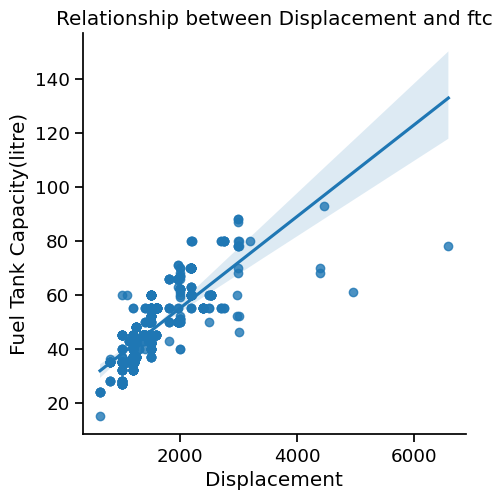

In [62]:
sns.lmplot(x='Displacement', y='Fuel_Tank_Capacity_litre', data=df)
plt.xlabel('Displacement')
plt.ylabel('Fuel Tank Capacity(litre)')
plt.title('Relationship between Displacement and ftc')

Text(0.5, 1.0, 'Relationship between Displacement and length')

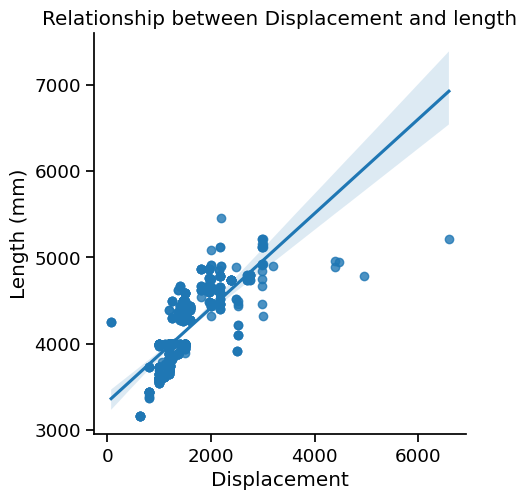

In [63]:
sns.lmplot(x='Displacement', y='Length_mm', data=df)
plt.xlabel('Displacement')
plt.ylabel('Length (mm)')
plt.title('Relationship between Displacement and length')

Text(0.5, 1.0, 'Relationship between Displacement and highway mileage')

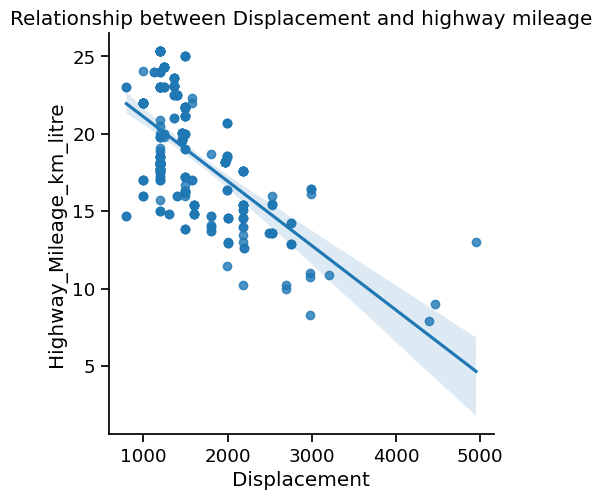

In [64]:
sns.lmplot(x='Displacement', y='Highway_Mileage_km_litre', data=df)
plt.xlabel('Displacement')
plt.ylabel('Highway_Mileage_km_litre')
plt.title('Relationship between Displacement and highway mileage') # was curious to see a highly negatively correlated one

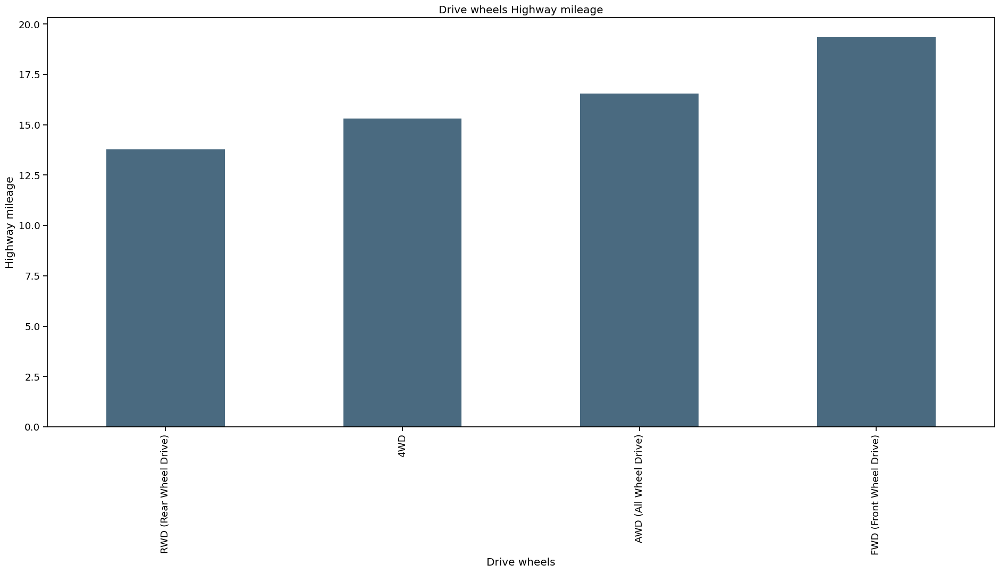

In [65]:
df.groupby('Drivetrain')['Highway_Mileage_km_litre'].mean().sort_values().plot(kind='bar', color = '#4a6a80');
plt.title("Drive wheels Highway mileage")
plt.ylabel('Highway mileage')
plt.xlabel('Drive wheels');

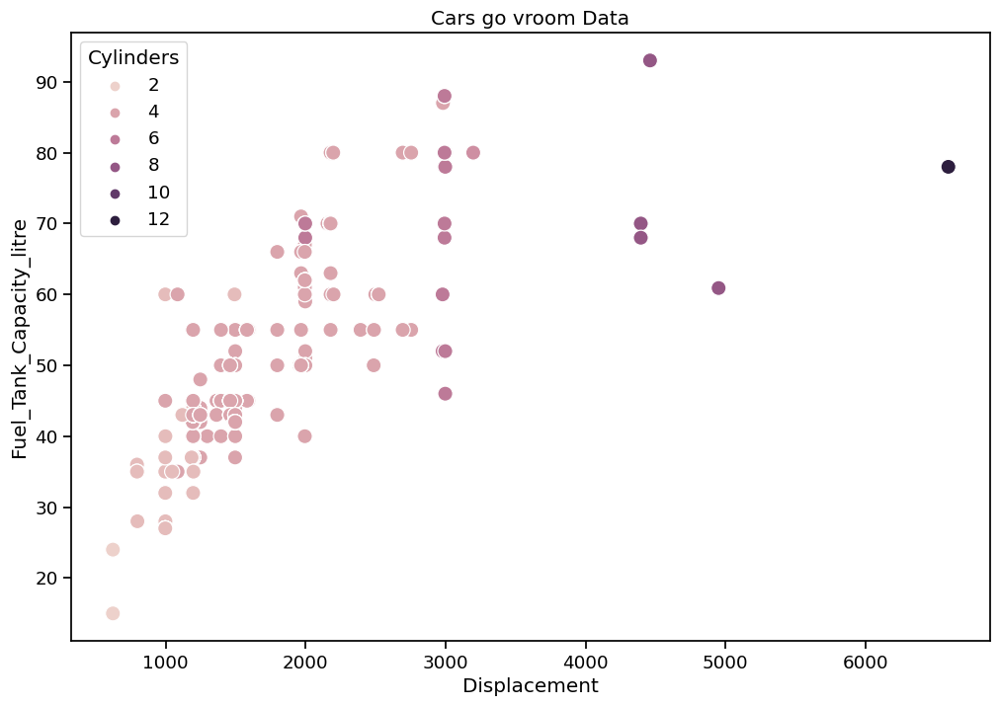

In [66]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Displacement', y='Fuel_Tank_Capacity_litre', hue='Cylinders', data=df, s=120)
plt.title('Cars go vroom Data')
plt.show()

<Figure size 1200x800 with 0 Axes>

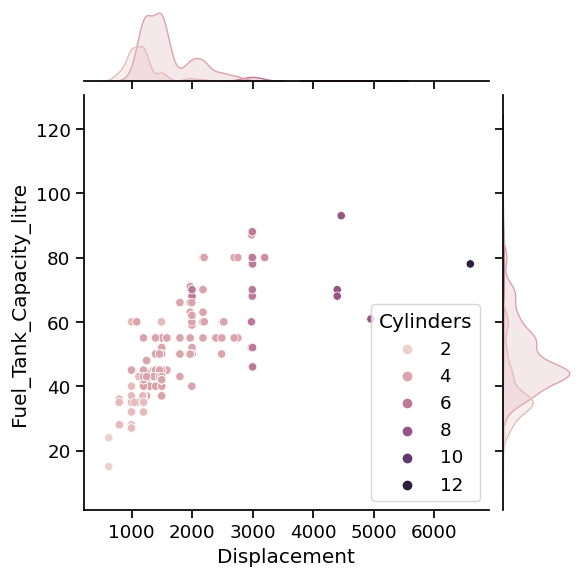

In [67]:
plt.figure(figsize=(12, 8))
sns.jointplot(x='Displacement', y='Fuel_Tank_Capacity_litre', data=df,  hue='Cylinders')
plt.show();

<Figure size 1200x800 with 0 Axes>

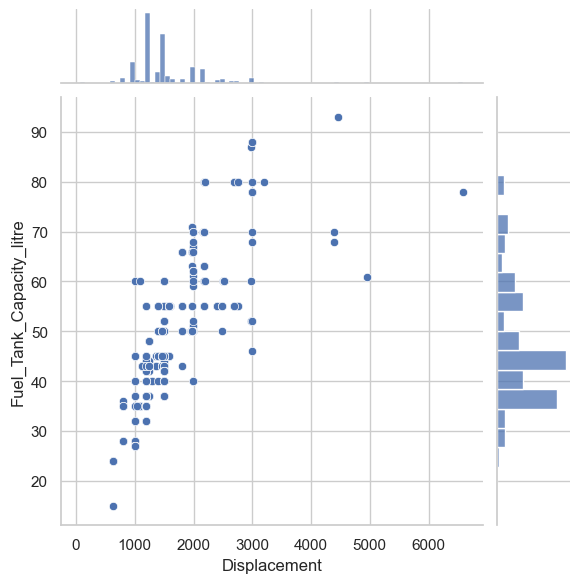

In [68]:
plt.figure(figsize=(12, 8))
sns.set_theme(style='whitegrid')
sns.jointplot(x='Displacement', y='Fuel_Tank_Capacity_litre', data=df)
plt.show()

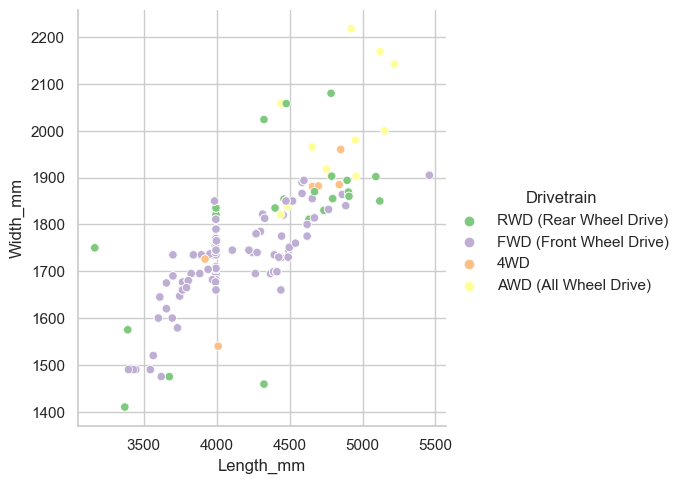

In [69]:
sns.relplot(x = 'Length_mm',y = 'Width_mm', data=df , kind = 'scatter',hue = 'Drivetrain',palette = 'Accent')
plt.show()

C:\Users\SamanthaBusunt\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


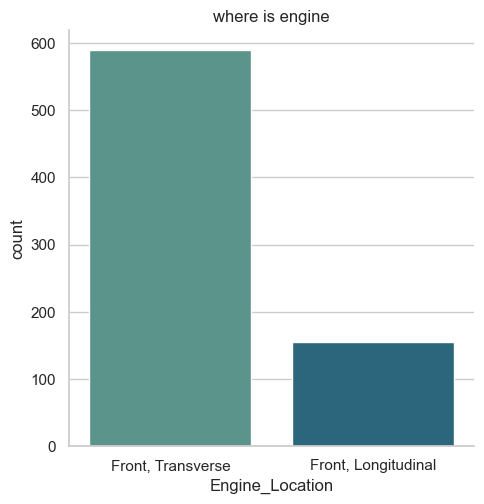

In [70]:
top_categories = df['Engine_Location'].value_counts().nlargest(2).index
filtered_df = df[df['Engine_Location'].isin(top_categories)]
sns.catplot('Engine_Location', data=filtered_df, order=top_categories, kind='count', palette='crest')
plt.title("where is engine")
plt.show()

Text(0.5, 1.0, 'Displacement / Width')

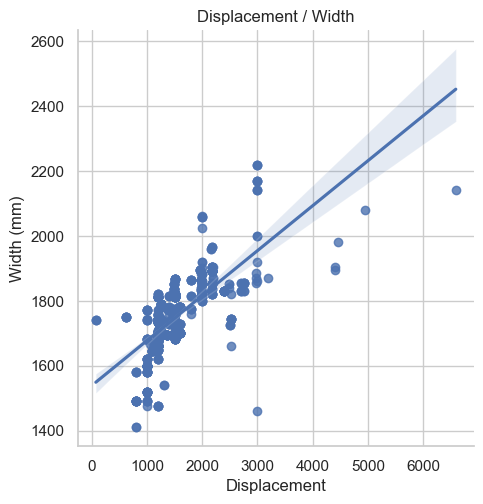

In [71]:
sns.lmplot(x='Displacement', y='Width_mm', data=df)
plt.xlabel('Displacement')
plt.ylabel('Width (mm)')
plt.title('Displacement / Width')

Text(0.5, 1.0, 'Is having a lot of displacement proportional to the number of airbags in the car?')

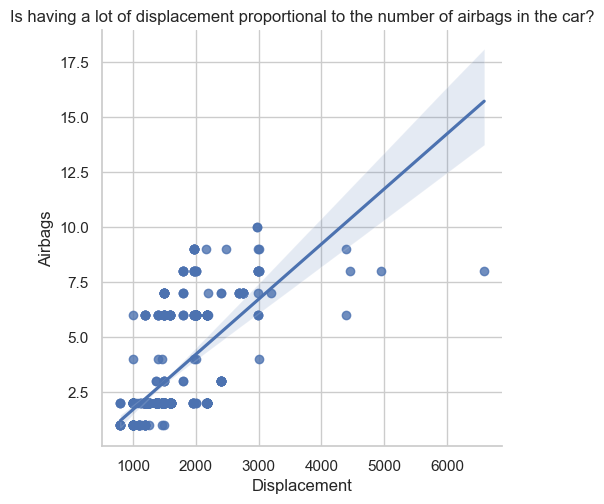

In [86]:
sns.lmplot(x='Displacement', y='Number_of_Airbags', data=df)
plt.xlabel('Displacement')
plt.ylabel('Airbags')
plt.title('Is having a lot of displacement proportional to the number of airbags in the car?')

<Figure size 1000x800 with 0 Axes>

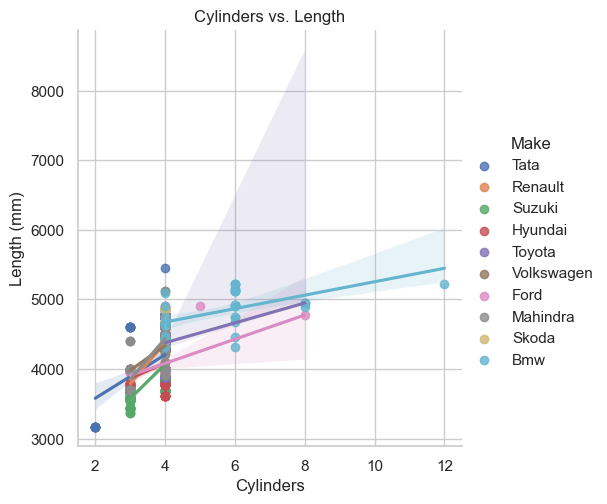

In [100]:
sns.set_context("notebook")
plt.figure(figsize=(10, 8))
plot = sns.lmplot(x='Cylinders', y='Length_mm', data=df, hue='Make')
plot.set(xlabel='Cylinders', ylabel='Length (mm)', title='Cylinders vs. Length')
plt.show()

In [72]:
df.to_csv('carsss.csv') #importing into csv

In [74]:
brand_model_counts = df.groupby('Make')['Model'].nunique()
most_common_brand = brand_model_counts.idxmax()
print("The car brand with the highest number of models represented is:", most_common_brand)

The car brand with the highest number of models represented is: Suzuki


The car brand with the highest number of models represented is: Suzuki

Model Counts by Brand (Ascending Order):
Make
Suzuki        22
Mahindra      17
Hyundai       14
Tata          14
Bmw           13
Toyota        12
Skoda          7
Ford           6
Renault        5
Volkswagen     5
Name: Model, dtype: int64


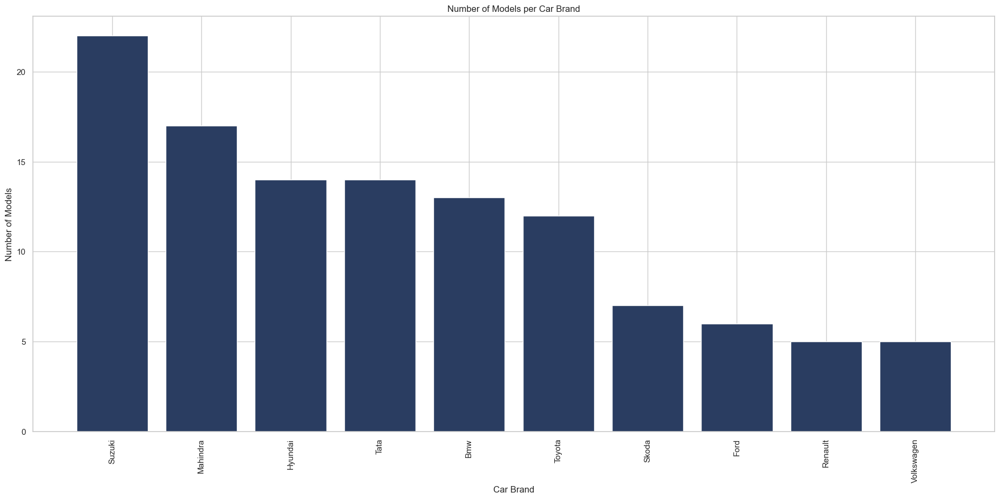

In [78]:
brand_model_counts_sorted = brand_model_counts.sort_values(ascending=False)
most_common_brand_sorted = brand_model_counts_sorted.idxmax()
print("The car brand with the highest number of models represented is:", most_common_brand_sorted)
print("\nModel Counts by Brand (Ascending Order):")
print(brand_model_counts_sorted)
plt.bar(brand_model_counts_sorted.index, brand_model_counts_sorted.values, color = '#2a3d61')
plt.xlabel('Car Brand')
plt.ylabel('Number of Models')
plt.title('Number of Models per Car Brand')
plt.xticks(rotation=90)
plt.show()

Top 5 Most Fuel-Efficient Cars:
Toyota Land Cruiser: 93.0 L
Bmw 6-Series: 88.0 L
Bmw 6-Series: 88.0 L
Toyota Land Cruiser Prado: 87.0 L
Ford Endeavour: 80.0 L


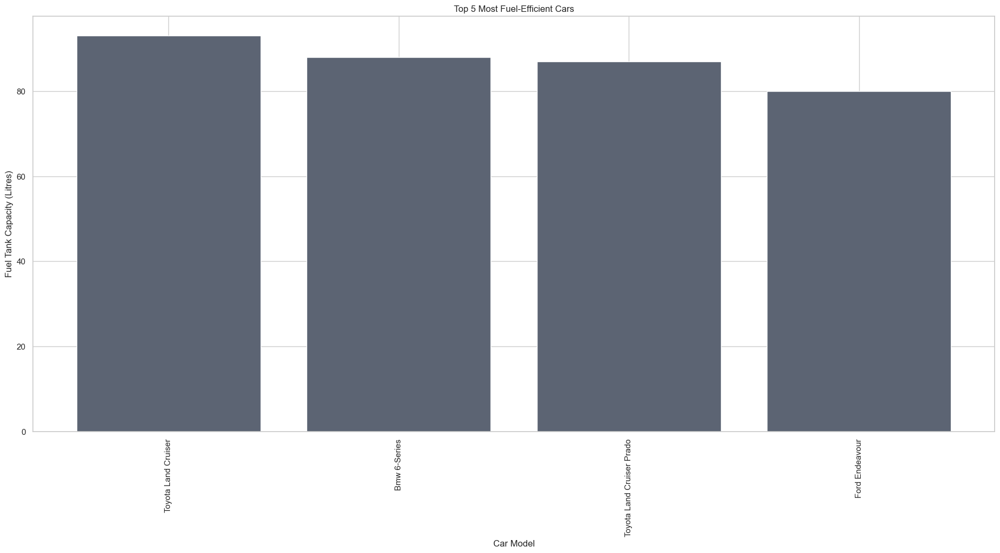

In [87]:
df_sorted = df.sort_values('Fuel_Tank_Capacity_litre', ascending=False)
top_5_fuel_efficient = df_sorted.head(5)

car_brands = top_5_fuel_efficient['Make']
car_models = top_5_fuel_efficient['Model']
fuel_tank_capacities = top_5_fuel_efficient['Fuel_Tank_Capacity_litre']

print("Top 5 Most Fuel-Efficient Cars:")
for brand, model, fuel_capacity in zip(car_brands, car_models, fuel_tank_capacities):
    print(f"{brand} {model}: {fuel_capacity} L")

plt.bar(car_brands + ' ' + car_models, fuel_tank_capacities, color = '#5c6473')
plt.xlabel('Car Model')
plt.ylabel('Fuel Tank Capacity (Litres)')
plt.title('Top 5 Most Fuel-Efficient Cars')
plt.xticks(rotation=90)
plt.show()

Sedan Car with the Highest Top Power:
Brand: Bmw
Model: M5
Top Power: 625.0


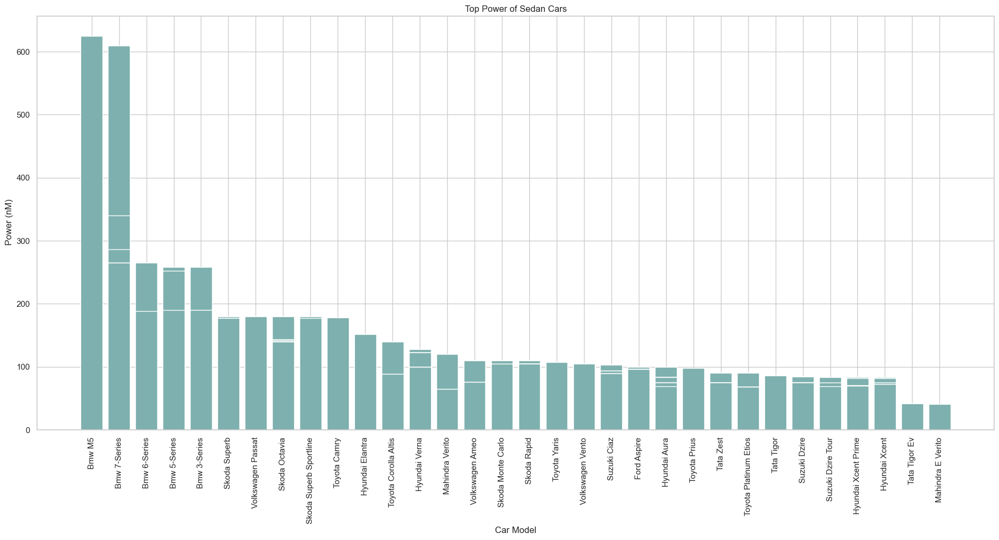

In [95]:
sedan_df = df[df['Body_Type'] == 'Sedan']
sedan_df_sorted = sedan_df.sort_values('Power', ascending=False)

highest_power_sedan = sedan_df_sorted.iloc[0]
brand = highest_power_sedan['Make']
model = highest_power_sedan['Model']
top_power = highest_power_sedan['Power']

print("Sedan Car with the Highest Top Power:")
print("Brand:", brand)
print("Model:", model)
print("Top Power:", top_power)

plt.bar(sedan_df_sorted['Make'] + ' ' + sedan_df_sorted['Model'], sedan_df_sorted['Power'], color = '#7db0ae')
plt.xlabel('Car Model')
plt.ylabel(' Power (nM)')
plt.title('Top Power of Sedan Cars')
plt.xticks(rotation=90)
plt.show()

In [104]:
manual_cars = df[df['Type'] == 'Manual']
auto_cars = df[df['Type'] == 'Automatic']

avg_power_manual = manual_cars['Power'].mean()
avg_power_auto = auto_cars['Power'].mean()

power_difference = avg_power_auto - avg_power_manual

print("Average Power Difference between Manual and Automatic Transmission Cars:", power_difference)



Average Power Difference between Manual and Automatic Transmission Cars: 50.886972477064205


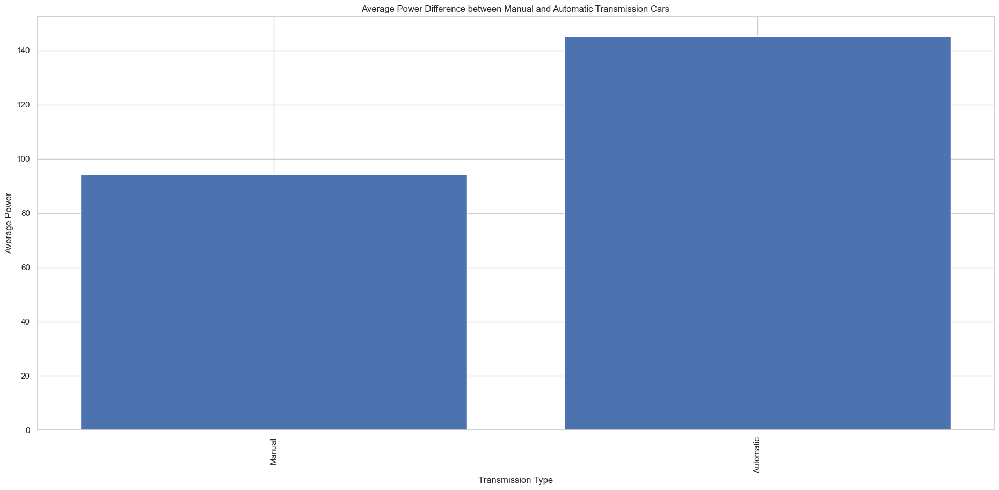

In [107]:
plt.bar(['Manual', 'Automatic'], [avg_power_manual, avg_power_auto])
plt.xlabel('Transmission Type')
plt.ylabel('Average Power')
plt.title('Average Power Difference between Manual and Automatic Transmission Cars')
plt.xticks(rotation=90)
plt.show()


Hatchback Model with the Highest Kerb Capacity in kg:
Brand: Hyundai
Model: Elite I20


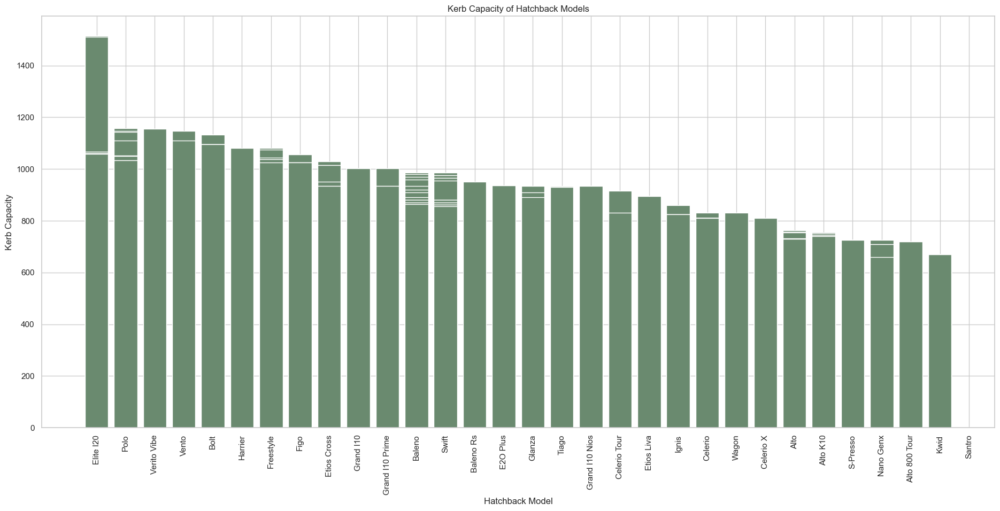

In [111]:
hatchback_df = df[df['Body_Type'] == 'Hatchback']
hatchback_df_sorted = hatchback_df.sort_values('Kerb_Weight (kg)', ascending=False)

highest_kerb_capacity = hatchback_df_sorted.iloc[0]

brand = highest_kerb_capacity['Make']
model = highest_kerb_capacity['Model']

print("Hatchback Model with the Highest Kerb Capacity in kg:")
print("Brand:", brand)
print("Model:", model)

plt.bar(hatchback_df_sorted['Model'], hatchback_df_sorted['Kerb_Weight (kg)'], color = '#6a8a6f')
plt.xlabel('Hatchback Model')
plt.ylabel('Kerb Capacity')
plt.title('Kerb Capacity of Hatchback Models')
plt.xticks(rotation=90)
plt.show()

SUV Model with the Highest Boot Space Capacity:
Brand: Tata
Model: Safari Storme


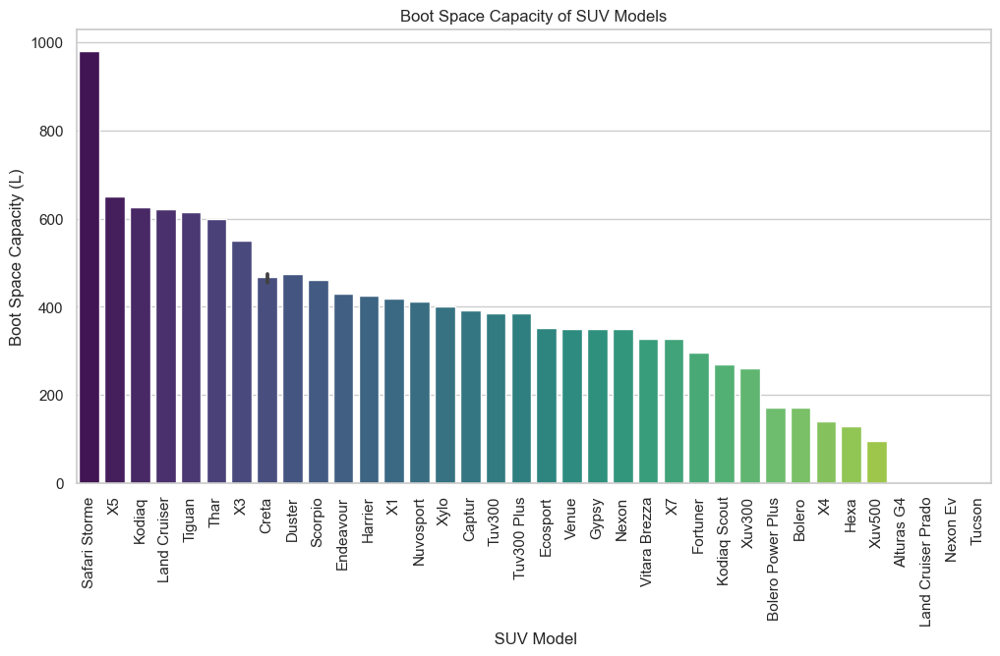

In [113]:
compact_suv_df = df[df['Body_Type'] == 'SUV']

compact_suv_df_sorted = compact_suv_df.sort_values('Boot_Space_litre', ascending=False)

# Selecting the compact SUV model with the highest boot space capacity
highest_boot_space = compact_suv_df_sorted.iloc[0]

# Extracting the brand and model of the compact SUV with the highest boot space capacity
brand = highest_boot_space['Make']
model = highest_boot_space['Model']

# Printing the compact SUV model with the highest boot space capacity and its brand
print("SUV Model with the Highest Boot Space Capacity:")
print("Brand:", brand)
print("Model:", model)

# Creating a bar plot using seaborn to visualize the boot space capacity of compact SUV models
plt.figure(figsize=(12, 6))
sns.barplot(data=compact_suv_df_sorted, x='Model', y='Boot_Space_litre', palette='viridis')
plt.xlabel(' SUV Model')
plt.ylabel('Boot Space Capacity (L)')
plt.title('Boot Space Capacity of SUV Models')
plt.xticks(rotation=90)
plt.show()

Brand with the Most Diverse Range of Engine Types: Tata


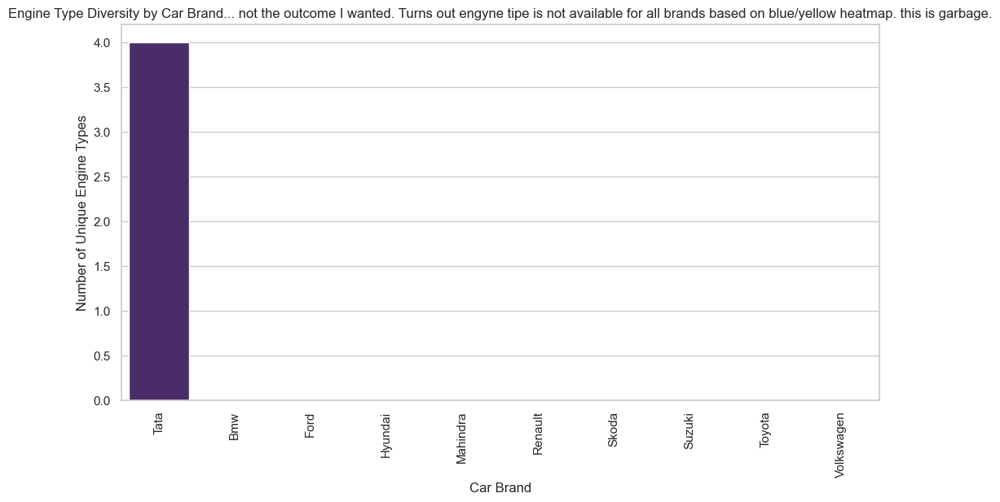

In [127]:
engine_type_counts = df.groupby('Make')['Engine_Type'].nunique().sort_values(ascending=False)

most_diverse_brand = engine_type_counts.idxmax()

# Printing the brand with the most diverse range of engine types
print("Brand with the Most Diverse Range of Engine Types:", most_diverse_brand)

# Creating a bar plot using seaborn to visualize the engine type diversity for each brand
plt.figure(figsize=(12, 6))
sns.barplot(x=engine_type_counts.index, y=engine_type_counts.values, palette='viridis')
plt.xlabel('Car Brand')
plt.ylabel('Number of Unique Engine Types')
plt.title('Engine Type Diversity by Car Brand... not the outcome I wanted. Turns out engyne tipe is not available for all brands based on blue/yellow heatmap. this is garbage.')
plt.xticks(rotation=90)
plt.show()

In [116]:
df['Type']

0         Manual
1         Manual
2         Manual
3      Automatic
4         Manual
         ...    
782    Automatic
783    Automatic
784       Manual
785       Manual
786       Manual
Name: Type, Length: 786, dtype: object

SUV Model with the Highest Ground Clearance (mm): 
Brand: Bmw
Model: X4
Ground clearance: Sl. No.                                          556
Make                                             Bmw
Model                                             X4
Variant                          Xdrive20D M Sport X
Displacement                                  1995.0
                                        ...         
Electric_Range                                   NaN
ARAI_Certified_Mileage (km/l)                   16.4
Kerb_Weight (kg)                              1740.0
Ground_Clearance (mm)                          498.0
Wheelbase (mm)                                2864.0
Name: 555, Length: 141, dtype: object mm


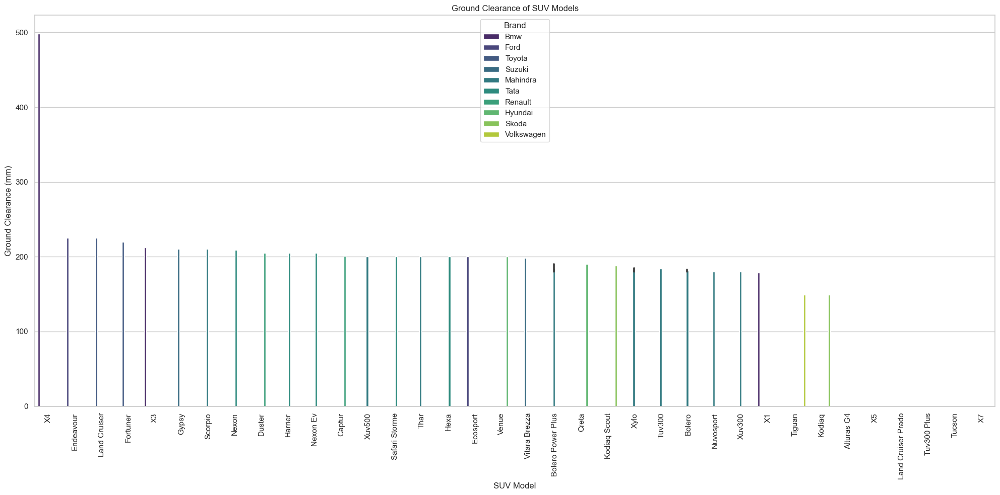

In [122]:
suv_df = df[df['Body_Type'] == 'SUV']

suv_df_sorted = suv_df.sort_values('Ground_Clearance (mm)', ascending=False)

highest_ground_clearance_model = suv_df_sorted.iloc[0]

brand = highest_ground_clearance_model['Make']
model = highest_ground_clearance_model['Model']

print("SUV Model with the Highest Ground Clearance (mm): ")
print("Brand:", brand)
print("Model:", model)
print('Ground clearance:', highest_ground_clearance_model, 'mm')

plt.figure(figsize=(20, 10))
sns.barplot(data=suv_df_sorted, x='Model', y='Ground_Clearance (mm)', hue='Make', palette='viridis')
plt.xlabel('SUV Model')
plt.ylabel('Ground Clearance (mm)')
plt.title('Ground Clearance of SUV Models')
plt.xticks(rotation=90)
plt.legend(title='Brand')
plt.tight_layout()
plt.show()

Sedan Model with the Highest Fuel Tank Capacity:
Brand: Bmw
Model: 6-Series


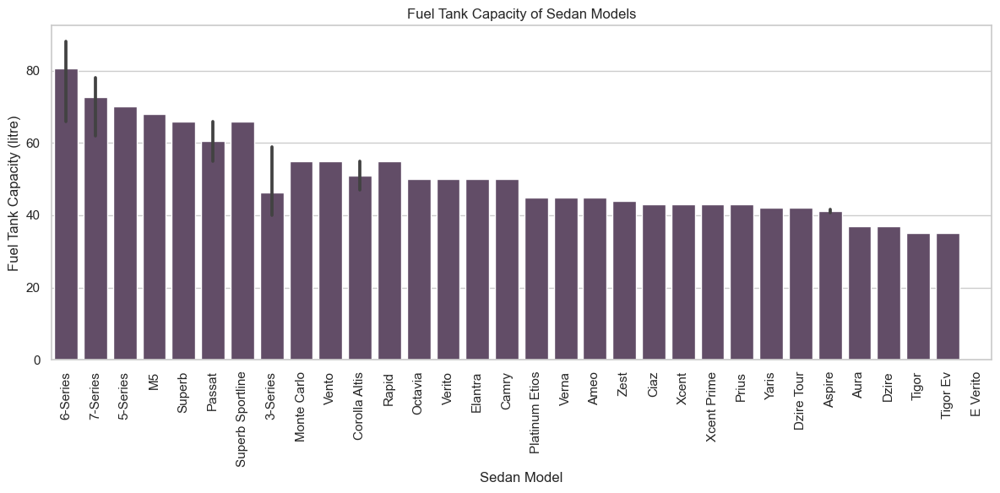

In [124]:
sedan_df = df[df['Body_Type'] == 'Sedan']

sedan_df_sorted = sedan_df.sort_values('Fuel_Tank_Capacity_litre', ascending=False)

highest_fuel_capacity_model = sedan_df_sorted.iloc[0]

brand = highest_fuel_capacity_model['Make']
model = highest_fuel_capacity_model['Model']

print("Sedan Model with the Highest Fuel Tank Capacity:")
print("Brand:", brand)
print("Model:", model)

plt.figure(figsize=(12, 6))
sns.barplot(data=sedan_df_sorted, x='Model', y='Fuel_Tank_Capacity_litre', color='#65496b')
plt.xlabel('Sedan Model')
plt.ylabel('Fuel Tank Capacity (litre)')
plt.title('Fuel Tank Capacity of Sedan Models')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Sedan Car with the Highest Top Torque:
Brand: Bmw
Model: 7-Series
Top Power: 850.0


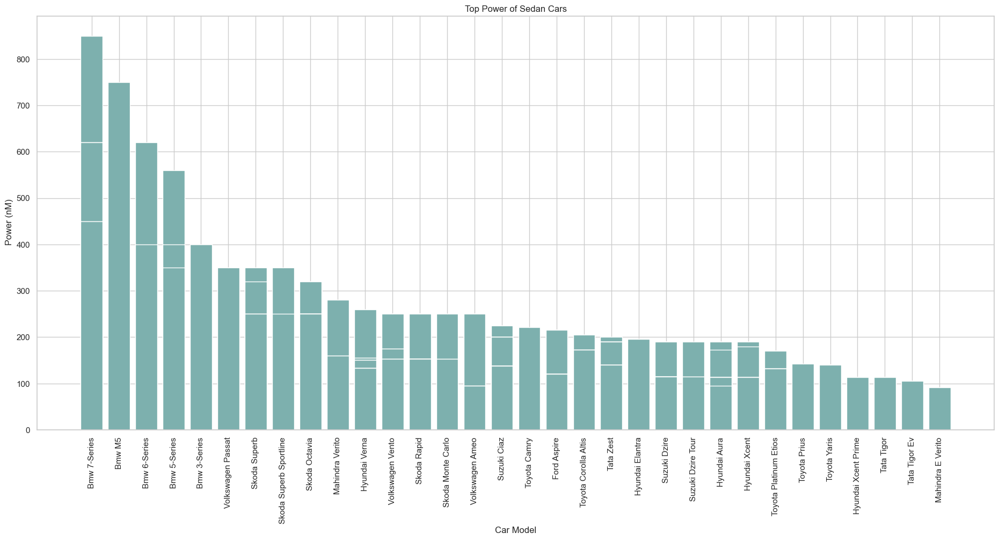

In [125]:
sedan_df = df[df['Body_Type'] == 'Sedan']
sedan_df_sorted = sedan_df.sort_values('Torque', ascending=False)

highest_power_sedan = sedan_df_sorted.iloc[0]
brand = highest_power_sedan['Make']
model = highest_power_sedan['Model']
top_power = highest_power_sedan['Torque']

print("Sedan Car with the Highest Top Torque:")
print("Brand:", brand)
print("Model:", model)
print("Top Power:", top_power)

plt.bar(sedan_df_sorted['Make'] + ' ' + sedan_df_sorted['Model'], sedan_df_sorted['Torque'], color = '#7db0ae')
plt.xlabel('Car Model')
plt.ylabel(' Power (nM)')
plt.title('Top Power of Sedan Cars')
plt.xticks(rotation=90)
plt.show()